# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# # '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
# '1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
# '1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# # '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',

'1WmEF9RKufpJ6uXsh02wKGbgGqoP1ZotV': 'edges2shoes.zip',
'1bH_1HV2JQ7znLHjet9MwRC6LPu2TlNbo': 'CycleGAN_support.zip',
'1JtoaaExiINNjZFAlSfKUupsOTO7AWuKg': 'test_case.zip',
'1uOGjcuwYH2mItJCvHcRq0R_1vz_9R_gJ': 'inception_score.py'
}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [3]:
! unzip -q edges2shoes.zip
! unzip -q CycleGAN_support.zip
! unzip -q test_case.zip

# CycleGAN training

In [4]:
!pip install torchvision==0.10.1
!pip install torch==1.9.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.1 MB 35.5 MB/s 
     |████████████████████████████████| 831.4 MB 9.5 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0+cu116
    Uninstalling torch-1.13.0+cu116:
      Successfully uninstalled torch-1.13.0+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0+cu116
    Uninstalling torchvision-0.14.0+cu116:
      Successfully uninstalled torchvision-0.14.0+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.0 requires torch==1.13.0, but you have torch 1.9.1 which is incompatible.
torchaudio 0.13.0+cu116 requires torch==1.13.0, but you have torch 1.9.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-pytho

In [5]:
import torch
import pdb

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts: 
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and 
    distance between D(G(real_B)) part and 0. 
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch 
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''
    L_real = criterion_GAN(D(real2D),valid)
    L_fake = criterion_GAN(D(fakefG),fake)
    loss_D = L_real + L_fake   

    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    fake_o_G = G(real2G)
    loss_G = criterion_GAN(D(fake_o_G), valid)
    return loss_G, fake_o_G



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    rec_A = G(fakefG)
    loss_cycle = criterion_cycle(rec_A, real)  

    return loss_cycle


# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.1760246753692627
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164876937866211
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


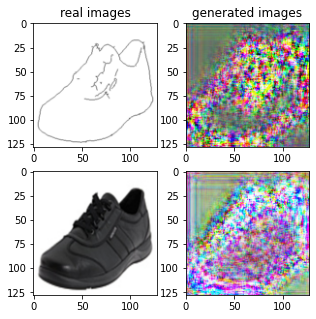

Train Epoch: 1 0% 	Total Loss: 9.098048 	Loss_G_AB: 1.731235	Loss_G_BA: 1.431945	Loss_cycle: 4.131357	Loss_D_A: 1.373503	Loss_D_B: 2.011598
0 9 T:  1.633591651916504
Train Epoch: 1 0% 	Total Loss: 4.956407 	Loss_G_AB: 1.180583	Loss_G_BA: 1.050968	Loss_cycle: 1.913895	Loss_D_A: 0.946860	Loss_D_B: 0.979877
0 19 T:  1.0845003128051758
Train Epoch: 1 0% 	Total Loss: 4.197509 	Loss_G_AB: 1.045963	Loss_G_BA: 1.150278	Loss_cycle: 1.523662	Loss_D_A: 0.695104	Loss_D_B: 0.880624
0 29 T:  1.0785017013549805
Train Epoch: 1 0% 	Total Loss: 3.469509 	Loss_G_AB: 0.867856	Loss_G_BA: 0.759431	Loss_cycle: 1.507755	Loss_D_A: 0.538047	Loss_D_B: 0.610063
0 39 T:  1.0785150527954102
Train Epoch: 1 0% 	Total Loss: 3.755009 	Loss_G_AB: 0.689463	Loss_G_BA: 0.860883	Loss_cycle: 2.010830	Loss_D_A: 0.582827	Loss_D_B: 0.386179
0 49 T:  1.0910608768463135
Train Epoch: 1 0% 	Total Loss: 2.890584 	Loss_G_AB: 0.603827	Loss_G_BA: 0.715773	Loss_cycle: 1.495914	Loss_D_A: 0.323786	Loss_D_B: 0.411084
0 59 T:  1.07680535316

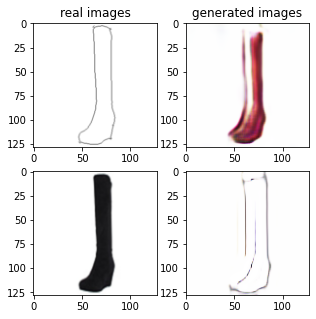

Train Epoch: 1 2% 	Total Loss: 1.759616 	Loss_G_AB: 0.428335	Loss_G_BA: 0.798300	Loss_cycle: 0.789374	Loss_D_A: 0.064335	Loss_D_B: 0.292589
0 1009 T:  1.7915332317352295
Train Epoch: 1 2% 	Total Loss: 1.635784 	Loss_G_AB: 0.372929	Loss_G_BA: 0.832373	Loss_cycle: 0.688808	Loss_D_A: 0.080416	Loss_D_B: 0.263909
0 1019 T:  1.1929423809051514
Train Epoch: 1 2% 	Total Loss: 1.813949 	Loss_G_AB: 0.331771	Loss_G_BA: 0.826992	Loss_cycle: 0.878905	Loss_D_A: 0.048917	Loss_D_B: 0.306746
0 1029 T:  1.1248211860656738
Train Epoch: 1 2% 	Total Loss: 1.884662 	Loss_G_AB: 0.314810	Loss_G_BA: 0.818091	Loss_cycle: 0.945967	Loss_D_A: 0.131733	Loss_D_B: 0.240511
0 1039 T:  1.126399040222168
Train Epoch: 1 2% 	Total Loss: 1.869139 	Loss_G_AB: 0.420576	Loss_G_BA: 0.820348	Loss_cycle: 0.896430	Loss_D_A: 0.064432	Loss_D_B: 0.287815
0 1049 T:  1.1280827522277832
Train Epoch: 1 2% 	Total Loss: 2.071948 	Loss_G_AB: 0.415149	Loss_G_BA: 0.852571	Loss_cycle: 1.072579	Loss_D_A: 0.107745	Loss_D_B: 0.257764
0 1059 T:  

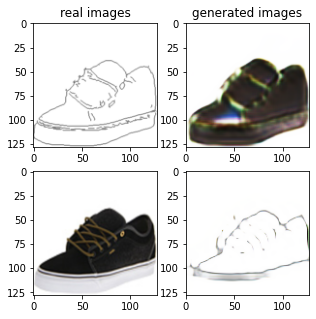

Train Epoch: 1 4% 	Total Loss: 1.703545 	Loss_G_AB: 0.361020	Loss_G_BA: 0.825662	Loss_cycle: 0.796809	Loss_D_A: 0.052814	Loss_D_B: 0.260581
0 2009 T:  1.892275333404541
Train Epoch: 1 4% 	Total Loss: 1.762979 	Loss_G_AB: 0.481527	Loss_G_BA: 0.901967	Loss_cycle: 0.743437	Loss_D_A: 0.044143	Loss_D_B: 0.283652
0 2019 T:  1.1523363590240479
Train Epoch: 1 4% 	Total Loss: 1.780744 	Loss_G_AB: 0.296092	Loss_G_BA: 0.882633	Loss_cycle: 0.862636	Loss_D_A: 0.069056	Loss_D_B: 0.259690
0 2029 T:  1.2096726894378662
Train Epoch: 1 4% 	Total Loss: 1.662580 	Loss_G_AB: 0.346628	Loss_G_BA: 0.796761	Loss_cycle: 0.736373	Loss_D_A: 0.096904	Loss_D_B: 0.257608
0 2039 T:  1.1484301090240479
Train Epoch: 1 4% 	Total Loss: 1.553234 	Loss_G_AB: 0.330506	Loss_G_BA: 0.805597	Loss_cycle: 0.682571	Loss_D_A: 0.066539	Loss_D_B: 0.236074
0 2049 T:  1.1483585834503174
Train Epoch: 1 4% 	Total Loss: 2.092134 	Loss_G_AB: 0.373959	Loss_G_BA: 0.994247	Loss_cycle: 1.088946	Loss_D_A: 0.086230	Loss_D_B: 0.232856
0 2059 T:  

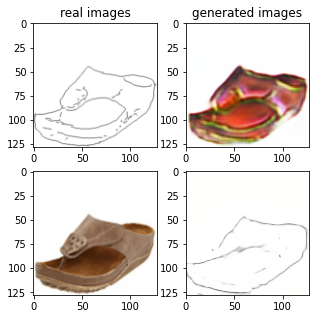

Train Epoch: 1 6% 	Total Loss: 1.652764 	Loss_G_AB: 0.323314	Loss_G_BA: 0.893169	Loss_cycle: 0.739009	Loss_D_A: 0.054658	Loss_D_B: 0.250856
0 3009 T:  1.909104585647583
Train Epoch: 1 6% 	Total Loss: 1.863447 	Loss_G_AB: 0.330293	Loss_G_BA: 0.997407	Loss_cycle: 0.893242	Loss_D_A: 0.034905	Loss_D_B: 0.271449
0 3019 T:  1.1673998832702637
Train Epoch: 1 6% 	Total Loss: 1.528733 	Loss_G_AB: 0.308964	Loss_G_BA: 0.815219	Loss_cycle: 0.649458	Loss_D_A: 0.069597	Loss_D_B: 0.247587
0 3029 T:  1.1739814281463623
Train Epoch: 1 6% 	Total Loss: 1.514586 	Loss_G_AB: 0.313525	Loss_G_BA: 0.796391	Loss_cycle: 0.676820	Loss_D_A: 0.045909	Loss_D_B: 0.236899
0 3039 T:  1.1842215061187744
Train Epoch: 1 6% 	Total Loss: 1.606932 	Loss_G_AB: 0.309099	Loss_G_BA: 0.781246	Loss_cycle: 0.727150	Loss_D_A: 0.095035	Loss_D_B: 0.239575
0 3049 T:  1.1876027584075928
Train Epoch: 1 6% 	Total Loss: 1.843690 	Loss_G_AB: 0.333285	Loss_G_BA: 0.848414	Loss_cycle: 0.914371	Loss_D_A: 0.087454	Loss_D_B: 0.251015
0 3059 T:  

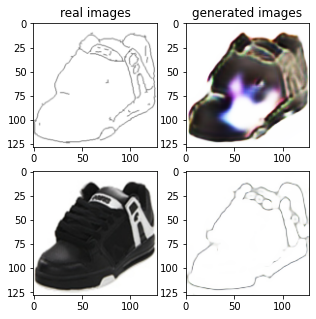

Train Epoch: 1 8% 	Total Loss: 2.132131 	Loss_G_AB: 0.321773	Loss_G_BA: 0.988911	Loss_cycle: 1.127441	Loss_D_A: 0.058816	Loss_D_B: 0.290532
0 4009 T:  1.8574533462524414
Train Epoch: 1 8% 	Total Loss: 1.584326 	Loss_G_AB: 0.348767	Loss_G_BA: 0.736620	Loss_cycle: 0.729586	Loss_D_A: 0.066144	Loss_D_B: 0.245903
0 4019 T:  1.1736598014831543
Train Epoch: 1 8% 	Total Loss: 1.804063 	Loss_G_AB: 0.334945	Loss_G_BA: 0.857697	Loss_cycle: 0.845494	Loss_D_A: 0.080358	Loss_D_B: 0.281890
0 4029 T:  1.1744863986968994
Train Epoch: 1 8% 	Total Loss: 1.849826 	Loss_G_AB: 0.295969	Loss_G_BA: 0.910180	Loss_cycle: 0.939702	Loss_D_A: 0.057965	Loss_D_B: 0.249085
0 4039 T:  1.1772239208221436
Train Epoch: 1 8% 	Total Loss: 1.571395 	Loss_G_AB: 0.339097	Loss_G_BA: 0.841223	Loss_cycle: 0.626489	Loss_D_A: 0.085558	Loss_D_B: 0.269187
0 4049 T:  1.1736316680908203
Train Epoch: 1 8% 	Total Loss: 1.720374 	Loss_G_AB: 0.386230	Loss_G_BA: 0.768917	Loss_cycle: 0.730649	Loss_D_A: 0.075516	Loss_D_B: 0.336636
0 4059 T: 

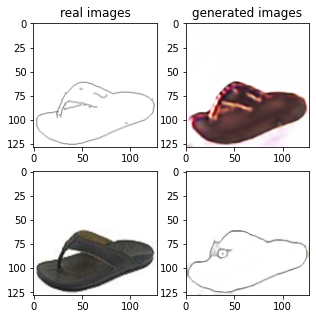

Train Epoch: 1 10% 	Total Loss: 1.754537 	Loss_G_AB: 0.292408	Loss_G_BA: 0.942291	Loss_cycle: 0.881312	Loss_D_A: 0.012412	Loss_D_B: 0.243464
0 5009 T:  2.0234005451202393
Train Epoch: 1 10% 	Total Loss: 1.649059 	Loss_G_AB: 0.317025	Loss_G_BA: 0.950425	Loss_cycle: 0.752830	Loss_D_A: 0.027850	Loss_D_B: 0.234654
0 5019 T:  1.1795673370361328
Train Epoch: 1 10% 	Total Loss: 1.820969 	Loss_G_AB: 0.312749	Loss_G_BA: 0.982197	Loss_cycle: 0.914694	Loss_D_A: 0.017640	Loss_D_B: 0.241163
0 5029 T:  1.1882407665252686
Train Epoch: 1 10% 	Total Loss: 1.576980 	Loss_G_AB: 0.285774	Loss_G_BA: 0.946146	Loss_cycle: 0.699938	Loss_D_A: 0.019853	Loss_D_B: 0.241229
0 5039 T:  1.1870877742767334
Train Epoch: 1 10% 	Total Loss: 1.824712 	Loss_G_AB: 0.309064	Loss_G_BA: 1.020429	Loss_cycle: 0.892320	Loss_D_A: 0.024939	Loss_D_B: 0.242705
0 5049 T:  1.1913847923278809
Train Epoch: 1 10% 	Total Loss: 1.475818 	Loss_G_AB: 0.326077	Loss_G_BA: 0.913017	Loss_cycle: 0.570521	Loss_D_A: 0.040387	Loss_D_B: 0.245363
0 50

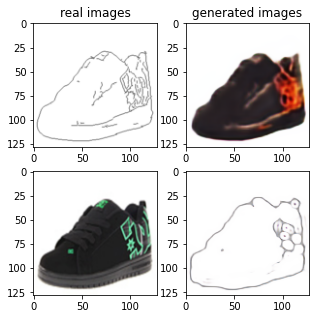

Train Epoch: 1 12% 	Total Loss: 1.742838 	Loss_G_AB: 0.338745	Loss_G_BA: 0.982103	Loss_cycle: 0.796862	Loss_D_A: 0.041471	Loss_D_B: 0.244081
0 6009 T:  1.8692288398742676
Train Epoch: 1 12% 	Total Loss: 1.516045 	Loss_G_AB: 0.326220	Loss_G_BA: 0.867300	Loss_cycle: 0.647807	Loss_D_A: 0.042507	Loss_D_B: 0.228971
0 6019 T:  1.1588053703308105
Train Epoch: 1 12% 	Total Loss: 1.706319 	Loss_G_AB: 0.336124	Loss_G_BA: 0.846656	Loss_cycle: 0.793693	Loss_D_A: 0.031874	Loss_D_B: 0.289361
0 6029 T:  1.1704719066619873
Train Epoch: 1 12% 	Total Loss: 1.626768 	Loss_G_AB: 0.286125	Loss_G_BA: 1.015716	Loss_cycle: 0.698956	Loss_D_A: 0.041998	Loss_D_B: 0.234895
0 6039 T:  1.1684377193450928
Train Epoch: 1 12% 	Total Loss: 1.533503 	Loss_G_AB: 0.297963	Loss_G_BA: 0.855586	Loss_cycle: 0.637845	Loss_D_A: 0.046761	Loss_D_B: 0.272122
0 6049 T:  1.1765859127044678
Train Epoch: 1 12% 	Total Loss: 1.827860 	Loss_G_AB: 0.283676	Loss_G_BA: 0.783158	Loss_cycle: 0.899303	Loss_D_A: 0.126658	Loss_D_B: 0.268482
0 60

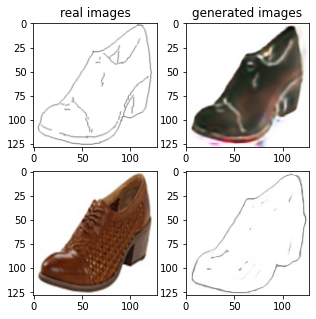

Train Epoch: 1 14% 	Total Loss: 1.783820 	Loss_G_AB: 0.288471	Loss_G_BA: 1.047173	Loss_cycle: 0.812102	Loss_D_A: 0.013333	Loss_D_B: 0.290563
0 7009 T:  1.9050753116607666
Train Epoch: 1 14% 	Total Loss: 1.441947 	Loss_G_AB: 0.296732	Loss_G_BA: 0.999077	Loss_cycle: 0.549836	Loss_D_A: 0.013533	Loss_D_B: 0.230674
0 7019 T:  1.157205581665039
Train Epoch: 1 14% 	Total Loss: 1.485063 	Loss_G_AB: 0.316655	Loss_G_BA: 0.946436	Loss_cycle: 0.592777	Loss_D_A: 0.014403	Loss_D_B: 0.246337
0 7029 T:  1.1622822284698486
Train Epoch: 1 14% 	Total Loss: 1.483704 	Loss_G_AB: 0.261101	Loss_G_BA: 0.890588	Loss_cycle: 0.604326	Loss_D_A: 0.020363	Loss_D_B: 0.283170
0 7039 T:  1.1567339897155762
Train Epoch: 1 14% 	Total Loss: 1.515969 	Loss_G_AB: 0.280412	Loss_G_BA: 0.938516	Loss_cycle: 0.610997	Loss_D_A: 0.028586	Loss_D_B: 0.266921
0 7049 T:  1.1532604694366455
Train Epoch: 1 14% 	Total Loss: 1.462330 	Loss_G_AB: 0.297412	Loss_G_BA: 0.743105	Loss_cycle: 0.561799	Loss_D_A: 0.125710	Loss_D_B: 0.254564
0 705

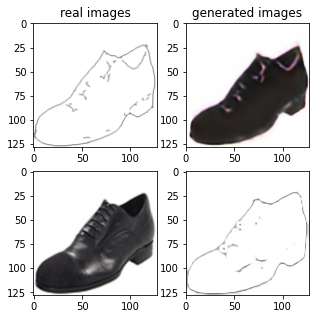

Train Epoch: 1 16% 	Total Loss: 1.498961 	Loss_G_AB: 0.292011	Loss_G_BA: 0.935160	Loss_cycle: 0.594267	Loss_D_A: 0.021607	Loss_D_B: 0.269502
0 8009 T:  1.8019990921020508
Train Epoch: 1 16% 	Total Loss: 1.556257 	Loss_G_AB: 0.283633	Loss_G_BA: 0.884588	Loss_cycle: 0.683233	Loss_D_A: 0.039072	Loss_D_B: 0.249843
0 8019 T:  1.219482183456421
Train Epoch: 1 16% 	Total Loss: 1.607284 	Loss_G_AB: 0.292842	Loss_G_BA: 0.696573	Loss_cycle: 0.682364	Loss_D_A: 0.180029	Loss_D_B: 0.250184
0 8029 T:  1.159743070602417
Train Epoch: 1 16% 	Total Loss: 1.453550 	Loss_G_AB: 0.283731	Loss_G_BA: 0.564585	Loss_cycle: 0.563449	Loss_D_A: 0.204139	Loss_D_B: 0.261805
0 8039 T:  1.1541743278503418
Train Epoch: 1 16% 	Total Loss: 1.420856 	Loss_G_AB: 0.267200	Loss_G_BA: 0.678712	Loss_cycle: 0.549172	Loss_D_A: 0.144734	Loss_D_B: 0.253994
0 8049 T:  1.1590638160705566
Train Epoch: 1 16% 	Total Loss: 1.459886 	Loss_G_AB: 0.290806	Loss_G_BA: 0.940147	Loss_cycle: 0.570691	Loss_D_A: 0.021100	Loss_D_B: 0.252618
0 8059

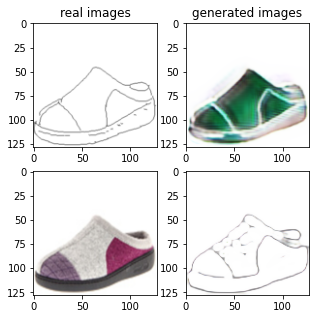

Train Epoch: 1 18% 	Total Loss: 1.513055 	Loss_G_AB: 0.315450	Loss_G_BA: 0.966586	Loss_cycle: 0.632267	Loss_D_A: 0.016905	Loss_D_B: 0.222864
0 9009 T:  1.8730592727661133
Train Epoch: 1 18% 	Total Loss: 1.732318 	Loss_G_AB: 0.327704	Loss_G_BA: 1.059708	Loss_cycle: 0.717663	Loss_D_A: 0.014395	Loss_D_B: 0.306554
0 9019 T:  1.1563374996185303
Train Epoch: 1 18% 	Total Loss: 1.527070 	Loss_G_AB: 0.285238	Loss_G_BA: 0.919942	Loss_cycle: 0.634114	Loss_D_A: 0.023358	Loss_D_B: 0.267007
0 9029 T:  1.1564280986785889
Train Epoch: 1 18% 	Total Loss: 1.594107 	Loss_G_AB: 0.299607	Loss_G_BA: 1.010932	Loss_cycle: 0.689706	Loss_D_A: 0.010819	Loss_D_B: 0.238312
0 9039 T:  1.1621758937835693
Train Epoch: 1 18% 	Total Loss: 1.587343 	Loss_G_AB: 0.318727	Loss_G_BA: 0.982546	Loss_cycle: 0.676844	Loss_D_A: 0.016028	Loss_D_B: 0.243835
0 9049 T:  1.157658576965332
Train Epoch: 1 18% 	Total Loss: 1.555178 	Loss_G_AB: 0.242847	Loss_G_BA: 0.951932	Loss_cycle: 0.663829	Loss_D_A: 0.013548	Loss_D_B: 0.280412
0 905

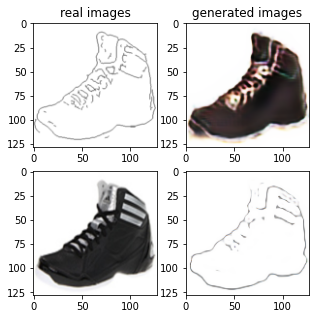

Train Epoch: 1 20% 	Total Loss: 1.556589 	Loss_G_AB: 0.301528	Loss_G_BA: 1.032488	Loss_cycle: 0.627681	Loss_D_A: 0.015506	Loss_D_B: 0.246394
0 10009 T:  1.8841302394866943
Train Epoch: 1 20% 	Total Loss: 1.514532 	Loss_G_AB: 0.279406	Loss_G_BA: 0.948648	Loss_cycle: 0.592103	Loss_D_A: 0.030330	Loss_D_B: 0.278072
0 10019 T:  1.162989616394043
Train Epoch: 1 20% 	Total Loss: 1.467284 	Loss_G_AB: 0.284668	Loss_G_BA: 0.946064	Loss_cycle: 0.564963	Loss_D_A: 0.015640	Loss_D_B: 0.271315
0 10029 T:  1.1555712223052979
Train Epoch: 1 20% 	Total Loss: 1.509403 	Loss_G_AB: 0.293788	Loss_G_BA: 0.985826	Loss_cycle: 0.588814	Loss_D_A: 0.023165	Loss_D_B: 0.257616
0 10039 T:  1.1571810245513916
Train Epoch: 1 20% 	Total Loss: 1.426072 	Loss_G_AB: 0.292160	Loss_G_BA: 0.882256	Loss_cycle: 0.511973	Loss_D_A: 0.071539	Loss_D_B: 0.255352
0 10049 T:  1.1558566093444824
Train Epoch: 1 20% 	Total Loss: 1.525980 	Loss_G_AB: 0.302657	Loss_G_BA: 0.875385	Loss_cycle: 0.643748	Loss_D_A: 0.036922	Loss_D_B: 0.256289


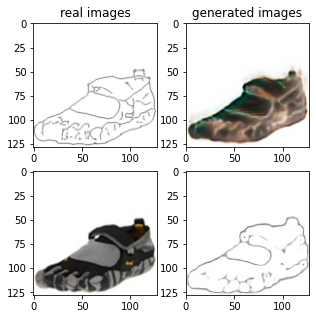

Train Epoch: 1 22% 	Total Loss: 1.425970 	Loss_G_AB: 0.284089	Loss_G_BA: 0.983554	Loss_cycle: 0.499594	Loss_D_A: 0.009963	Loss_D_B: 0.282592
0 11009 T:  1.820406436920166
Train Epoch: 1 22% 	Total Loss: 1.536647 	Loss_G_AB: 0.314568	Loss_G_BA: 0.977216	Loss_cycle: 0.609103	Loss_D_A: 0.025004	Loss_D_B: 0.256648
0 11019 T:  1.1538751125335693
Train Epoch: 1 22% 	Total Loss: 1.559495 	Loss_G_AB: 0.311477	Loss_G_BA: 0.966104	Loss_cycle: 0.664170	Loss_D_A: 0.004850	Loss_D_B: 0.251685
0 11029 T:  1.1562600135803223
Train Epoch: 1 22% 	Total Loss: 1.330491 	Loss_G_AB: 0.309433	Loss_G_BA: 0.967913	Loss_cycle: 0.442421	Loss_D_A: 0.011291	Loss_D_B: 0.238106
0 11039 T:  1.156836748123169
Train Epoch: 1 22% 	Total Loss: 1.563646 	Loss_G_AB: 0.276653	Loss_G_BA: 0.990080	Loss_cycle: 0.660338	Loss_D_A: 0.009682	Loss_D_B: 0.260260
0 11049 T:  1.158104419708252
Train Epoch: 1 22% 	Total Loss: 1.590311 	Loss_G_AB: 0.354066	Loss_G_BA: 0.987353	Loss_cycle: 0.695527	Loss_D_A: 0.006283	Loss_D_B: 0.217792
0 

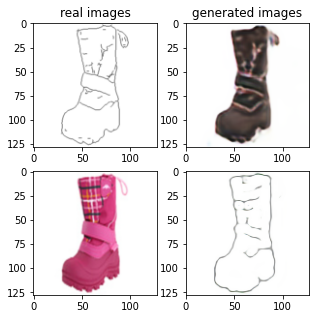

Train Epoch: 1 24% 	Total Loss: 1.498778 	Loss_G_AB: 0.287699	Loss_G_BA: 0.967333	Loss_cycle: 0.591765	Loss_D_A: 0.013219	Loss_D_B: 0.266279
0 12009 T:  1.8032948970794678
Train Epoch: 1 24% 	Total Loss: 1.384560 	Loss_G_AB: 0.304633	Loss_G_BA: 0.894567	Loss_cycle: 0.496822	Loss_D_A: 0.024750	Loss_D_B: 0.263388
0 12019 T:  1.1506998538970947
Train Epoch: 1 24% 	Total Loss: 1.294655 	Loss_G_AB: 0.272242	Loss_G_BA: 0.724250	Loss_cycle: 0.390226	Loss_D_A: 0.128433	Loss_D_B: 0.277749
0 12029 T:  1.149703025817871
Train Epoch: 1 24% 	Total Loss: 1.529952 	Loss_G_AB: 0.346062	Loss_G_BA: 0.954055	Loss_cycle: 0.636224	Loss_D_A: 0.024493	Loss_D_B: 0.219176
0 12039 T:  1.1636784076690674
Train Epoch: 1 24% 	Total Loss: 1.363111 	Loss_G_AB: 0.301472	Loss_G_BA: 0.841803	Loss_cycle: 0.466525	Loss_D_A: 0.065307	Loss_D_B: 0.259642
0 12049 T:  1.1541104316711426
Train Epoch: 1 24% 	Total Loss: 1.600310 	Loss_G_AB: 0.265818	Loss_G_BA: 0.964810	Loss_cycle: 0.680076	Loss_D_A: 0.037080	Loss_D_B: 0.267840


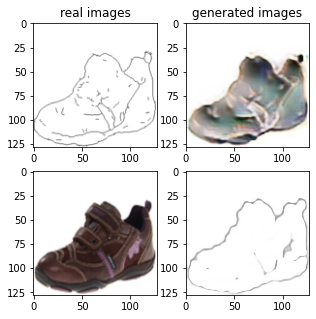

Train Epoch: 1 26% 	Total Loss: 1.701765 	Loss_G_AB: 0.289566	Loss_G_BA: 0.968705	Loss_cycle: 0.788505	Loss_D_A: 0.013858	Loss_D_B: 0.270267
0 13009 T:  1.8786399364471436
Train Epoch: 1 26% 	Total Loss: 1.634881 	Loss_G_AB: 0.279314	Loss_G_BA: 0.993377	Loss_cycle: 0.718443	Loss_D_A: 0.009576	Loss_D_B: 0.270517
0 13019 T:  1.1571316719055176
Train Epoch: 1 26% 	Total Loss: 1.643777 	Loss_G_AB: 0.336601	Loss_G_BA: 0.917602	Loss_cycle: 0.740633	Loss_D_A: 0.027828	Loss_D_B: 0.248214
0 13029 T:  1.1552739143371582
Train Epoch: 1 26% 	Total Loss: 1.528259 	Loss_G_AB: 0.305487	Loss_G_BA: 0.782164	Loss_cycle: 0.617371	Loss_D_A: 0.084342	Loss_D_B: 0.282721
0 13039 T:  1.1508207321166992
Train Epoch: 1 26% 	Total Loss: 1.566471 	Loss_G_AB: 0.346469	Loss_G_BA: 0.933772	Loss_cycle: 0.571156	Loss_D_A: 0.061202	Loss_D_B: 0.293993
0 13049 T:  1.158574104309082
Train Epoch: 1 26% 	Total Loss: 1.612366 	Loss_G_AB: 0.267203	Loss_G_BA: 0.993898	Loss_cycle: 0.707220	Loss_D_A: 0.012765	Loss_D_B: 0.261831


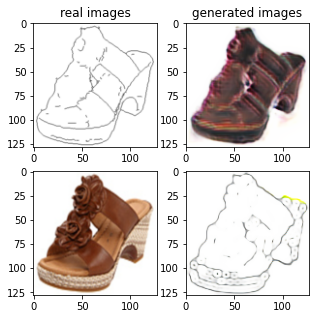

Train Epoch: 1 28% 	Total Loss: 1.466040 	Loss_G_AB: 0.332176	Loss_G_BA: 1.007991	Loss_cycle: 0.504187	Loss_D_A: 0.010747	Loss_D_B: 0.281023
0 14009 T:  1.8466362953186035
Train Epoch: 1 28% 	Total Loss: 1.392192 	Loss_G_AB: 0.270672	Loss_G_BA: 1.028107	Loss_cycle: 0.477500	Loss_D_A: 0.006727	Loss_D_B: 0.258576
0 14019 T:  1.1559982299804688
Train Epoch: 1 28% 	Total Loss: 1.578652 	Loss_G_AB: 0.296701	Loss_G_BA: 1.004856	Loss_cycle: 0.658329	Loss_D_A: 0.008394	Loss_D_B: 0.261151
0 14029 T:  1.1548140048980713
Train Epoch: 1 28% 	Total Loss: 1.467060 	Loss_G_AB: 0.287274	Loss_G_BA: 0.970457	Loss_cycle: 0.567450	Loss_D_A: 0.012774	Loss_D_B: 0.257970
0 14039 T:  1.1547696590423584
Train Epoch: 1 28% 	Total Loss: 1.497753 	Loss_G_AB: 0.296699	Loss_G_BA: 0.881662	Loss_cycle: 0.607953	Loss_D_A: 0.035551	Loss_D_B: 0.265069
0 14049 T:  1.1539294719696045
Train Epoch: 1 28% 	Total Loss: 1.474262 	Loss_G_AB: 0.308260	Loss_G_BA: 0.899036	Loss_cycle: 0.562792	Loss_D_A: 0.037265	Loss_D_B: 0.270557

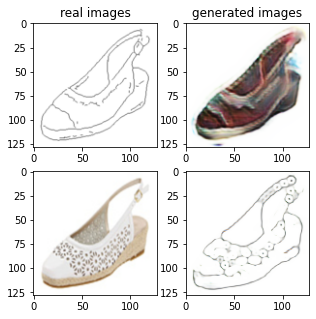

Train Epoch: 1 30% 	Total Loss: 1.385004 	Loss_G_AB: 0.315456	Loss_G_BA: 0.932344	Loss_cycle: 0.518827	Loss_D_A: 0.008207	Loss_D_B: 0.234070
0 15009 T:  1.8277199268341064
Train Epoch: 1 30% 	Total Loss: 1.354815 	Loss_G_AB: 0.327522	Loss_G_BA: 0.983175	Loss_cycle: 0.445726	Loss_D_A: 0.016212	Loss_D_B: 0.237529
0 15019 T:  1.284588098526001
Train Epoch: 1 30% 	Total Loss: 1.465604 	Loss_G_AB: 0.317170	Loss_G_BA: 0.989344	Loss_cycle: 0.459088	Loss_D_A: 0.008974	Loss_D_B: 0.344286
0 15029 T:  1.155893087387085
Train Epoch: 1 30% 	Total Loss: 1.481751 	Loss_G_AB: 0.303407	Loss_G_BA: 0.989089	Loss_cycle: 0.562362	Loss_D_A: 0.005293	Loss_D_B: 0.267847
0 15039 T:  1.1574177742004395
Train Epoch: 1 30% 	Total Loss: 1.409542 	Loss_G_AB: 0.292890	Loss_G_BA: 0.982257	Loss_cycle: 0.508237	Loss_D_A: 0.012065	Loss_D_B: 0.251667
0 15049 T:  1.1519994735717773
Train Epoch: 1 30% 	Total Loss: 1.385928 	Loss_G_AB: 0.272074	Loss_G_BA: 1.002136	Loss_cycle: 0.485614	Loss_D_A: 0.005887	Loss_D_B: 0.257321
0

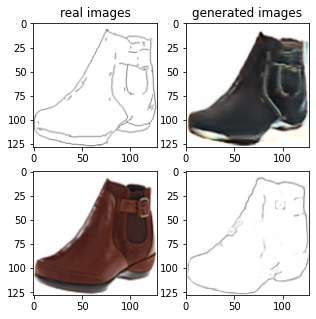

Train Epoch: 1 32% 	Total Loss: 1.493221 	Loss_G_AB: 0.385314	Loss_G_BA: 0.999307	Loss_cycle: 0.485393	Loss_D_A: 0.009903	Loss_D_B: 0.305614
0 16009 T:  1.8824725151062012
Train Epoch: 1 32% 	Total Loss: 1.498448 	Loss_G_AB: 0.314989	Loss_G_BA: 0.995573	Loss_cycle: 0.574924	Loss_D_A: 0.006749	Loss_D_B: 0.261493
0 16019 T:  1.1538612842559814
Train Epoch: 1 32% 	Total Loss: 1.392845 	Loss_G_AB: 0.302075	Loss_G_BA: 1.002136	Loss_cycle: 0.469095	Loss_D_A: 0.007914	Loss_D_B: 0.263731
0 16029 T:  1.1522560119628906
Train Epoch: 1 32% 	Total Loss: 1.356006 	Loss_G_AB: 0.292552	Loss_G_BA: 0.969035	Loss_cycle: 0.471028	Loss_D_A: 0.016299	Loss_D_B: 0.237886
0 16039 T:  1.1559638977050781
Train Epoch: 1 32% 	Total Loss: 1.583903 	Loss_G_AB: 0.307737	Loss_G_BA: 0.983479	Loss_cycle: 0.642124	Loss_D_A: 0.011912	Loss_D_B: 0.284258
0 16049 T:  1.158473014831543
Train Epoch: 1 32% 	Total Loss: 1.450465 	Loss_G_AB: 0.302216	Loss_G_BA: 0.924221	Loss_cycle: 0.520730	Loss_D_A: 0.046032	Loss_D_B: 0.270485


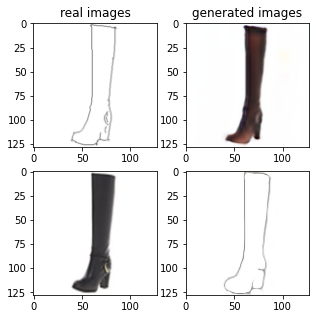

Train Epoch: 1 34% 	Total Loss: 1.518699 	Loss_G_AB: 0.264033	Loss_G_BA: 0.963843	Loss_cycle: 0.630772	Loss_D_A: 0.016652	Loss_D_B: 0.257336
0 17009 T:  1.8174071311950684
Train Epoch: 1 34% 	Total Loss: 1.578241 	Loss_G_AB: 0.274548	Loss_G_BA: 0.974601	Loss_cycle: 0.653957	Loss_D_A: 0.043859	Loss_D_B: 0.255850
0 17019 T:  1.1530258655548096
Train Epoch: 1 34% 	Total Loss: 1.386691 	Loss_G_AB: 0.292691	Loss_G_BA: 0.921908	Loss_cycle: 0.485496	Loss_D_A: 0.041560	Loss_D_B: 0.252336
0 17029 T:  1.153048038482666
Train Epoch: 1 34% 	Total Loss: 1.429790 	Loss_G_AB: 0.288821	Loss_G_BA: 1.002623	Loss_cycle: 0.511835	Loss_D_A: 0.012440	Loss_D_B: 0.259793
0 17039 T:  1.1547200679779053
Train Epoch: 1 34% 	Total Loss: 1.541504 	Loss_G_AB: 0.286225	Loss_G_BA: 0.995137	Loss_cycle: 0.631717	Loss_D_A: 0.007500	Loss_D_B: 0.261607
0 17049 T:  1.156816005706787
Train Epoch: 1 34% 	Total Loss: 1.350442 	Loss_G_AB: 0.300013	Loss_G_BA: 0.971399	Loss_cycle: 0.454523	Loss_D_A: 0.008796	Loss_D_B: 0.251417
0

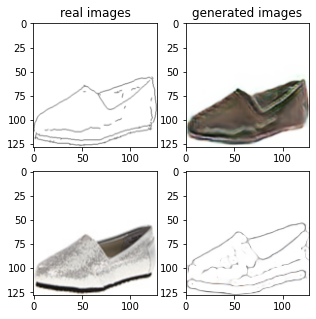

Train Epoch: 1 36% 	Total Loss: 1.524107 	Loss_G_AB: 0.312094	Loss_G_BA: 0.870347	Loss_cycle: 0.666998	Loss_D_A: 0.022649	Loss_D_B: 0.243240
0 18009 T:  1.8206446170806885
Train Epoch: 1 36% 	Total Loss: 1.665723 	Loss_G_AB: 0.273727	Loss_G_BA: 1.038654	Loss_cycle: 0.742337	Loss_D_A: 0.023742	Loss_D_B: 0.243454
0 18019 T:  1.1549887657165527
Train Epoch: 1 36% 	Total Loss: 1.451776 	Loss_G_AB: 0.284140	Loss_G_BA: 0.991257	Loss_cycle: 0.564288	Loss_D_A: 0.011294	Loss_D_B: 0.238496
0 18029 T:  1.1516282558441162
Train Epoch: 1 36% 	Total Loss: 1.453995 	Loss_G_AB: 0.284585	Loss_G_BA: 0.961608	Loss_cycle: 0.547451	Loss_D_A: 0.025902	Loss_D_B: 0.257545
0 18039 T:  1.153994083404541
Train Epoch: 1 36% 	Total Loss: 1.537117 	Loss_G_AB: 0.293713	Loss_G_BA: 0.998267	Loss_cycle: 0.631800	Loss_D_A: 0.013387	Loss_D_B: 0.245940
0 18049 T:  1.154423713684082
Train Epoch: 1 36% 	Total Loss: 1.462352 	Loss_G_AB: 0.288082	Loss_G_BA: 0.940914	Loss_cycle: 0.579439	Loss_D_A: 0.027907	Loss_D_B: 0.240507
0

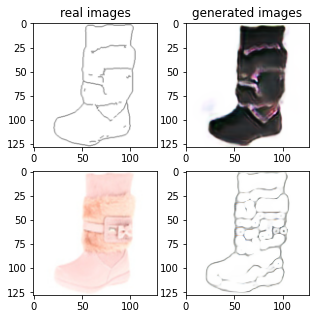

Train Epoch: 1 38% 	Total Loss: 1.362265 	Loss_G_AB: 0.282286	Loss_G_BA: 0.959643	Loss_cycle: 0.471450	Loss_D_A: 0.016472	Loss_D_B: 0.253378
0 19009 T:  1.8974480628967285
Train Epoch: 1 38% 	Total Loss: 1.588397 	Loss_G_AB: 0.267043	Loss_G_BA: 1.030345	Loss_cycle: 0.638370	Loss_D_A: 0.019333	Loss_D_B: 0.282001
0 19019 T:  1.1534440517425537
Train Epoch: 1 38% 	Total Loss: 1.430099 	Loss_G_AB: 0.269438	Loss_G_BA: 0.976499	Loss_cycle: 0.533756	Loss_D_A: 0.021375	Loss_D_B: 0.251999
0 19029 T:  1.1561901569366455
Train Epoch: 1 38% 	Total Loss: 1.304992 	Loss_G_AB: 0.283627	Loss_G_BA: 0.750857	Loss_cycle: 0.411143	Loss_D_A: 0.124332	Loss_D_B: 0.252276
0 19039 T:  1.1593973636627197
Train Epoch: 1 38% 	Total Loss: 1.333359 	Loss_G_AB: 0.275577	Loss_G_BA: 0.843607	Loss_cycle: 0.455645	Loss_D_A: 0.070727	Loss_D_B: 0.247395
0 19049 T:  1.1603384017944336
Train Epoch: 1 38% 	Total Loss: 1.450196 	Loss_G_AB: 0.278350	Loss_G_BA: 0.673604	Loss_cycle: 0.443452	Loss_D_A: 0.275770	Loss_D_B: 0.254997

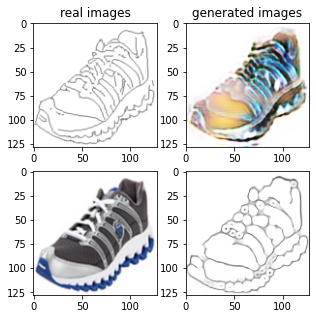

Train Epoch: 1 40% 	Total Loss: 1.408241 	Loss_G_AB: 0.279499	Loss_G_BA: 0.916668	Loss_cycle: 0.491384	Loss_D_A: 0.055492	Loss_D_B: 0.263282
0 20009 T:  1.9849863052368164
Train Epoch: 1 40% 	Total Loss: 1.550932 	Loss_G_AB: 0.277326	Loss_G_BA: 0.977355	Loss_cycle: 0.629077	Loss_D_A: 0.020590	Loss_D_B: 0.273923
0 20019 T:  1.1523809432983398
Train Epoch: 1 40% 	Total Loss: 1.312687 	Loss_G_AB: 0.277050	Loss_G_BA: 0.913826	Loss_cycle: 0.445214	Loss_D_A: 0.022459	Loss_D_B: 0.249576
0 20029 T:  1.1479156017303467
Train Epoch: 1 40% 	Total Loss: 1.465674 	Loss_G_AB: 0.327993	Loss_G_BA: 0.773626	Loss_cycle: 0.519950	Loss_D_A: 0.146245	Loss_D_B: 0.248670
0 20039 T:  1.1512725353240967
Train Epoch: 1 40% 	Total Loss: 1.316292 	Loss_G_AB: 0.274364	Loss_G_BA: 0.696089	Loss_cycle: 0.446796	Loss_D_A: 0.113929	Loss_D_B: 0.270341
0 20049 T:  1.1518962383270264
Train Epoch: 1 40% 	Total Loss: 1.470489 	Loss_G_AB: 0.284500	Loss_G_BA: 0.785868	Loss_cycle: 0.540612	Loss_D_A: 0.140341	Loss_D_B: 0.254353

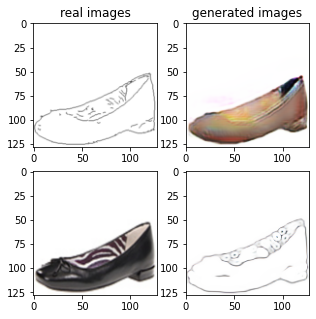

Train Epoch: 1 42% 	Total Loss: 1.482677 	Loss_G_AB: 0.283354	Loss_G_BA: 1.003372	Loss_cycle: 0.566752	Loss_D_A: 0.016858	Loss_D_B: 0.255704
0 21009 T:  1.860412836074829
Train Epoch: 1 42% 	Total Loss: 1.486391 	Loss_G_AB: 0.270873	Loss_G_BA: 0.987308	Loss_cycle: 0.602180	Loss_D_A: 0.006718	Loss_D_B: 0.248403
0 21019 T:  1.1545782089233398
Train Epoch: 1 42% 	Total Loss: 1.374049 	Loss_G_AB: 0.295728	Loss_G_BA: 0.950192	Loss_cycle: 0.487142	Loss_D_A: 0.013373	Loss_D_B: 0.250573
0 21029 T:  1.157973289489746
Train Epoch: 1 42% 	Total Loss: 1.437411 	Loss_G_AB: 0.298234	Loss_G_BA: 1.022486	Loss_cycle: 0.517423	Loss_D_A: 0.009670	Loss_D_B: 0.249958
0 21039 T:  1.1495261192321777
Train Epoch: 1 42% 	Total Loss: 1.392326 	Loss_G_AB: 0.304976	Loss_G_BA: 1.011961	Loss_cycle: 0.456984	Loss_D_A: 0.004414	Loss_D_B: 0.272459
0 21049 T:  1.1536946296691895
Train Epoch: 1 42% 	Total Loss: 1.427482 	Loss_G_AB: 0.307600	Loss_G_BA: 1.016925	Loss_cycle: 0.499671	Loss_D_A: 0.006581	Loss_D_B: 0.258968
0

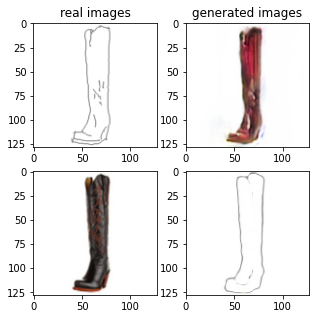

Train Epoch: 1 44% 	Total Loss: 1.365317 	Loss_G_AB: 0.301039	Loss_G_BA: 0.994059	Loss_cycle: 0.467397	Loss_D_A: 0.004374	Loss_D_B: 0.245997
0 22009 T:  1.8002073764801025
Train Epoch: 1 44% 	Total Loss: 1.567992 	Loss_G_AB: 0.295023	Loss_G_BA: 1.006224	Loss_cycle: 0.658999	Loss_D_A: 0.004761	Loss_D_B: 0.253609
0 22019 T:  1.1511614322662354
Train Epoch: 1 44% 	Total Loss: 1.511976 	Loss_G_AB: 0.302449	Loss_G_BA: 0.952697	Loss_cycle: 0.635159	Loss_D_A: 0.007883	Loss_D_B: 0.241361
0 22029 T:  1.1609253883361816
Train Epoch: 1 44% 	Total Loss: 1.410294 	Loss_G_AB: 0.298744	Loss_G_BA: 1.042808	Loss_cycle: 0.465452	Loss_D_A: 0.007660	Loss_D_B: 0.266406
0 22039 T:  1.1508324146270752
Train Epoch: 1 44% 	Total Loss: 1.428914 	Loss_G_AB: 0.269450	Loss_G_BA: 1.015936	Loss_cycle: 0.526922	Loss_D_A: 0.003528	Loss_D_B: 0.255771
0 22049 T:  1.1502208709716797
Train Epoch: 1 44% 	Total Loss: 1.337388 	Loss_G_AB: 0.290968	Loss_G_BA: 0.967999	Loss_cycle: 0.445580	Loss_D_A: 0.003701	Loss_D_B: 0.258623

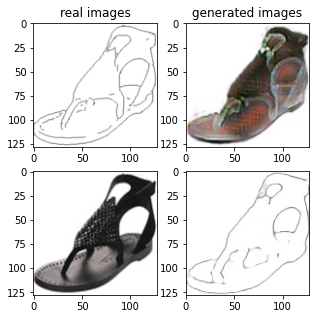

Train Epoch: 1 46% 	Total Loss: 1.447147 	Loss_G_AB: 0.285672	Loss_G_BA: 0.950140	Loss_cycle: 0.568028	Loss_D_A: 0.014342	Loss_D_B: 0.246871
0 23009 T:  1.81278395652771
Train Epoch: 1 46% 	Total Loss: 1.452094 	Loss_G_AB: 0.298464	Loss_G_BA: 0.912050	Loss_cycle: 0.577127	Loss_D_A: 0.025209	Loss_D_B: 0.244501
0 23019 T:  1.1549220085144043
Train Epoch: 1 46% 	Total Loss: 1.508058 	Loss_G_AB: 0.269645	Loss_G_BA: 0.998479	Loss_cycle: 0.580856	Loss_D_A: 0.022652	Loss_D_B: 0.270488
0 23029 T:  1.1540687084197998
Train Epoch: 1 46% 	Total Loss: 1.352533 	Loss_G_AB: 0.258027	Loss_G_BA: 0.952719	Loss_cycle: 0.460575	Loss_D_A: 0.019137	Loss_D_B: 0.267447
0 23039 T:  1.1532361507415771
Train Epoch: 1 46% 	Total Loss: 1.371498 	Loss_G_AB: 0.290251	Loss_G_BA: 0.850587	Loss_cycle: 0.505112	Loss_D_A: 0.050712	Loss_D_B: 0.245255
0 23049 T:  1.1532747745513916
Train Epoch: 1 46% 	Total Loss: 1.447408 	Loss_G_AB: 0.305666	Loss_G_BA: 0.955086	Loss_cycle: 0.542099	Loss_D_A: 0.018509	Loss_D_B: 0.256423
0

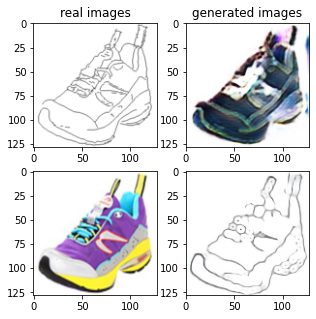

Train Epoch: 1 48% 	Total Loss: 1.455969 	Loss_G_AB: 0.362051	Loss_G_BA: 0.989702	Loss_cycle: 0.559827	Loss_D_A: 0.009322	Loss_D_B: 0.210944
0 24009 T:  1.8868293762207031
Train Epoch: 1 48% 	Total Loss: 1.300924 	Loss_G_AB: 0.360988	Loss_G_BA: 0.776778	Loss_cycle: 0.410354	Loss_D_A: 0.071587	Loss_D_B: 0.250100
0 24019 T:  1.1497819423675537
Train Epoch: 1 48% 	Total Loss: 1.454164 	Loss_G_AB: 0.303184	Loss_G_BA: 0.964998	Loss_cycle: 0.520410	Loss_D_A: 0.008058	Loss_D_B: 0.291604
0 24029 T:  1.1483421325683594
Train Epoch: 1 48% 	Total Loss: 1.413687 	Loss_G_AB: 0.302460	Loss_G_BA: 0.968034	Loss_cycle: 0.479196	Loss_D_A: 0.030273	Loss_D_B: 0.268971
0 24039 T:  1.1536955833435059
Train Epoch: 1 48% 	Total Loss: 1.502829 	Loss_G_AB: 0.334641	Loss_G_BA: 0.976686	Loss_cycle: 0.554425	Loss_D_A: 0.013793	Loss_D_B: 0.278947
0 24049 T:  1.160287618637085
Train Epoch: 1 48% 	Total Loss: 1.452951 	Loss_G_AB: 0.308265	Loss_G_BA: 1.006010	Loss_cycle: 0.566227	Loss_D_A: 0.008800	Loss_D_B: 0.220786


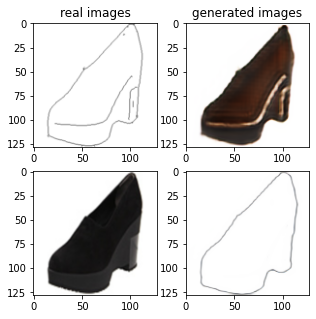

Train Epoch: 1 50% 	Total Loss: 1.384186 	Loss_G_AB: 0.286672	Loss_G_BA: 1.015890	Loss_cycle: 0.477839	Loss_D_A: 0.019713	Loss_D_B: 0.235353
0 25009 T:  1.9123401641845703
Train Epoch: 1 50% 	Total Loss: 1.322568 	Loss_G_AB: 0.298819	Loss_G_BA: 0.977610	Loss_cycle: 0.419027	Loss_D_A: 0.023472	Loss_D_B: 0.241855
0 25019 T:  1.1546425819396973
Train Epoch: 1 50% 	Total Loss: 1.494931 	Loss_G_AB: 0.281080	Loss_G_BA: 0.952189	Loss_cycle: 0.596581	Loss_D_A: 0.019515	Loss_D_B: 0.262200
0 25029 T:  1.1576240062713623
Train Epoch: 1 50% 	Total Loss: 1.413171 	Loss_G_AB: 0.298005	Loss_G_BA: 1.040594	Loss_cycle: 0.493091	Loss_D_A: 0.005426	Loss_D_B: 0.245354
0 25039 T:  1.1530797481536865
Train Epoch: 1 50% 	Total Loss: 1.490118 	Loss_G_AB: 0.259300	Loss_G_BA: 0.970786	Loss_cycle: 0.616661	Loss_D_A: 0.007935	Loss_D_B: 0.250479
0 25049 T:  1.1541759967803955
Train Epoch: 1 50% 	Total Loss: 1.487724 	Loss_G_AB: 0.333820	Loss_G_BA: 0.938445	Loss_cycle: 0.584657	Loss_D_A: 0.010405	Loss_D_B: 0.256530

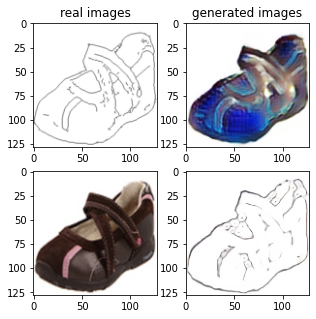

Train Epoch: 1 52% 	Total Loss: 1.428351 	Loss_G_AB: 0.299140	Loss_G_BA: 0.994800	Loss_cycle: 0.536191	Loss_D_A: 0.004450	Loss_D_B: 0.240740
0 26009 T:  1.9608638286590576
Train Epoch: 1 52% 	Total Loss: 1.422706 	Loss_G_AB: 0.291103	Loss_G_BA: 0.987524	Loss_cycle: 0.538158	Loss_D_A: 0.004774	Loss_D_B: 0.240460
0 26019 T:  1.1507084369659424
Train Epoch: 1 52% 	Total Loss: 1.439661 	Loss_G_AB: 0.296099	Loss_G_BA: 0.963804	Loss_cycle: 0.550525	Loss_D_A: 0.008156	Loss_D_B: 0.251028
0 26029 T:  1.156627893447876
Train Epoch: 1 52% 	Total Loss: 1.294833 	Loss_G_AB: 0.269117	Loss_G_BA: 1.050929	Loss_cycle: 0.383284	Loss_D_A: 0.007211	Loss_D_B: 0.244315
0 26039 T:  1.1540396213531494
Train Epoch: 1 52% 	Total Loss: 1.360015 	Loss_G_AB: 0.359787	Loss_G_BA: 0.986211	Loss_cycle: 0.430449	Loss_D_A: 0.003377	Loss_D_B: 0.253190
0 26049 T:  1.1497046947479248
Train Epoch: 1 52% 	Total Loss: 1.453380 	Loss_G_AB: 0.323104	Loss_G_BA: 0.989749	Loss_cycle: 0.552321	Loss_D_A: 0.018562	Loss_D_B: 0.226071


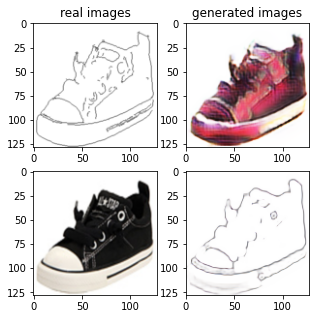

Train Epoch: 1 54% 	Total Loss: 1.405584 	Loss_G_AB: 0.330257	Loss_G_BA: 1.014000	Loss_cycle: 0.472538	Loss_D_A: 0.002617	Loss_D_B: 0.258301
0 27009 T:  1.8276665210723877
Train Epoch: 1 54% 	Total Loss: 1.369889 	Loss_G_AB: 0.285527	Loss_G_BA: 0.977776	Loss_cycle: 0.461818	Loss_D_A: 0.003753	Loss_D_B: 0.272667
0 27019 T:  1.1563966274261475
Train Epoch: 1 54% 	Total Loss: 1.332546 	Loss_G_AB: 0.275927	Loss_G_BA: 0.979387	Loss_cycle: 0.447455	Loss_D_A: 0.004659	Loss_D_B: 0.252775
0 27029 T:  1.151343822479248
Train Epoch: 1 54% 	Total Loss: 1.200534 	Loss_G_AB: 0.282390	Loss_G_BA: 0.987526	Loss_cycle: 0.319379	Loss_D_A: 0.005357	Loss_D_B: 0.240840
0 27039 T:  1.1839535236358643
Train Epoch: 1 54% 	Total Loss: 1.505091 	Loss_G_AB: 0.265014	Loss_G_BA: 1.017027	Loss_cycle: 0.580835	Loss_D_A: 0.003164	Loss_D_B: 0.280072
0 27049 T:  1.1565306186676025
Train Epoch: 1 54% 	Total Loss: 1.287898 	Loss_G_AB: 0.272538	Loss_G_BA: 0.979246	Loss_cycle: 0.417878	Loss_D_A: 0.003611	Loss_D_B: 0.240517


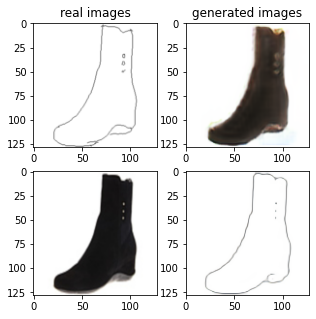

Train Epoch: 1 56% 	Total Loss: 1.492393 	Loss_G_AB: 0.272575	Loss_G_BA: 0.962215	Loss_cycle: 0.583734	Loss_D_A: 0.008465	Loss_D_B: 0.282799
0 28009 T:  1.836296558380127
Train Epoch: 1 56% 	Total Loss: 1.388053 	Loss_G_AB: 0.280734	Loss_G_BA: 1.010488	Loss_cycle: 0.476678	Loss_D_A: 0.004434	Loss_D_B: 0.261330
0 28019 T:  1.1533849239349365
Train Epoch: 1 56% 	Total Loss: 1.416134 	Loss_G_AB: 0.280552	Loss_G_BA: 0.994329	Loss_cycle: 0.526069	Loss_D_A: 0.003422	Loss_D_B: 0.249202
0 28029 T:  1.1521227359771729
Train Epoch: 1 56% 	Total Loss: 1.286782 	Loss_G_AB: 0.261813	Loss_G_BA: 0.980418	Loss_cycle: 0.361819	Loss_D_A: 0.015496	Loss_D_B: 0.288352
0 28039 T:  1.148733139038086
Train Epoch: 1 56% 	Total Loss: 1.352897 	Loss_G_AB: 0.266207	Loss_G_BA: 0.969148	Loss_cycle: 0.459462	Loss_D_A: 0.015524	Loss_D_B: 0.260234
0 28049 T:  1.150303602218628
Train Epoch: 1 56% 	Total Loss: 1.411912 	Loss_G_AB: 0.320401	Loss_G_BA: 1.000289	Loss_cycle: 0.511516	Loss_D_A: 0.003673	Loss_D_B: 0.236378
0 

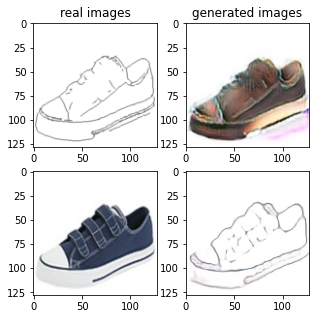

Train Epoch: 1 58% 	Total Loss: 1.383139 	Loss_G_AB: 0.310425	Loss_G_BA: 1.002253	Loss_cycle: 0.477747	Loss_D_A: 0.003310	Loss_D_B: 0.245743
0 29009 T:  1.8981196880340576
Train Epoch: 1 58% 	Total Loss: 1.406158 	Loss_G_AB: 0.271126	Loss_G_BA: 1.001574	Loss_cycle: 0.503590	Loss_D_A: 0.003105	Loss_D_B: 0.263114
0 29019 T:  1.1453149318695068
Train Epoch: 1 58% 	Total Loss: 1.380822 	Loss_G_AB: 0.271866	Loss_G_BA: 0.972241	Loss_cycle: 0.519412	Loss_D_A: 0.003040	Loss_D_B: 0.236316
0 29029 T:  1.1486234664916992
Train Epoch: 1 58% 	Total Loss: 1.447929 	Loss_G_AB: 0.272100	Loss_G_BA: 0.985632	Loss_cycle: 0.548446	Loss_D_A: 0.009811	Loss_D_B: 0.260806
0 29039 T:  1.1477758884429932
Train Epoch: 1 58% 	Total Loss: 1.414905 	Loss_G_AB: 0.293843	Loss_G_BA: 0.987658	Loss_cycle: 0.518314	Loss_D_A: 0.004645	Loss_D_B: 0.251195
0 29049 T:  1.153153419494629
Train Epoch: 1 58% 	Total Loss: 1.298594 	Loss_G_AB: 0.283294	Loss_G_BA: 1.020235	Loss_cycle: 0.401840	Loss_D_A: 0.003716	Loss_D_B: 0.241273


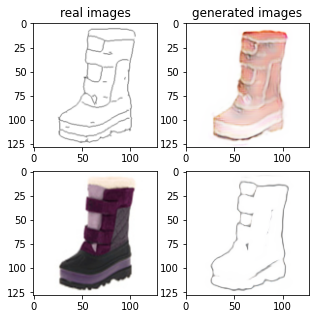

Train Epoch: 1 60% 	Total Loss: 1.308270 	Loss_G_AB: 0.266998	Loss_G_BA: 0.983468	Loss_cycle: 0.412701	Loss_D_A: 0.005273	Loss_D_B: 0.265064
0 30009 T:  1.8312618732452393
Train Epoch: 1 60% 	Total Loss: 1.241107 	Loss_G_AB: 0.282513	Loss_G_BA: 0.991837	Loss_cycle: 0.346765	Loss_D_A: 0.006087	Loss_D_B: 0.251080
0 30019 T:  1.1510241031646729
Train Epoch: 1 60% 	Total Loss: 1.397543 	Loss_G_AB: 0.304163	Loss_G_BA: 1.015478	Loss_cycle: 0.486214	Loss_D_A: 0.005141	Loss_D_B: 0.246367
0 30029 T:  1.1524443626403809
Train Epoch: 1 60% 	Total Loss: 1.372291 	Loss_G_AB: 0.327443	Loss_G_BA: 0.999624	Loss_cycle: 0.499767	Loss_D_A: 0.002296	Loss_D_B: 0.206694
0 30039 T:  1.1529786586761475
Train Epoch: 1 60% 	Total Loss: 1.404327 	Loss_G_AB: 0.360460	Loss_G_BA: 0.990725	Loss_cycle: 0.506632	Loss_D_A: 0.003965	Loss_D_B: 0.218138
0 30049 T:  1.1539926528930664
Train Epoch: 1 60% 	Total Loss: 1.380678 	Loss_G_AB: 0.283404	Loss_G_BA: 0.995049	Loss_cycle: 0.437620	Loss_D_A: 0.005041	Loss_D_B: 0.298790

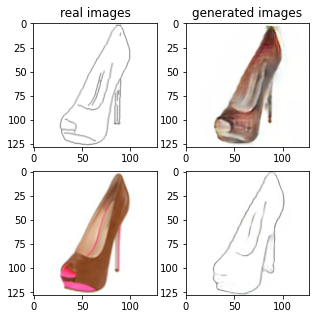

Train Epoch: 1 62% 	Total Loss: 1.372548 	Loss_G_AB: 0.321355	Loss_G_BA: 1.006802	Loss_cycle: 0.447663	Loss_D_A: 0.001647	Loss_D_B: 0.259159
0 31009 T:  1.9070937633514404
Train Epoch: 1 62% 	Total Loss: 1.311634 	Loss_G_AB: 0.286965	Loss_G_BA: 0.992091	Loss_cycle: 0.415742	Loss_D_A: 0.002737	Loss_D_B: 0.253627
0 31019 T:  1.319779872894287
Train Epoch: 1 62% 	Total Loss: 1.402680 	Loss_G_AB: 0.336250	Loss_G_BA: 0.999853	Loss_cycle: 0.512895	Loss_D_A: 0.003166	Loss_D_B: 0.218567
0 31029 T:  1.1516427993774414
Train Epoch: 1 62% 	Total Loss: 1.304714 	Loss_G_AB: 0.273936	Loss_G_BA: 0.999031	Loss_cycle: 0.394351	Loss_D_A: 0.002395	Loss_D_B: 0.271485
0 31039 T:  1.147890567779541
Train Epoch: 1 62% 	Total Loss: 1.473924 	Loss_G_AB: 0.296502	Loss_G_BA: 1.003532	Loss_cycle: 0.586480	Loss_D_A: 0.002523	Loss_D_B: 0.234904
0 31049 T:  1.1526389122009277
Train Epoch: 1 62% 	Total Loss: 1.402558 	Loss_G_AB: 0.302748	Loss_G_BA: 1.000834	Loss_cycle: 0.490666	Loss_D_A: 0.001767	Loss_D_B: 0.258335
0

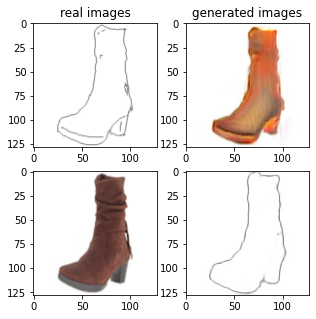

Train Epoch: 1 64% 	Total Loss: 1.409367 	Loss_G_AB: 0.310258	Loss_G_BA: 0.991391	Loss_cycle: 0.499197	Loss_D_A: 0.012570	Loss_D_B: 0.246775
0 32009 T:  1.8501834869384766
Train Epoch: 1 64% 	Total Loss: 1.411695 	Loss_G_AB: 0.372068	Loss_G_BA: 0.998015	Loss_cycle: 0.425041	Loss_D_A: 0.007699	Loss_D_B: 0.293912
0 32019 T:  1.1471736431121826
Train Epoch: 1 64% 	Total Loss: 1.549660 	Loss_G_AB: 0.292808	Loss_G_BA: 0.978660	Loss_cycle: 0.627530	Loss_D_A: 0.004718	Loss_D_B: 0.281678
0 32029 T:  1.1511740684509277
Train Epoch: 1 64% 	Total Loss: 1.425297 	Loss_G_AB: 0.313824	Loss_G_BA: 0.991835	Loss_cycle: 0.534174	Loss_D_A: 0.017740	Loss_D_B: 0.220554
0 32039 T:  1.150796890258789
Train Epoch: 1 64% 	Total Loss: 1.521400 	Loss_G_AB: 0.288579	Loss_G_BA: 0.844704	Loss_cycle: 0.548610	Loss_D_A: 0.145128	Loss_D_B: 0.261019
0 32049 T:  1.151676893234253
Train Epoch: 1 64% 	Total Loss: 1.450896 	Loss_G_AB: 0.343557	Loss_G_BA: 0.729145	Loss_cycle: 0.577963	Loss_D_A: 0.091807	Loss_D_B: 0.244775
0

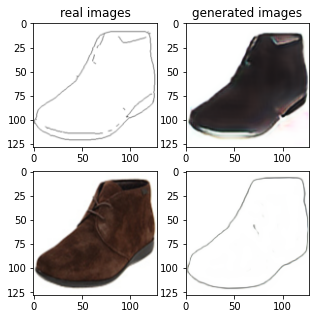

Train Epoch: 1 66% 	Total Loss: 1.281924 	Loss_G_AB: 0.289897	Loss_G_BA: 1.001586	Loss_cycle: 0.367591	Loss_D_A: 0.004504	Loss_D_B: 0.264087
0 33009 T:  1.8154902458190918
Train Epoch: 1 66% 	Total Loss: 1.302960 	Loss_G_AB: 0.312992	Loss_G_BA: 0.976265	Loss_cycle: 0.386298	Loss_D_A: 0.003710	Loss_D_B: 0.268324
0 33019 T:  1.1456427574157715
Train Epoch: 1 66% 	Total Loss: 1.270461 	Loss_G_AB: 0.295061	Loss_G_BA: 0.998939	Loss_cycle: 0.377363	Loss_D_A: 0.003248	Loss_D_B: 0.242850
0 33029 T:  1.1541016101837158
Train Epoch: 1 66% 	Total Loss: 1.407962 	Loss_G_AB: 0.270503	Loss_G_BA: 1.016526	Loss_cycle: 0.492789	Loss_D_A: 0.007599	Loss_D_B: 0.264059
0 33039 T:  1.1501662731170654
Train Epoch: 1 66% 	Total Loss: 1.552836 	Loss_G_AB: 0.293964	Loss_G_BA: 0.967979	Loss_cycle: 0.644602	Loss_D_A: 0.010777	Loss_D_B: 0.266486
0 33049 T:  1.154090166091919
Train Epoch: 1 66% 	Total Loss: 1.360290 	Loss_G_AB: 0.276517	Loss_G_BA: 0.980755	Loss_cycle: 0.463878	Loss_D_A: 0.006474	Loss_D_B: 0.261302


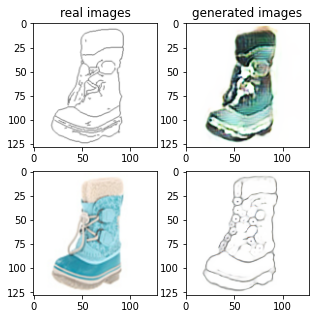

Train Epoch: 1 68% 	Total Loss: 1.349626 	Loss_G_AB: 0.271220	Loss_G_BA: 1.003907	Loss_cycle: 0.434381	Loss_D_A: 0.002087	Loss_D_B: 0.275594
0 34009 T:  1.813368320465088
Train Epoch: 1 68% 	Total Loss: 1.313102 	Loss_G_AB: 0.299347	Loss_G_BA: 0.988323	Loss_cycle: 0.431316	Loss_D_A: 0.003630	Loss_D_B: 0.234321
0 34019 T:  1.1501350402832031
Train Epoch: 1 68% 	Total Loss: 1.261395 	Loss_G_AB: 0.293841	Loss_G_BA: 0.969708	Loss_cycle: 0.378319	Loss_D_A: 0.003416	Loss_D_B: 0.247886
0 34029 T:  1.1492812633514404
Train Epoch: 1 68% 	Total Loss: 1.413630 	Loss_G_AB: 0.306280	Loss_G_BA: 0.988222	Loss_cycle: 0.530840	Loss_D_A: 0.006963	Loss_D_B: 0.228576
0 34039 T:  1.154480218887329
Train Epoch: 1 68% 	Total Loss: 1.347866 	Loss_G_AB: 0.287211	Loss_G_BA: 1.011706	Loss_cycle: 0.468348	Loss_D_A: 0.005800	Loss_D_B: 0.224261
0 34049 T:  1.150357723236084
Train Epoch: 1 68% 	Total Loss: 1.338762 	Loss_G_AB: 0.287562	Loss_G_BA: 1.017498	Loss_cycle: 0.406571	Loss_D_A: 0.003746	Loss_D_B: 0.275914
0 

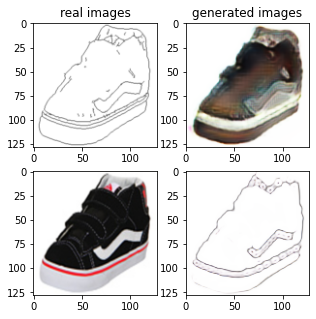

Train Epoch: 1 70% 	Total Loss: 1.367343 	Loss_G_AB: 0.318670	Loss_G_BA: 0.994311	Loss_cycle: 0.480047	Loss_D_A: 0.008173	Loss_D_B: 0.222633
0 35009 T:  1.831791877746582
Train Epoch: 1 70% 	Total Loss: 1.305218 	Loss_G_AB: 0.289914	Loss_G_BA: 0.977209	Loss_cycle: 0.406556	Loss_D_A: 0.015985	Loss_D_B: 0.249116
0 35019 T:  1.1491730213165283
Train Epoch: 1 70% 	Total Loss: 1.306014 	Loss_G_AB: 0.299370	Loss_G_BA: 0.971925	Loss_cycle: 0.387467	Loss_D_A: 0.031350	Loss_D_B: 0.251549
0 35029 T:  1.1504697799682617
Train Epoch: 1 70% 	Total Loss: 1.327528 	Loss_G_AB: 0.286781	Loss_G_BA: 0.944601	Loss_cycle: 0.441066	Loss_D_A: 0.019510	Loss_D_B: 0.251260
0 35039 T:  1.1485259532928467
Train Epoch: 1 70% 	Total Loss: 1.411500 	Loss_G_AB: 0.328914	Loss_G_BA: 0.971811	Loss_cycle: 0.503125	Loss_D_A: 0.008202	Loss_D_B: 0.249810
0 35049 T:  1.1542468070983887
Train Epoch: 1 70% 	Total Loss: 1.379491 	Loss_G_AB: 0.271322	Loss_G_BA: 1.037580	Loss_cycle: 0.463758	Loss_D_A: 0.004655	Loss_D_B: 0.256628


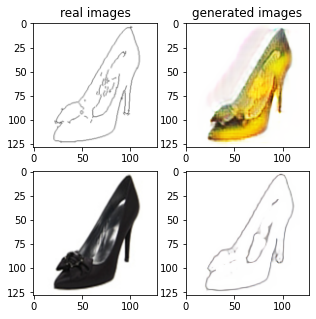

Train Epoch: 1 72% 	Total Loss: 1.360857 	Loss_G_AB: 0.296005	Loss_G_BA: 0.997868	Loss_cycle: 0.458502	Loss_D_A: 0.001873	Loss_D_B: 0.253545
0 36009 T:  1.8297967910766602
Train Epoch: 1 72% 	Total Loss: 1.303617 	Loss_G_AB: 0.298803	Loss_G_BA: 1.002333	Loss_cycle: 0.396678	Loss_D_A: 0.001513	Loss_D_B: 0.254858
0 36019 T:  1.1477453708648682
Train Epoch: 1 72% 	Total Loss: 1.384894 	Loss_G_AB: 0.287714	Loss_G_BA: 0.991452	Loss_cycle: 0.491301	Loss_D_A: 0.001877	Loss_D_B: 0.252133
0 36029 T:  1.198554277420044
Train Epoch: 1 72% 	Total Loss: 1.469466 	Loss_G_AB: 0.315129	Loss_G_BA: 0.989220	Loss_cycle: 0.572844	Loss_D_A: 0.001752	Loss_D_B: 0.242695
0 36039 T:  1.1533477306365967
Train Epoch: 1 72% 	Total Loss: 1.283676 	Loss_G_AB: 0.320269	Loss_G_BA: 0.995215	Loss_cycle: 0.364296	Loss_D_A: 0.002503	Loss_D_B: 0.259136
0 36049 T:  1.15494966506958
Train Epoch: 1 72% 	Total Loss: 1.252083 	Loss_G_AB: 0.277264	Loss_G_BA: 0.995722	Loss_cycle: 0.367740	Loss_D_A: 0.002351	Loss_D_B: 0.245499
0 

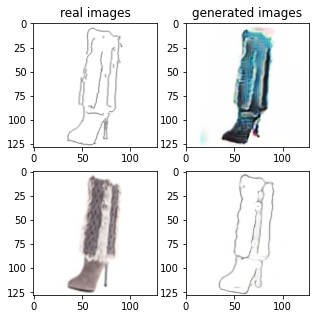

Train Epoch: 1 74% 	Total Loss: 1.345304 	Loss_G_AB: 0.313161	Loss_G_BA: 0.942898	Loss_cycle: 0.471895	Loss_D_A: 0.019677	Loss_D_B: 0.225703
0 37009 T:  1.9960532188415527
Train Epoch: 1 74% 	Total Loss: 1.531576 	Loss_G_AB: 0.319502	Loss_G_BA: 0.915840	Loss_cycle: 0.641947	Loss_D_A: 0.027250	Loss_D_B: 0.244708
0 37019 T:  1.1540873050689697
Train Epoch: 1 74% 	Total Loss: 1.321124 	Loss_G_AB: 0.284567	Loss_G_BA: 0.956287	Loss_cycle: 0.436556	Loss_D_A: 0.016758	Loss_D_B: 0.247383
0 37029 T:  1.153517723083496
Train Epoch: 1 74% 	Total Loss: 1.314613 	Loss_G_AB: 0.311894	Loss_G_BA: 1.025381	Loss_cycle: 0.412993	Loss_D_A: 0.008248	Loss_D_B: 0.224735
0 37039 T:  1.1521685123443604
Train Epoch: 1 74% 	Total Loss: 1.416683 	Loss_G_AB: 0.306328	Loss_G_BA: 1.000904	Loss_cycle: 0.527475	Loss_D_A: 0.002503	Loss_D_B: 0.233090
0 37049 T:  1.1531753540039062
Train Epoch: 1 74% 	Total Loss: 1.227831 	Loss_G_AB: 0.338816	Loss_G_BA: 0.924698	Loss_cycle: 0.326394	Loss_D_A: 0.005793	Loss_D_B: 0.263887


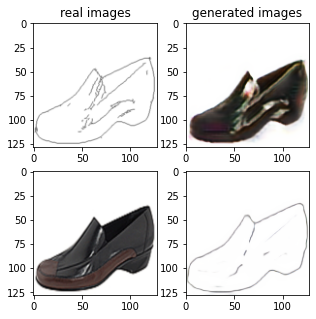

Train Epoch: 1 76% 	Total Loss: 1.338086 	Loss_G_AB: 0.293025	Loss_G_BA: 0.955759	Loss_cycle: 0.464377	Loss_D_A: 0.007240	Loss_D_B: 0.242078
0 38009 T:  1.8146960735321045
Train Epoch: 1 76% 	Total Loss: 1.282464 	Loss_G_AB: 0.320473	Loss_G_BA: 0.952892	Loss_cycle: 0.396551	Loss_D_A: 0.013639	Loss_D_B: 0.235591
0 38019 T:  1.1459879875183105
Train Epoch: 1 76% 	Total Loss: 1.324916 	Loss_G_AB: 0.285441	Loss_G_BA: 1.033019	Loss_cycle: 0.419468	Loss_D_A: 0.006546	Loss_D_B: 0.239671
0 38029 T:  1.1861426830291748
Train Epoch: 1 76% 	Total Loss: 1.318600 	Loss_G_AB: 0.274951	Loss_G_BA: 0.987637	Loss_cycle: 0.419151	Loss_D_A: 0.004155	Loss_D_B: 0.263999
0 38039 T:  1.1542112827301025
Train Epoch: 1 76% 	Total Loss: 1.276374 	Loss_G_AB: 0.313429	Loss_G_BA: 0.991329	Loss_cycle: 0.391135	Loss_D_A: 0.004065	Loss_D_B: 0.228795
0 38049 T:  1.152184247970581
Train Epoch: 1 76% 	Total Loss: 1.434332 	Loss_G_AB: 0.304883	Loss_G_BA: 0.990334	Loss_cycle: 0.530722	Loss_D_A: 0.003553	Loss_D_B: 0.252449


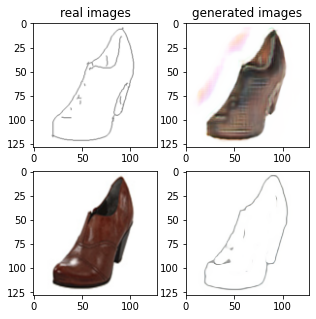

Train Epoch: 1 78% 	Total Loss: 1.407243 	Loss_G_AB: 0.278151	Loss_G_BA: 1.004680	Loss_cycle: 0.490717	Loss_D_A: 0.015104	Loss_D_B: 0.260007
0 39009 T:  1.9802007675170898
Train Epoch: 1 78% 	Total Loss: 1.283354 	Loss_G_AB: 0.283246	Loss_G_BA: 0.923795	Loss_cycle: 0.405277	Loss_D_A: 0.022354	Loss_D_B: 0.252203
0 39019 T:  1.1489715576171875
Train Epoch: 1 78% 	Total Loss: 1.423345 	Loss_G_AB: 0.290811	Loss_G_BA: 0.936433	Loss_cycle: 0.517303	Loss_D_A: 0.043128	Loss_D_B: 0.249292
0 39029 T:  1.1530566215515137
Train Epoch: 1 78% 	Total Loss: 1.471061 	Loss_G_AB: 0.286371	Loss_G_BA: 0.978637	Loss_cycle: 0.543207	Loss_D_A: 0.024862	Loss_D_B: 0.270489
0 39039 T:  1.1530635356903076
Train Epoch: 1 78% 	Total Loss: 1.391522 	Loss_G_AB: 0.295288	Loss_G_BA: 1.002250	Loss_cycle: 0.480435	Loss_D_A: 0.006974	Loss_D_B: 0.255344
0 39049 T:  1.1586790084838867
Train Epoch: 1 78% 	Total Loss: 1.284326 	Loss_G_AB: 0.274175	Loss_G_BA: 0.804640	Loss_cycle: 0.412541	Loss_D_A: 0.099131	Loss_D_B: 0.233246

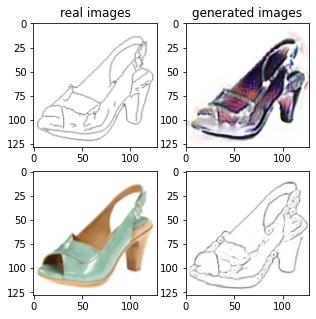

Train Epoch: 1 80% 	Total Loss: 1.401406 	Loss_G_AB: 0.324170	Loss_G_BA: 0.995139	Loss_cycle: 0.511613	Loss_D_A: 0.002091	Loss_D_B: 0.228048
0 40009 T:  1.8749287128448486
Train Epoch: 1 80% 	Total Loss: 1.300997 	Loss_G_AB: 0.306427	Loss_G_BA: 1.003145	Loss_cycle: 0.401989	Loss_D_A: 0.003583	Loss_D_B: 0.240638
0 40019 T:  1.1519396305084229
Train Epoch: 1 80% 	Total Loss: 1.371315 	Loss_G_AB: 0.290299	Loss_G_BA: 0.998573	Loss_cycle: 0.467702	Loss_D_A: 0.001977	Loss_D_B: 0.257200
0 40029 T:  1.14788818359375
Train Epoch: 1 80% 	Total Loss: 1.333074 	Loss_G_AB: 0.292745	Loss_G_BA: 0.988326	Loss_cycle: 0.436649	Loss_D_A: 0.005547	Loss_D_B: 0.250343
0 40039 T:  1.1504383087158203
Train Epoch: 1 80% 	Total Loss: 1.359665 	Loss_G_AB: 0.303671	Loss_G_BA: 0.999820	Loss_cycle: 0.456542	Loss_D_A: 0.003581	Loss_D_B: 0.247797
0 40049 T:  1.1518545150756836
Train Epoch: 1 80% 	Total Loss: 1.244835 	Loss_G_AB: 0.315504	Loss_G_BA: 1.000867	Loss_cycle: 0.337705	Loss_D_A: 0.003871	Loss_D_B: 0.245075
0

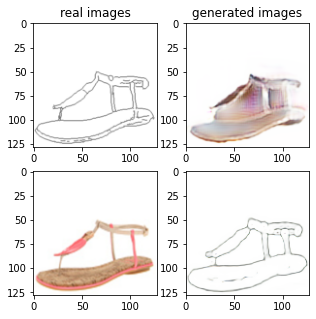

Train Epoch: 1 82% 	Total Loss: 1.367436 	Loss_G_AB: 0.297335	Loss_G_BA: 0.999704	Loss_cycle: 0.483223	Loss_D_A: 0.003534	Loss_D_B: 0.232160
0 41009 T:  1.8871963024139404
Train Epoch: 1 82% 	Total Loss: 1.362602 	Loss_G_AB: 0.322601	Loss_G_BA: 0.995570	Loss_cycle: 0.445526	Loss_D_A: 0.002646	Loss_D_B: 0.255344
0 41019 T:  1.1575837135314941
Train Epoch: 1 82% 	Total Loss: 1.263309 	Loss_G_AB: 0.263609	Loss_G_BA: 0.985294	Loss_cycle: 0.383475	Loss_D_A: 0.002943	Loss_D_B: 0.252439
0 41029 T:  1.1540017127990723
Train Epoch: 1 82% 	Total Loss: 1.334382 	Loss_G_AB: 0.302081	Loss_G_BA: 0.971780	Loss_cycle: 0.449280	Loss_D_A: 0.005374	Loss_D_B: 0.242797
0 41039 T:  1.152759075164795
Train Epoch: 1 82% 	Total Loss: 1.371407 	Loss_G_AB: 0.272232	Loss_G_BA: 1.007565	Loss_cycle: 0.467232	Loss_D_A: 0.008889	Loss_D_B: 0.255386
0 41049 T:  1.1527974605560303
Train Epoch: 1 82% 	Total Loss: 1.382146 	Loss_G_AB: 0.347487	Loss_G_BA: 1.004604	Loss_cycle: 0.498200	Loss_D_A: 0.003106	Loss_D_B: 0.204795


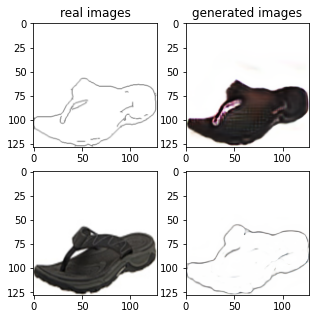

Train Epoch: 1 84% 	Total Loss: 1.268341 	Loss_G_AB: 0.261754	Loss_G_BA: 0.991231	Loss_cycle: 0.381857	Loss_D_A: 0.002563	Loss_D_B: 0.257428
0 42009 T:  1.847149133682251
Train Epoch: 1 84% 	Total Loss: 1.361023 	Loss_G_AB: 0.291600	Loss_G_BA: 0.988316	Loss_cycle: 0.462990	Loss_D_A: 0.003372	Loss_D_B: 0.254703
0 42019 T:  1.1516799926757812
Train Epoch: 1 84% 	Total Loss: 1.264939 	Loss_G_AB: 0.300376	Loss_G_BA: 1.014392	Loss_cycle: 0.357860	Loss_D_A: 0.003851	Loss_D_B: 0.245845
0 42029 T:  1.1585643291473389
Train Epoch: 1 84% 	Total Loss: 1.241169 	Loss_G_AB: 0.314464	Loss_G_BA: 0.992117	Loss_cycle: 0.349489	Loss_D_A: 0.003116	Loss_D_B: 0.235273
0 42039 T:  1.1514217853546143
Train Epoch: 1 84% 	Total Loss: 1.266290 	Loss_G_AB: 0.323738	Loss_G_BA: 1.005634	Loss_cycle: 0.378417	Loss_D_A: 0.001394	Loss_D_B: 0.221794
0 42049 T:  1.1521058082580566
Train Epoch: 1 84% 	Total Loss: 1.273568 	Loss_G_AB: 0.282543	Loss_G_BA: 0.995905	Loss_cycle: 0.365115	Loss_D_A: 0.002374	Loss_D_B: 0.266855


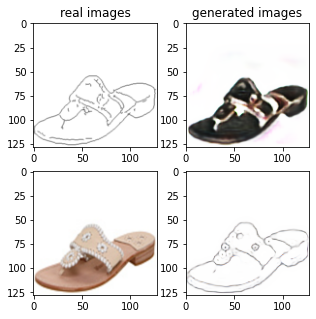

Train Epoch: 1 86% 	Total Loss: 1.280596 	Loss_G_AB: 0.277396	Loss_G_BA: 0.987167	Loss_cycle: 0.366959	Loss_D_A: 0.001613	Loss_D_B: 0.279742
0 43009 T:  1.911137580871582
Train Epoch: 1 86% 	Total Loss: 1.430804 	Loss_G_AB: 0.329710	Loss_G_BA: 0.990720	Loss_cycle: 0.522569	Loss_D_A: 0.004099	Loss_D_B: 0.243921
0 43019 T:  1.1530444622039795
Train Epoch: 1 86% 	Total Loss: 1.428032 	Loss_G_AB: 0.282288	Loss_G_BA: 1.017701	Loss_cycle: 0.509474	Loss_D_A: 0.003086	Loss_D_B: 0.265476
0 43029 T:  1.15541410446167
Train Epoch: 1 86% 	Total Loss: 1.262871 	Loss_G_AB: 0.291415	Loss_G_BA: 0.984330	Loss_cycle: 0.391383	Loss_D_A: 0.002592	Loss_D_B: 0.231024
0 43039 T:  1.1520116329193115
Train Epoch: 1 86% 	Total Loss: 1.298456 	Loss_G_AB: 0.291378	Loss_G_BA: 1.004355	Loss_cycle: 0.398391	Loss_D_A: 0.001807	Loss_D_B: 0.250392
0 43049 T:  1.1566693782806396
Train Epoch: 1 86% 	Total Loss: 1.268133 	Loss_G_AB: 0.301477	Loss_G_BA: 1.005136	Loss_cycle: 0.348268	Loss_D_A: 0.002212	Loss_D_B: 0.264345
0 

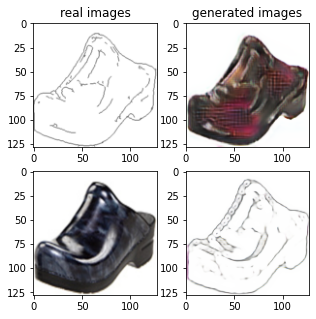

Train Epoch: 1 88% 	Total Loss: 1.214461 	Loss_G_AB: 0.297608	Loss_G_BA: 1.001447	Loss_cycle: 0.304560	Loss_D_A: 0.002528	Loss_D_B: 0.257845
0 44009 T:  1.8557114601135254
Train Epoch: 1 88% 	Total Loss: 1.246208 	Loss_G_AB: 0.247422	Loss_G_BA: 0.983466	Loss_cycle: 0.353540	Loss_D_A: 0.002790	Loss_D_B: 0.274436
0 44019 T:  1.150406837463379
Train Epoch: 1 88% 	Total Loss: 1.220406 	Loss_G_AB: 0.276476	Loss_G_BA: 0.913969	Loss_cycle: 0.337198	Loss_D_A: 0.030525	Loss_D_B: 0.257461
0 44029 T:  1.1574184894561768
Train Epoch: 1 88% 	Total Loss: 1.515024 	Loss_G_AB: 0.282148	Loss_G_BA: 0.885006	Loss_cycle: 0.442030	Loss_D_A: 0.259817	Loss_D_B: 0.229601
0 44039 T:  1.169429063796997
Train Epoch: 1 88% 	Total Loss: 1.316057 	Loss_G_AB: 0.308337	Loss_G_BA: 0.387356	Loss_cycle: 0.417216	Loss_D_A: 0.308130	Loss_D_B: 0.242865
0 44049 T:  1.1519503593444824
Train Epoch: 1 88% 	Total Loss: 1.283984 	Loss_G_AB: 0.296518	Loss_G_BA: 0.475495	Loss_cycle: 0.483234	Loss_D_A: 0.174300	Loss_D_B: 0.240444
0

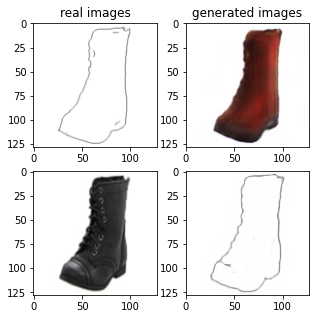

Train Epoch: 1 90% 	Total Loss: 1.266500 	Loss_G_AB: 0.316831	Loss_G_BA: 0.768542	Loss_cycle: 0.376705	Loss_D_A: 0.080781	Loss_D_B: 0.266328
0 45009 T:  1.8368725776672363
Train Epoch: 1 90% 	Total Loss: 1.298617 	Loss_G_AB: 0.279392	Loss_G_BA: 0.819333	Loss_cycle: 0.430168	Loss_D_A: 0.065413	Loss_D_B: 0.253674
0 45019 T:  1.2053916454315186
Train Epoch: 1 90% 	Total Loss: 1.324160 	Loss_G_AB: 0.296100	Loss_G_BA: 0.775755	Loss_cycle: 0.380931	Loss_D_A: 0.185189	Loss_D_B: 0.222112
0 45029 T:  1.1551830768585205
Train Epoch: 1 90% 	Total Loss: 1.434892 	Loss_G_AB: 0.268450	Loss_G_BA: 0.937538	Loss_cycle: 0.497691	Loss_D_A: 0.057515	Loss_D_B: 0.276692
0 45039 T:  1.1519830226898193
Train Epoch: 1 90% 	Total Loss: 1.313725 	Loss_G_AB: 0.291017	Loss_G_BA: 1.002426	Loss_cycle: 0.404210	Loss_D_A: 0.018940	Loss_D_B: 0.243853
0 45049 T:  1.1509320735931396
Train Epoch: 1 90% 	Total Loss: 1.248771 	Loss_G_AB: 0.303302	Loss_G_BA: 0.987279	Loss_cycle: 0.348807	Loss_D_A: 0.013531	Loss_D_B: 0.241142

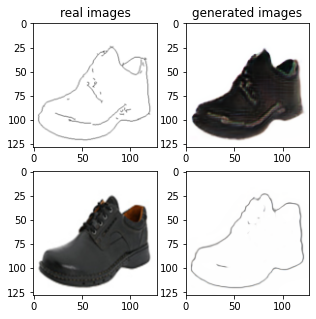

Train Epoch: 1 92% 	Total Loss: 1.264930 	Loss_G_AB: 0.307125	Loss_G_BA: 1.003643	Loss_cycle: 0.370859	Loss_D_A: 0.005237	Loss_D_B: 0.233450
0 46009 T:  1.9744179248809814
Train Epoch: 1 92% 	Total Loss: 1.302003 	Loss_G_AB: 0.296176	Loss_G_BA: 1.006832	Loss_cycle: 0.429547	Loss_D_A: 0.002375	Loss_D_B: 0.218576
0 46019 T:  1.1538856029510498
Train Epoch: 1 92% 	Total Loss: 1.290584 	Loss_G_AB: 0.383896	Loss_G_BA: 0.975150	Loss_cycle: 0.409112	Loss_D_A: 0.003449	Loss_D_B: 0.198500
0 46029 T:  1.1521730422973633
Train Epoch: 1 92% 	Total Loss: 1.267400 	Loss_G_AB: 0.318783	Loss_G_BA: 1.011039	Loss_cycle: 0.326966	Loss_D_A: 0.004488	Loss_D_B: 0.271036
0 46039 T:  1.1535325050354004
Train Epoch: 1 92% 	Total Loss: 1.301379 	Loss_G_AB: 0.318231	Loss_G_BA: 1.016178	Loss_cycle: 0.406322	Loss_D_A: 0.002491	Loss_D_B: 0.225361
0 46049 T:  1.1556549072265625
Train Epoch: 1 92% 	Total Loss: 1.384118 	Loss_G_AB: 0.434137	Loss_G_BA: 1.006295	Loss_cycle: 0.444780	Loss_D_A: 0.005065	Loss_D_B: 0.214057

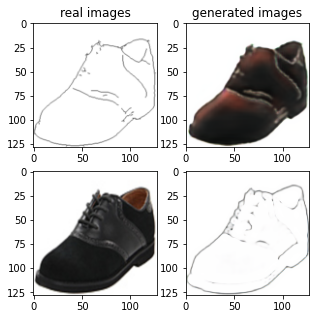

Train Epoch: 1 94% 	Total Loss: 1.373813 	Loss_G_AB: 0.335836	Loss_G_BA: 0.983918	Loss_cycle: 0.466154	Loss_D_A: 0.011292	Loss_D_B: 0.236490
0 47009 T:  1.8565483093261719
Train Epoch: 1 94% 	Total Loss: 1.477964 	Loss_G_AB: 0.328762	Loss_G_BA: 1.011252	Loss_cycle: 0.531983	Loss_D_A: 0.004578	Loss_D_B: 0.271396
0 47019 T:  1.1532220840454102
Train Epoch: 1 94% 	Total Loss: 1.299249 	Loss_G_AB: 0.296618	Loss_G_BA: 0.988248	Loss_cycle: 0.411345	Loss_D_A: 0.006718	Loss_D_B: 0.238752
0 47029 T:  1.1541366577148438
Train Epoch: 1 94% 	Total Loss: 1.392427 	Loss_G_AB: 0.273925	Loss_G_BA: 1.004224	Loss_cycle: 0.474707	Loss_D_A: 0.005193	Loss_D_B: 0.273453
0 47039 T:  1.1556758880615234
Train Epoch: 1 94% 	Total Loss: 1.240251 	Loss_G_AB: 0.296330	Loss_G_BA: 1.003991	Loss_cycle: 0.362022	Loss_D_A: 0.003505	Loss_D_B: 0.224563
0 47049 T:  1.1532866954803467
Train Epoch: 1 94% 	Total Loss: 1.311210 	Loss_G_AB: 0.320272	Loss_G_BA: 1.018189	Loss_cycle: 0.377705	Loss_D_A: 0.004759	Loss_D_B: 0.259516

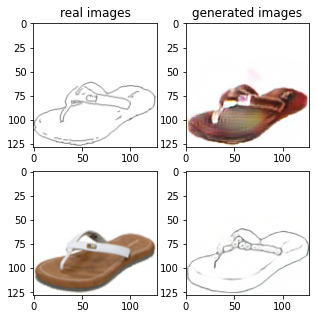

Train Epoch: 1 96% 	Total Loss: 1.269531 	Loss_G_AB: 0.278348	Loss_G_BA: 0.995510	Loss_cycle: 0.368020	Loss_D_A: 0.003016	Loss_D_B: 0.261566
0 48009 T:  2.059112071990967
Train Epoch: 1 96% 	Total Loss: 1.272523 	Loss_G_AB: 0.271719	Loss_G_BA: 1.003394	Loss_cycle: 0.380096	Loss_D_A: 0.003292	Loss_D_B: 0.251579
0 48019 T:  1.182854175567627
Train Epoch: 1 96% 	Total Loss: 1.202018 	Loss_G_AB: 0.289765	Loss_G_BA: 0.987224	Loss_cycle: 0.313239	Loss_D_A: 0.004737	Loss_D_B: 0.245547
0 48029 T:  1.1858000755310059
Train Epoch: 1 96% 	Total Loss: 1.303804 	Loss_G_AB: 0.271233	Loss_G_BA: 0.970726	Loss_cycle: 0.423491	Loss_D_A: 0.007157	Loss_D_B: 0.252176
0 48039 T:  1.180133581161499
Train Epoch: 1 96% 	Total Loss: 1.236295 	Loss_G_AB: 0.283295	Loss_G_BA: 0.994421	Loss_cycle: 0.332083	Loss_D_A: 0.007792	Loss_D_B: 0.257561
0 48049 T:  1.1796281337738037
Train Epoch: 1 96% 	Total Loss: 1.309079 	Loss_G_AB: 0.307432	Loss_G_BA: 0.999961	Loss_cycle: 0.409687	Loss_D_A: 0.011359	Loss_D_B: 0.234337
0 

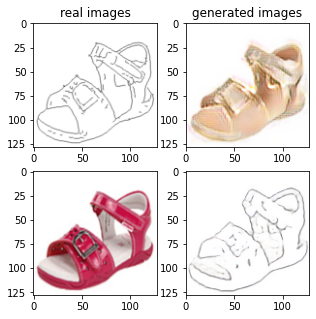

Train Epoch: 1 98% 	Total Loss: 1.249588 	Loss_G_AB: 0.352976	Loss_G_BA: 0.917847	Loss_cycle: 0.338035	Loss_D_A: 0.053126	Loss_D_B: 0.223015
0 49009 T:  2.0891098976135254
Train Epoch: 1 98% 	Total Loss: 1.301525 	Loss_G_AB: 0.322894	Loss_G_BA: 0.517200	Loss_cycle: 0.387343	Loss_D_A: 0.223375	Loss_D_B: 0.270761
0 49019 T:  1.1511361598968506
Train Epoch: 1 98% 	Total Loss: 1.301510 	Loss_G_AB: 0.373866	Loss_G_BA: 0.616327	Loss_cycle: 0.375082	Loss_D_A: 0.208560	Loss_D_B: 0.222773
0 49029 T:  1.1492061614990234
Train Epoch: 1 98% 	Total Loss: 1.383880 	Loss_G_AB: 0.267327	Loss_G_BA: 0.879050	Loss_cycle: 0.436085	Loss_D_A: 0.062334	Loss_D_B: 0.312273
0 49039 T:  1.1491901874542236
Train Epoch: 1 98% 	Total Loss: 1.391949 	Loss_G_AB: 0.347362	Loss_G_BA: 0.905228	Loss_cycle: 0.457855	Loss_D_A: 0.090666	Loss_D_B: 0.217133
0 49049 T:  1.1536662578582764
Train Epoch: 1 98% 	Total Loss: 1.305456 	Loss_G_AB: 0.281345	Loss_G_BA: 0.923251	Loss_cycle: 0.346562	Loss_D_A: 0.081046	Loss_D_B: 0.275550

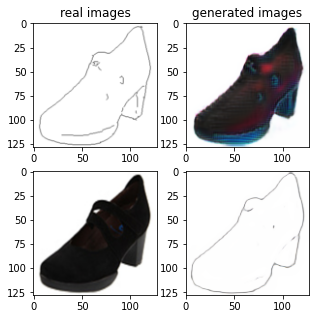

Train Epoch: 2 0% 	Total Loss: 1.310233 	Loss_G_AB: 0.303242	Loss_G_BA: 0.977794	Loss_cycle: 0.419905	Loss_D_A: 0.004215	Loss_D_B: 0.245595
1 50009 T:  1.8428020477294922
Train Epoch: 2 0% 	Total Loss: 1.291018 	Loss_G_AB: 0.349361	Loss_G_BA: 0.957334	Loss_cycle: 0.371699	Loss_D_A: 0.023797	Loss_D_B: 0.242175
1 50019 T:  1.1529991626739502
Train Epoch: 2 0% 	Total Loss: 1.235958 	Loss_G_AB: 0.284429	Loss_G_BA: 0.999336	Loss_cycle: 0.332954	Loss_D_A: 0.006464	Loss_D_B: 0.254657
1 50029 T:  1.1543633937835693
Train Epoch: 2 0% 	Total Loss: 1.213064 	Loss_G_AB: 0.270242	Loss_G_BA: 1.012318	Loss_cycle: 0.309057	Loss_D_A: 0.004776	Loss_D_B: 0.257951
1 50039 T:  1.1493020057678223
Train Epoch: 2 0% 	Total Loss: 1.220870 	Loss_G_AB: 0.351891	Loss_G_BA: 0.996767	Loss_cycle: 0.359281	Loss_D_A: 0.005800	Loss_D_B: 0.181461
1 50049 T:  1.1488301753997803
Train Epoch: 2 0% 	Total Loss: 1.175158 	Loss_G_AB: 0.312022	Loss_G_BA: 0.993820	Loss_cycle: 0.264076	Loss_D_A: 0.003352	Loss_D_B: 0.254809
1 500

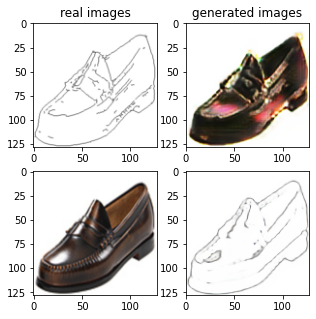

Train Epoch: 2 2% 	Total Loss: 1.431729 	Loss_G_AB: 0.346646	Loss_G_BA: 0.988388	Loss_cycle: 0.499144	Loss_D_A: 0.002523	Loss_D_B: 0.262544
1 51009 T:  1.835251808166504
Train Epoch: 2 2% 	Total Loss: 1.388234 	Loss_G_AB: 0.276433	Loss_G_BA: 1.030482	Loss_cycle: 0.459588	Loss_D_A: 0.002013	Loss_D_B: 0.273175
1 51019 T:  1.1501591205596924
Train Epoch: 2 2% 	Total Loss: 1.313214 	Loss_G_AB: 0.316946	Loss_G_BA: 0.993784	Loss_cycle: 0.420203	Loss_D_A: 0.002726	Loss_D_B: 0.234920
1 51029 T:  1.1474888324737549
Train Epoch: 2 2% 	Total Loss: 1.259355 	Loss_G_AB: 0.298221	Loss_G_BA: 0.983991	Loss_cycle: 0.372158	Loss_D_A: 0.002030	Loss_D_B: 0.244060
1 51039 T:  1.152339220046997
Train Epoch: 2 2% 	Total Loss: 1.303505 	Loss_G_AB: 0.332514	Loss_G_BA: 0.984513	Loss_cycle: 0.410864	Loss_D_A: 0.002649	Loss_D_B: 0.231478
1 51049 T:  1.14970064163208
Train Epoch: 2 2% 	Total Loss: 1.251428 	Loss_G_AB: 0.287839	Loss_G_BA: 1.007315	Loss_cycle: 0.367848	Loss_D_A: 0.003118	Loss_D_B: 0.232885
1 51059 T

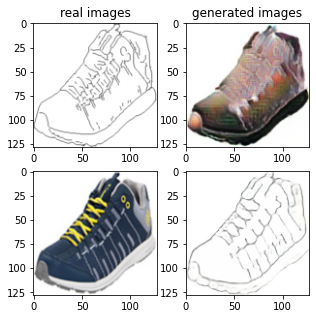

Train Epoch: 2 4% 	Total Loss: 1.360651 	Loss_G_AB: 0.297548	Loss_G_BA: 0.981253	Loss_cycle: 0.482590	Loss_D_A: 0.002668	Loss_D_B: 0.235994
1 52009 T:  1.8929004669189453
Train Epoch: 2 4% 	Total Loss: 1.297371 	Loss_G_AB: 0.292552	Loss_G_BA: 1.007168	Loss_cycle: 0.406387	Loss_D_A: 0.001881	Loss_D_B: 0.239243
1 52019 T:  1.149343490600586
Train Epoch: 2 4% 	Total Loss: 1.274832 	Loss_G_AB: 0.327115	Loss_G_BA: 0.979980	Loss_cycle: 0.373980	Loss_D_A: 0.014139	Loss_D_B: 0.233165
1 52029 T:  1.1467633247375488
Train Epoch: 2 4% 	Total Loss: 1.378277 	Loss_G_AB: 0.294229	Loss_G_BA: 0.899665	Loss_cycle: 0.458502	Loss_D_A: 0.054555	Loss_D_B: 0.268273
1 52039 T:  1.144810676574707
Train Epoch: 2 4% 	Total Loss: 1.295775 	Loss_G_AB: 0.381355	Loss_G_BA: 0.989502	Loss_cycle: 0.356250	Loss_D_A: 0.028414	Loss_D_B: 0.225682
1 52049 T:  1.1528184413909912
Train Epoch: 2 4% 	Total Loss: 1.266376 	Loss_G_AB: 0.283101	Loss_G_BA: 0.987738	Loss_cycle: 0.358983	Loss_D_A: 0.010302	Loss_D_B: 0.261671
1 52059

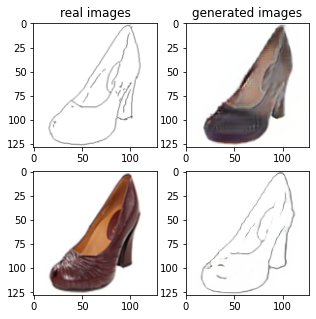

Train Epoch: 2 6% 	Total Loss: 1.237899 	Loss_G_AB: 0.271597	Loss_G_BA: 0.969278	Loss_cycle: 0.338760	Loss_D_A: 0.018377	Loss_D_B: 0.260325
1 53009 T:  1.82472562789917
Train Epoch: 2 6% 	Total Loss: 1.341760 	Loss_G_AB: 0.286223	Loss_G_BA: 0.983339	Loss_cycle: 0.447769	Loss_D_A: 0.011244	Loss_D_B: 0.247966
1 53019 T:  1.148618459701538
Train Epoch: 2 6% 	Total Loss: 1.376212 	Loss_G_AB: 0.265893	Loss_G_BA: 0.985431	Loss_cycle: 0.495753	Loss_D_A: 0.003598	Loss_D_B: 0.251200
1 53029 T:  1.1532783508300781
Train Epoch: 2 6% 	Total Loss: 1.294203 	Loss_G_AB: 0.311370	Loss_G_BA: 0.960361	Loss_cycle: 0.404870	Loss_D_A: 0.017558	Loss_D_B: 0.235909
1 53039 T:  1.150327205657959
Train Epoch: 2 6% 	Total Loss: 1.249569 	Loss_G_AB: 0.296305	Loss_G_BA: 0.893337	Loss_cycle: 0.369611	Loss_D_A: 0.028001	Loss_D_B: 0.257137
1 53049 T:  1.1488866806030273
Train Epoch: 2 6% 	Total Loss: 1.327079 	Loss_G_AB: 0.324503	Loss_G_BA: 1.022460	Loss_cycle: 0.402162	Loss_D_A: 0.027864	Loss_D_B: 0.223572
1 53059 T

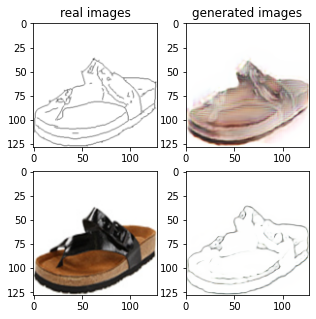

Train Epoch: 2 8% 	Total Loss: 1.222193 	Loss_G_AB: 0.317450	Loss_G_BA: 0.988159	Loss_cycle: 0.321715	Loss_D_A: 0.001710	Loss_D_B: 0.245964
1 54009 T:  1.8199431896209717
Train Epoch: 2 8% 	Total Loss: 1.233494 	Loss_G_AB: 0.345728	Loss_G_BA: 0.992410	Loss_cycle: 0.357476	Loss_D_A: 0.002623	Loss_D_B: 0.204326
1 54019 T:  1.1490411758422852
Train Epoch: 2 8% 	Total Loss: 1.301669 	Loss_G_AB: 0.309030	Loss_G_BA: 1.004085	Loss_cycle: 0.380671	Loss_D_A: 0.002853	Loss_D_B: 0.261587
1 54029 T:  1.1512608528137207
Train Epoch: 2 8% 	Total Loss: 1.438444 	Loss_G_AB: 0.402554	Loss_G_BA: 0.817336	Loss_cycle: 0.373147	Loss_D_A: 0.265830	Loss_D_B: 0.189523
1 54039 T:  1.1479201316833496
Train Epoch: 2 8% 	Total Loss: 1.268779 	Loss_G_AB: 0.326041	Loss_G_BA: 0.746883	Loss_cycle: 0.396418	Loss_D_A: 0.109572	Loss_D_B: 0.226327
1 54049 T:  1.1519012451171875
Train Epoch: 2 8% 	Total Loss: 1.261985 	Loss_G_AB: 0.324530	Loss_G_BA: 0.855483	Loss_cycle: 0.391787	Loss_D_A: 0.047336	Loss_D_B: 0.232856
1 540

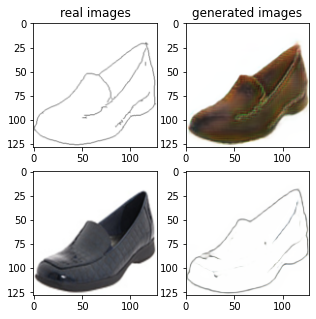

Train Epoch: 2 10% 	Total Loss: 1.262829 	Loss_G_AB: 0.332377	Loss_G_BA: 0.994543	Loss_cycle: 0.356898	Loss_D_A: 0.002531	Loss_D_B: 0.239940
1 55009 T:  1.9164690971374512
Train Epoch: 2 10% 	Total Loss: 1.268934 	Loss_G_AB: 0.297010	Loss_G_BA: 0.927480	Loss_cycle: 0.388479	Loss_D_A: 0.019621	Loss_D_B: 0.248589
1 55019 T:  1.1510365009307861
Train Epoch: 2 10% 	Total Loss: 1.286255 	Loss_G_AB: 0.288852	Loss_G_BA: 1.051528	Loss_cycle: 0.374218	Loss_D_A: 0.005968	Loss_D_B: 0.235879
1 55029 T:  1.1473143100738525
Train Epoch: 2 10% 	Total Loss: 1.267126 	Loss_G_AB: 0.314327	Loss_G_BA: 1.029496	Loss_cycle: 0.383928	Loss_D_A: 0.002779	Loss_D_B: 0.208508
1 55039 T:  1.1473877429962158
Train Epoch: 2 10% 	Total Loss: 1.293356 	Loss_G_AB: 0.301741	Loss_G_BA: 0.983557	Loss_cycle: 0.406791	Loss_D_A: 0.003698	Loss_D_B: 0.240218
1 55049 T:  1.151026725769043
Train Epoch: 2 11% 	Total Loss: 1.304097 	Loss_G_AB: 0.289500	Loss_G_BA: 1.000251	Loss_cycle: 0.386545	Loss_D_A: 0.003387	Loss_D_B: 0.269289


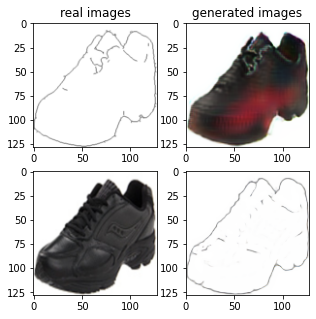

Train Epoch: 2 12% 	Total Loss: 1.264037 	Loss_G_AB: 0.307321	Loss_G_BA: 0.971247	Loss_cycle: 0.359473	Loss_D_A: 0.016339	Loss_D_B: 0.248940
1 56009 T:  1.820408821105957
Train Epoch: 2 12% 	Total Loss: 1.354356 	Loss_G_AB: 0.283897	Loss_G_BA: 0.989517	Loss_cycle: 0.457071	Loss_D_A: 0.005831	Loss_D_B: 0.254747
1 56019 T:  1.1455016136169434
Train Epoch: 2 12% 	Total Loss: 1.233527 	Loss_G_AB: 0.293491	Loss_G_BA: 0.963641	Loss_cycle: 0.346936	Loss_D_A: 0.013327	Loss_D_B: 0.244698
1 56029 T:  1.1494066715240479
Train Epoch: 2 12% 	Total Loss: 1.255427 	Loss_G_AB: 0.293294	Loss_G_BA: 0.999124	Loss_cycle: 0.368795	Loss_D_A: 0.004253	Loss_D_B: 0.236170
1 56039 T:  1.1513714790344238
Train Epoch: 2 12% 	Total Loss: 1.294272 	Loss_G_AB: 0.285512	Loss_G_BA: 1.009954	Loss_cycle: 0.402685	Loss_D_A: 0.004444	Loss_D_B: 0.239410
1 56049 T:  1.1504461765289307
Train Epoch: 2 13% 	Total Loss: 1.292018 	Loss_G_AB: 0.289663	Loss_G_BA: 0.996462	Loss_cycle: 0.399128	Loss_D_A: 0.004218	Loss_D_B: 0.245610


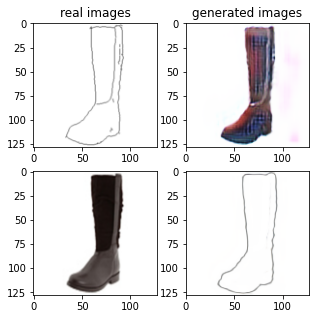

Train Epoch: 2 14% 	Total Loss: 1.332382 	Loss_G_AB: 0.293919	Loss_G_BA: 1.036350	Loss_cycle: 0.401231	Loss_D_A: 0.003030	Loss_D_B: 0.262987
1 57009 T:  1.8127849102020264
Train Epoch: 2 14% 	Total Loss: 1.308009 	Loss_G_AB: 0.332505	Loss_G_BA: 1.002699	Loss_cycle: 0.384271	Loss_D_A: 0.002094	Loss_D_B: 0.254041
1 57019 T:  1.1490304470062256
Train Epoch: 2 14% 	Total Loss: 1.316057 	Loss_G_AB: 0.314963	Loss_G_BA: 0.986739	Loss_cycle: 0.416266	Loss_D_A: 0.003594	Loss_D_B: 0.245346
1 57029 T:  1.1498174667358398
Train Epoch: 2 14% 	Total Loss: 1.227431 	Loss_G_AB: 0.316711	Loss_G_BA: 1.022791	Loss_cycle: 0.334092	Loss_D_A: 0.002905	Loss_D_B: 0.220683
1 57039 T:  1.1474900245666504
Train Epoch: 2 14% 	Total Loss: 1.230948 	Loss_G_AB: 0.286984	Loss_G_BA: 0.996995	Loss_cycle: 0.348968	Loss_D_A: 0.002500	Loss_D_B: 0.237490
1 57049 T:  1.1471502780914307
Train Epoch: 2 15% 	Total Loss: 1.229242 	Loss_G_AB: 0.287680	Loss_G_BA: 0.981065	Loss_cycle: 0.355982	Loss_D_A: 0.005387	Loss_D_B: 0.233501

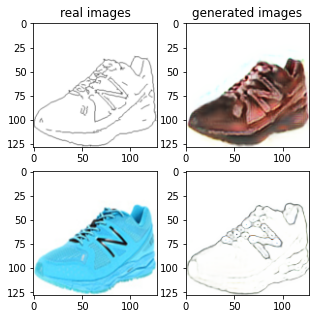

Train Epoch: 2 16% 	Total Loss: 1.349568 	Loss_G_AB: 0.316738	Loss_G_BA: 0.977026	Loss_cycle: 0.440743	Loss_D_A: 0.017227	Loss_D_B: 0.244715
1 58009 T:  1.8341763019561768
Train Epoch: 2 16% 	Total Loss: 1.214807 	Loss_G_AB: 0.289786	Loss_G_BA: 0.938525	Loss_cycle: 0.325394	Loss_D_A: 0.037167	Loss_D_B: 0.238090
1 58019 T:  1.1486284732818604
Train Epoch: 2 16% 	Total Loss: 1.277200 	Loss_G_AB: 0.264059	Loss_G_BA: 0.939265	Loss_cycle: 0.382287	Loss_D_A: 0.020730	Loss_D_B: 0.272520
1 58029 T:  1.147831678390503
Train Epoch: 2 16% 	Total Loss: 1.337204 	Loss_G_AB: 0.289015	Loss_G_BA: 1.035703	Loss_cycle: 0.406511	Loss_D_A: 0.010392	Loss_D_B: 0.257942
1 58039 T:  1.148963451385498
Train Epoch: 2 17% 	Total Loss: 1.253839 	Loss_G_AB: 0.334189	Loss_G_BA: 1.005178	Loss_cycle: 0.345175	Loss_D_A: 0.002836	Loss_D_B: 0.236145
1 58049 T:  1.154632329940796
Train Epoch: 2 17% 	Total Loss: 1.319625 	Loss_G_AB: 0.275317	Loss_G_BA: 0.995595	Loss_cycle: 0.429578	Loss_D_A: 0.002331	Loss_D_B: 0.252260
1 

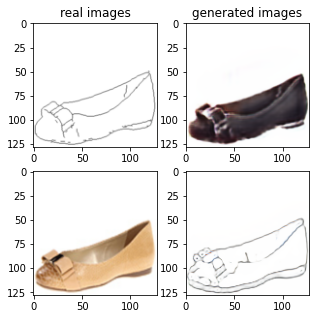

Train Epoch: 2 18% 	Total Loss: 1.439521 	Loss_G_AB: 0.353475	Loss_G_BA: 1.053313	Loss_cycle: 0.458239	Loss_D_A: 0.020102	Loss_D_B: 0.257786
1 59009 T:  1.9300849437713623
Train Epoch: 2 18% 	Total Loss: 1.451381 	Loss_G_AB: 0.365074	Loss_G_BA: 1.028034	Loss_cycle: 0.534359	Loss_D_A: 0.006692	Loss_D_B: 0.213775
1 59019 T:  1.1511433124542236
Train Epoch: 2 18% 	Total Loss: 1.377810 	Loss_G_AB: 0.289045	Loss_G_BA: 1.009970	Loss_cycle: 0.444912	Loss_D_A: 0.002527	Loss_D_B: 0.280864
1 59029 T:  1.1475834846496582
Train Epoch: 2 18% 	Total Loss: 1.262352 	Loss_G_AB: 0.274167	Loss_G_BA: 0.985175	Loss_cycle: 0.380214	Loss_D_A: 0.003828	Loss_D_B: 0.248638
1 59039 T:  1.1459951400756836
Train Epoch: 2 19% 	Total Loss: 1.288150 	Loss_G_AB: 0.374009	Loss_G_BA: 0.952652	Loss_cycle: 0.378597	Loss_D_A: 0.003717	Loss_D_B: 0.242505
1 59049 T:  1.1499912738800049
Train Epoch: 2 19% 	Total Loss: 1.282719 	Loss_G_AB: 0.310100	Loss_G_BA: 1.024494	Loss_cycle: 0.389001	Loss_D_A: 0.004810	Loss_D_B: 0.221611

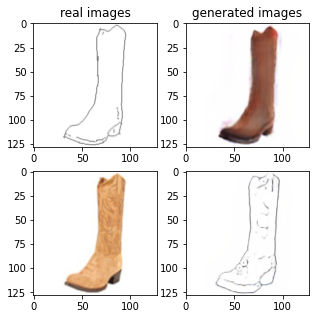

Train Epoch: 2 20% 	Total Loss: 1.266219 	Loss_G_AB: 0.297328	Loss_G_BA: 0.991414	Loss_cycle: 0.377038	Loss_D_A: 0.003732	Loss_D_B: 0.241078
1 60009 T:  1.8797082901000977
Train Epoch: 2 20% 	Total Loss: 1.277474 	Loss_G_AB: 0.327687	Loss_G_BA: 1.008765	Loss_cycle: 0.388386	Loss_D_A: 0.001876	Loss_D_B: 0.218986
1 60019 T:  1.1512560844421387
Train Epoch: 2 20% 	Total Loss: 1.311168 	Loss_G_AB: 0.291109	Loss_G_BA: 0.975370	Loss_cycle: 0.417337	Loss_D_A: 0.003738	Loss_D_B: 0.256853
1 60029 T:  1.150115728378296
Train Epoch: 2 20% 	Total Loss: 1.250072 	Loss_G_AB: 0.291233	Loss_G_BA: 1.001714	Loss_cycle: 0.352194	Loss_D_A: 0.004894	Loss_D_B: 0.246510
1 60039 T:  1.152024269104004
Train Epoch: 2 21% 	Total Loss: 1.306025 	Loss_G_AB: 0.285620	Loss_G_BA: 1.000521	Loss_cycle: 0.418982	Loss_D_A: 0.002361	Loss_D_B: 0.241611
1 60049 T:  1.1560192108154297
Train Epoch: 2 21% 	Total Loss: 1.350965 	Loss_G_AB: 0.319756	Loss_G_BA: 0.984250	Loss_cycle: 0.417231	Loss_D_A: 0.009217	Loss_D_B: 0.272514
1

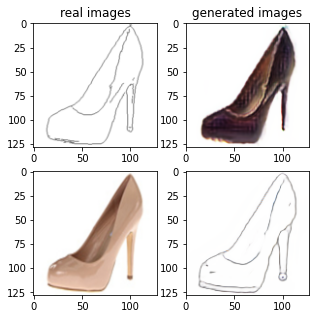

Train Epoch: 2 22% 	Total Loss: 1.308329 	Loss_G_AB: 0.328211	Loss_G_BA: 0.987603	Loss_cycle: 0.418586	Loss_D_A: 0.010799	Loss_D_B: 0.221037
1 61009 T:  1.8985674381256104
Train Epoch: 2 22% 	Total Loss: 1.178374 	Loss_G_AB: 0.277234	Loss_G_BA: 0.916434	Loss_cycle: 0.311161	Loss_D_A: 0.029478	Loss_D_B: 0.240900
1 61019 T:  1.1520893573760986
Train Epoch: 2 22% 	Total Loss: 1.301743 	Loss_G_AB: 0.340723	Loss_G_BA: 1.002596	Loss_cycle: 0.387312	Loss_D_A: 0.010127	Loss_D_B: 0.232645
1 61029 T:  1.1531271934509277
Train Epoch: 2 23% 	Total Loss: 1.268877 	Loss_G_AB: 0.340146	Loss_G_BA: 1.008034	Loss_cycle: 0.382041	Loss_D_A: 0.005706	Loss_D_B: 0.207038
1 61039 T:  1.1529254913330078
Train Epoch: 2 23% 	Total Loss: 1.317307 	Loss_G_AB: 0.306775	Loss_G_BA: 0.986347	Loss_cycle: 0.448173	Loss_D_A: 0.005971	Loss_D_B: 0.216602
1 61049 T:  1.1545121669769287
Train Epoch: 2 23% 	Total Loss: 1.398790 	Loss_G_AB: 0.334809	Loss_G_BA: 1.000122	Loss_cycle: 0.442158	Loss_D_A: 0.004365	Loss_D_B: 0.284802

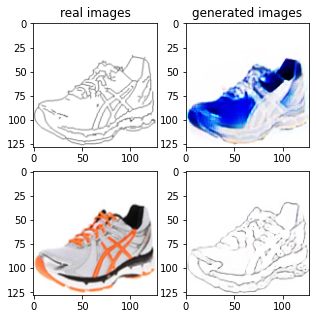

Train Epoch: 2 24% 	Total Loss: 1.416085 	Loss_G_AB: 0.335945	Loss_G_BA: 1.007310	Loss_cycle: 0.520524	Loss_D_A: 0.004347	Loss_D_B: 0.219587
1 62009 T:  1.8264598846435547
Train Epoch: 2 24% 	Total Loss: 1.252006 	Loss_G_AB: 0.313453	Loss_G_BA: 0.960485	Loss_cycle: 0.349361	Loss_D_A: 0.011857	Loss_D_B: 0.253819
1 62019 T:  1.150041103363037
Train Epoch: 2 24% 	Total Loss: 1.258713 	Loss_G_AB: 0.267608	Loss_G_BA: 1.001747	Loss_cycle: 0.363300	Loss_D_A: 0.002267	Loss_D_B: 0.258469
1 62029 T:  1.1491470336914062
Train Epoch: 2 25% 	Total Loss: 1.372298 	Loss_G_AB: 0.377738	Loss_G_BA: 1.004220	Loss_cycle: 0.483978	Loss_D_A: 0.002653	Loss_D_B: 0.194688
1 62039 T:  1.1553621292114258
Train Epoch: 2 25% 	Total Loss: 1.305759 	Loss_G_AB: 0.292220	Loss_G_BA: 0.975954	Loss_cycle: 0.404102	Loss_D_A: 0.003467	Loss_D_B: 0.264104
1 62049 T:  1.1487822532653809
Train Epoch: 2 25% 	Total Loss: 1.228462 	Loss_G_AB: 0.283637	Loss_G_BA: 1.019111	Loss_cycle: 0.327539	Loss_D_A: 0.003113	Loss_D_B: 0.246436


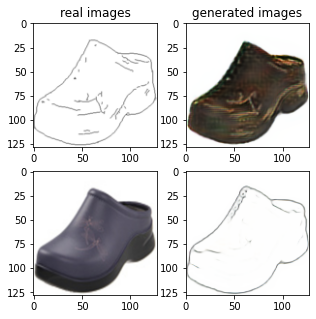

Train Epoch: 2 26% 	Total Loss: 1.181930 	Loss_G_AB: 0.278451	Loss_G_BA: 0.999533	Loss_cycle: 0.295900	Loss_D_A: 0.003674	Loss_D_B: 0.243364
1 63009 T:  2.0572545528411865
Train Epoch: 2 26% 	Total Loss: 1.189251 	Loss_G_AB: 0.292343	Loss_G_BA: 0.977677	Loss_cycle: 0.304180	Loss_D_A: 0.002256	Loss_D_B: 0.247804
1 63019 T:  1.1510133743286133
Train Epoch: 2 27% 	Total Loss: 1.237193 	Loss_G_AB: 0.278426	Loss_G_BA: 1.000196	Loss_cycle: 0.358703	Loss_D_A: 0.003306	Loss_D_B: 0.235873
1 63029 T:  1.1477696895599365
Train Epoch: 2 27% 	Total Loss: 1.282888 	Loss_G_AB: 0.305684	Loss_G_BA: 0.954737	Loss_cycle: 0.346176	Loss_D_A: 0.064592	Loss_D_B: 0.241909
1 63039 T:  1.1481363773345947
Train Epoch: 2 27% 	Total Loss: 1.290185 	Loss_G_AB: 0.317496	Loss_G_BA: 1.006238	Loss_cycle: 0.372625	Loss_D_A: 0.018627	Loss_D_B: 0.237067
1 63049 T:  1.153290033340454
Train Epoch: 2 27% 	Total Loss: 1.214954 	Loss_G_AB: 0.260862	Loss_G_BA: 0.977870	Loss_cycle: 0.331625	Loss_D_A: 0.021028	Loss_D_B: 0.242935


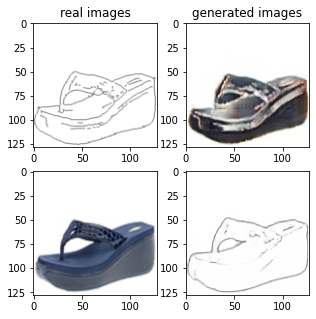

Train Epoch: 2 28% 	Total Loss: 1.235895 	Loss_G_AB: 0.312248	Loss_G_BA: 0.990230	Loss_cycle: 0.343096	Loss_D_A: 0.002959	Loss_D_B: 0.238602
1 64009 T:  1.851766586303711
Train Epoch: 2 28% 	Total Loss: 1.364616 	Loss_G_AB: 0.271484	Loss_G_BA: 0.972201	Loss_cycle: 0.453877	Loss_D_A: 0.019497	Loss_D_B: 0.269399
1 64019 T:  1.1506192684173584
Train Epoch: 2 29% 	Total Loss: 1.426668 	Loss_G_AB: 0.345489	Loss_G_BA: 0.998787	Loss_cycle: 0.517933	Loss_D_A: 0.005901	Loss_D_B: 0.230697
1 64029 T:  1.156830072402954
Train Epoch: 2 29% 	Total Loss: 1.331473 	Loss_G_AB: 0.323156	Loss_G_BA: 0.968751	Loss_cycle: 0.410752	Loss_D_A: 0.003805	Loss_D_B: 0.270962
1 64039 T:  1.1534655094146729
Train Epoch: 2 29% 	Total Loss: 1.245144 	Loss_G_AB: 0.246689	Loss_G_BA: 1.015980	Loss_cycle: 0.341953	Loss_D_A: 0.002307	Loss_D_B: 0.269550
1 64049 T:  1.152677059173584
Train Epoch: 2 29% 	Total Loss: 1.203676 	Loss_G_AB: 0.280797	Loss_G_BA: 0.911196	Loss_cycle: 0.324771	Loss_D_A: 0.017619	Loss_D_B: 0.265289
1 

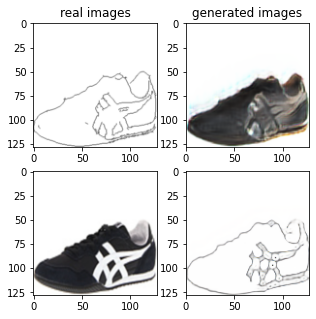

Train Epoch: 2 30% 	Total Loss: 1.211053 	Loss_G_AB: 0.269810	Loss_G_BA: 1.004437	Loss_cycle: 0.288863	Loss_D_A: 0.007477	Loss_D_B: 0.277589
1 65009 T:  1.8248860836029053
Train Epoch: 2 30% 	Total Loss: 1.226312 	Loss_G_AB: 0.273881	Loss_G_BA: 1.001109	Loss_cycle: 0.336948	Loss_D_A: 0.002257	Loss_D_B: 0.249612
1 65019 T:  1.1511354446411133
Train Epoch: 2 31% 	Total Loss: 1.167970 	Loss_G_AB: 0.301939	Loss_G_BA: 0.981023	Loss_cycle: 0.289494	Loss_D_A: 0.003776	Loss_D_B: 0.233220
1 65029 T:  1.149557113647461
Train Epoch: 2 31% 	Total Loss: 1.306480 	Loss_G_AB: 0.287720	Loss_G_BA: 0.961432	Loss_cycle: 0.451522	Loss_D_A: 0.006824	Loss_D_B: 0.223558
1 65039 T:  1.1535460948944092
Train Epoch: 2 31% 	Total Loss: 1.337737 	Loss_G_AB: 0.354792	Loss_G_BA: 1.007767	Loss_cycle: 0.422978	Loss_D_A: 0.009540	Loss_D_B: 0.223940
1 65049 T:  1.1543028354644775
Train Epoch: 2 31% 	Total Loss: 1.254790 	Loss_G_AB: 0.329716	Loss_G_BA: 1.020552	Loss_cycle: 0.350872	Loss_D_A: 0.003390	Loss_D_B: 0.225393


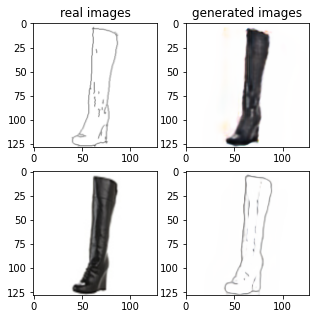

Train Epoch: 2 32% 	Total Loss: 1.263619 	Loss_G_AB: 0.336009	Loss_G_BA: 1.012806	Loss_cycle: 0.353483	Loss_D_A: 0.005691	Loss_D_B: 0.230038
1 66009 T:  1.9252362251281738
Train Epoch: 2 33% 	Total Loss: 1.269970 	Loss_G_AB: 0.267967	Loss_G_BA: 0.998620	Loss_cycle: 0.385565	Loss_D_A: 0.004922	Loss_D_B: 0.246189
1 66019 T:  1.1576323509216309
Train Epoch: 2 33% 	Total Loss: 1.241074 	Loss_G_AB: 0.302769	Loss_G_BA: 0.999573	Loss_cycle: 0.327918	Loss_D_A: 0.002886	Loss_D_B: 0.259099
1 66029 T:  1.149829626083374
Train Epoch: 2 33% 	Total Loss: 1.258813 	Loss_G_AB: 0.320367	Loss_G_BA: 0.993644	Loss_cycle: 0.379625	Loss_D_A: 0.001945	Loss_D_B: 0.220238
1 66039 T:  1.1542274951934814
Train Epoch: 2 33% 	Total Loss: 1.228865 	Loss_G_AB: 0.336133	Loss_G_BA: 1.006917	Loss_cycle: 0.304410	Loss_D_A: 0.002098	Loss_D_B: 0.250831
1 66049 T:  1.147796630859375
Train Epoch: 2 33% 	Total Loss: 1.249427 	Loss_G_AB: 0.250865	Loss_G_BA: 0.989337	Loss_cycle: 0.347828	Loss_D_A: 0.002371	Loss_D_B: 0.279127
1

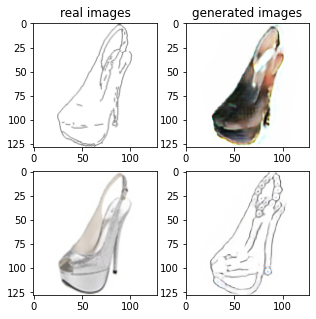

Train Epoch: 2 34% 	Total Loss: 1.240168 	Loss_G_AB: 0.281619	Loss_G_BA: 0.934610	Loss_cycle: 0.338816	Loss_D_A: 0.006056	Loss_D_B: 0.287182
1 67009 T:  1.8629882335662842
Train Epoch: 2 35% 	Total Loss: 1.277693 	Loss_G_AB: 0.280628	Loss_G_BA: 1.046211	Loss_cycle: 0.354353	Loss_D_A: 0.016021	Loss_D_B: 0.243899
1 67019 T:  1.1498515605926514
Train Epoch: 2 35% 	Total Loss: 1.233957 	Loss_G_AB: 0.297220	Loss_G_BA: 0.989988	Loss_cycle: 0.345094	Loss_D_A: 0.007593	Loss_D_B: 0.237666
1 67029 T:  1.1477153301239014
Train Epoch: 2 35% 	Total Loss: 1.308145 	Loss_G_AB: 0.280334	Loss_G_BA: 0.995230	Loss_cycle: 0.425344	Loss_D_A: 0.002502	Loss_D_B: 0.242517
1 67039 T:  1.1540813446044922
Train Epoch: 2 35% 	Total Loss: 1.156139 	Loss_G_AB: 0.285025	Loss_G_BA: 0.988398	Loss_cycle: 0.277900	Loss_D_A: 0.001901	Loss_D_B: 0.239627
1 67049 T:  1.1490490436553955
Train Epoch: 2 35% 	Total Loss: 1.228048 	Loss_G_AB: 0.257020	Loss_G_BA: 0.985632	Loss_cycle: 0.315595	Loss_D_A: 0.002636	Loss_D_B: 0.288491

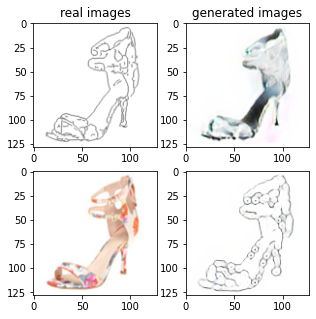

Train Epoch: 2 36% 	Total Loss: 1.361709 	Loss_G_AB: 0.288245	Loss_G_BA: 0.973211	Loss_cycle: 0.392736	Loss_D_A: 0.071853	Loss_D_B: 0.266392
1 68009 T:  1.8656845092773438
Train Epoch: 2 37% 	Total Loss: 1.409885 	Loss_G_AB: 0.278743	Loss_G_BA: 0.868543	Loss_cycle: 0.472831	Loss_D_A: 0.125395	Loss_D_B: 0.238015
1 68019 T:  1.1448345184326172
Train Epoch: 2 37% 	Total Loss: 1.245873 	Loss_G_AB: 0.298715	Loss_G_BA: 0.918678	Loss_cycle: 0.390500	Loss_D_A: 0.016984	Loss_D_B: 0.229692
1 68029 T:  1.1484763622283936
Train Epoch: 2 37% 	Total Loss: 1.251061 	Loss_G_AB: 0.303162	Loss_G_BA: 1.014687	Loss_cycle: 0.350400	Loss_D_A: 0.003781	Loss_D_B: 0.237956
1 68039 T:  1.149104356765747
Train Epoch: 2 37% 	Total Loss: 1.263668 	Loss_G_AB: 0.313806	Loss_G_BA: 0.992076	Loss_cycle: 0.361449	Loss_D_A: 0.023574	Loss_D_B: 0.225703
1 68049 T:  1.1490859985351562
Train Epoch: 2 37% 	Total Loss: 1.284307 	Loss_G_AB: 0.322221	Loss_G_BA: 0.885348	Loss_cycle: 0.364829	Loss_D_A: 0.052738	Loss_D_B: 0.262955


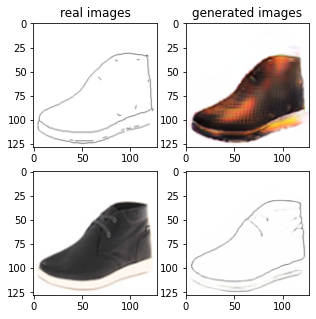

Train Epoch: 2 39% 	Total Loss: 1.179377 	Loss_G_AB: 0.287860	Loss_G_BA: 1.007590	Loss_cycle: 0.282795	Loss_D_A: 0.002891	Loss_D_B: 0.245966
1 69009 T:  1.829643964767456
Train Epoch: 2 39% 	Total Loss: 1.295987 	Loss_G_AB: 0.338026	Loss_G_BA: 0.996962	Loss_cycle: 0.357586	Loss_D_A: 0.002446	Loss_D_B: 0.268460
1 69019 T:  1.1475296020507812
Train Epoch: 2 39% 	Total Loss: 1.171969 	Loss_G_AB: 0.305015	Loss_G_BA: 0.994308	Loss_cycle: 0.291145	Loss_D_A: 0.002533	Loss_D_B: 0.228630
1 69029 T:  1.1494770050048828
Train Epoch: 2 39% 	Total Loss: 1.241123 	Loss_G_AB: 0.298949	Loss_G_BA: 1.016549	Loss_cycle: 0.345556	Loss_D_A: 0.001638	Loss_D_B: 0.236180
1 69039 T:  1.1514079570770264
Train Epoch: 2 39% 	Total Loss: 1.239785 	Loss_G_AB: 0.341662	Loss_G_BA: 0.991591	Loss_cycle: 0.364902	Loss_D_A: 0.001321	Loss_D_B: 0.206935
1 69049 T:  1.1523492336273193
Train Epoch: 2 39% 	Total Loss: 1.267809 	Loss_G_AB: 0.295648	Loss_G_BA: 0.991058	Loss_cycle: 0.347438	Loss_D_A: 0.002057	Loss_D_B: 0.274961


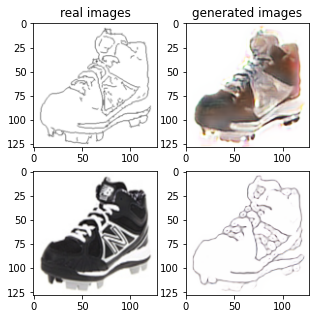

Train Epoch: 2 41% 	Total Loss: 1.281223 	Loss_G_AB: 0.312242	Loss_G_BA: 1.001862	Loss_cycle: 0.370892	Loss_D_A: 0.000975	Loss_D_B: 0.252304
1 70009 T:  1.8335106372833252
Train Epoch: 2 41% 	Total Loss: 1.325198 	Loss_G_AB: 0.268122	Loss_G_BA: 0.996309	Loss_cycle: 0.438498	Loss_D_A: 0.001128	Loss_D_B: 0.253357
1 70019 T:  1.148538589477539
Train Epoch: 2 41% 	Total Loss: 1.256976 	Loss_G_AB: 0.257842	Loss_G_BA: 0.999245	Loss_cycle: 0.358929	Loss_D_A: 0.001101	Loss_D_B: 0.268403
1 70029 T:  1.1485536098480225
Train Epoch: 2 41% 	Total Loss: 1.288918 	Loss_G_AB: 0.252157	Loss_G_BA: 0.993056	Loss_cycle: 0.388124	Loss_D_A: 0.000966	Loss_D_B: 0.277222
1 70039 T:  1.1513762474060059
Train Epoch: 2 41% 	Total Loss: 1.276022 	Loss_G_AB: 0.298881	Loss_G_BA: 0.994523	Loss_cycle: 0.397056	Loss_D_A: 0.001527	Loss_D_B: 0.230737
1 70049 T:  1.1495857238769531
Train Epoch: 2 41% 	Total Loss: 1.187600 	Loss_G_AB: 0.291945	Loss_G_BA: 0.998021	Loss_cycle: 0.301502	Loss_D_A: 0.001291	Loss_D_B: 0.239825


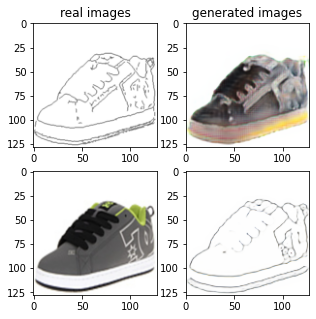

Train Epoch: 2 43% 	Total Loss: 1.239588 	Loss_G_AB: 0.325640	Loss_G_BA: 1.008672	Loss_cycle: 0.340624	Loss_D_A: 0.004784	Loss_D_B: 0.227024
1 71009 T:  1.8444099426269531
Train Epoch: 2 43% 	Total Loss: 1.155536 	Loss_G_AB: 0.298046	Loss_G_BA: 0.987834	Loss_cycle: 0.281266	Loss_D_A: 0.003023	Loss_D_B: 0.228307
1 71019 T:  1.1466989517211914
Train Epoch: 2 43% 	Total Loss: 1.194657 	Loss_G_AB: 0.288927	Loss_G_BA: 0.952679	Loss_cycle: 0.296724	Loss_D_A: 0.031853	Loss_D_B: 0.245277
1 71029 T:  1.1466150283813477
Train Epoch: 2 43% 	Total Loss: 1.270429 	Loss_G_AB: 0.282180	Loss_G_BA: 0.990673	Loss_cycle: 0.361138	Loss_D_A: 0.010493	Loss_D_B: 0.262371
1 71039 T:  1.1449785232543945
Train Epoch: 2 43% 	Total Loss: 1.210049 	Loss_G_AB: 0.262482	Loss_G_BA: 1.000952	Loss_cycle: 0.315315	Loss_D_A: 0.007238	Loss_D_B: 0.255779
1 71049 T:  1.1512880325317383
Train Epoch: 2 43% 	Total Loss: 1.211520 	Loss_G_AB: 0.330869	Loss_G_BA: 1.002075	Loss_cycle: 0.307886	Loss_D_A: 0.006117	Loss_D_B: 0.231045

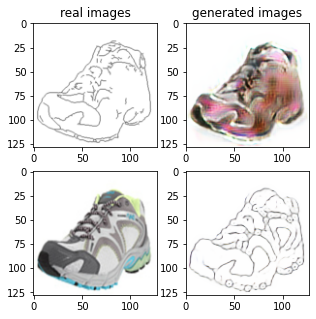

Train Epoch: 2 45% 	Total Loss: 1.300828 	Loss_G_AB: 0.255684	Loss_G_BA: 1.013319	Loss_cycle: 0.357436	Loss_D_A: 0.002438	Loss_D_B: 0.306451
1 72009 T:  1.9426963329315186
Train Epoch: 2 45% 	Total Loss: 1.243920 	Loss_G_AB: 0.296680	Loss_G_BA: 0.980634	Loss_cycle: 0.360618	Loss_D_A: 0.003131	Loss_D_B: 0.241515
1 72019 T:  1.1553447246551514
Train Epoch: 2 45% 	Total Loss: 1.154352 	Loss_G_AB: 0.290727	Loss_G_BA: 0.934101	Loss_cycle: 0.250238	Loss_D_A: 0.048515	Loss_D_B: 0.243185
1 72029 T:  1.1525616645812988
Train Epoch: 2 45% 	Total Loss: 1.200011 	Loss_G_AB: 0.290340	Loss_G_BA: 0.965576	Loss_cycle: 0.305225	Loss_D_A: 0.004558	Loss_D_B: 0.262270
1 72039 T:  1.146270751953125
Train Epoch: 2 45% 	Total Loss: 1.303989 	Loss_G_AB: 0.288126	Loss_G_BA: 0.963163	Loss_cycle: 0.425687	Loss_D_A: 0.003955	Loss_D_B: 0.248703
1 72049 T:  1.1528656482696533
Train Epoch: 2 45% 	Total Loss: 1.249587 	Loss_G_AB: 0.300354	Loss_G_BA: 1.042058	Loss_cycle: 0.306603	Loss_D_A: 0.017046	Loss_D_B: 0.254732


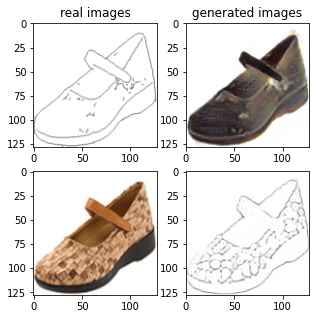

Train Epoch: 2 47% 	Total Loss: 1.202663 	Loss_G_AB: 0.291070	Loss_G_BA: 1.000915	Loss_cycle: 0.311349	Loss_D_A: 0.001893	Loss_D_B: 0.243429
1 73009 T:  1.8343126773834229
Train Epoch: 2 47% 	Total Loss: 1.204453 	Loss_G_AB: 0.288324	Loss_G_BA: 0.988642	Loss_cycle: 0.320620	Loss_D_A: 0.003125	Loss_D_B: 0.242225
1 73019 T:  1.149261236190796
Train Epoch: 2 47% 	Total Loss: 1.163990 	Loss_G_AB: 0.308117	Loss_G_BA: 1.006177	Loss_cycle: 0.264771	Loss_D_A: 0.003728	Loss_D_B: 0.238343
1 73029 T:  1.1501708030700684
Train Epoch: 2 47% 	Total Loss: 1.162184 	Loss_G_AB: 0.285741	Loss_G_BA: 1.006249	Loss_cycle: 0.273577	Loss_D_A: 0.002372	Loss_D_B: 0.240240
1 73039 T:  1.1508064270019531
Train Epoch: 2 47% 	Total Loss: 1.208469 	Loss_G_AB: 0.304594	Loss_G_BA: 0.987495	Loss_cycle: 0.313769	Loss_D_A: 0.001543	Loss_D_B: 0.247113
1 73049 T:  1.152519941329956
Train Epoch: 2 47% 	Total Loss: 1.168497 	Loss_G_AB: 0.314868	Loss_G_BA: 0.991041	Loss_cycle: 0.276937	Loss_D_A: 0.006365	Loss_D_B: 0.232240
1

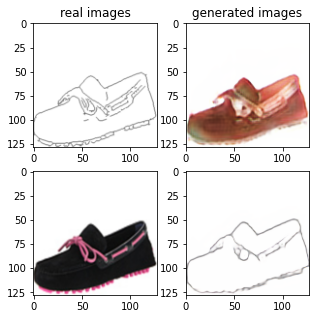

Train Epoch: 2 49% 	Total Loss: 1.255043 	Loss_G_AB: 0.287097	Loss_G_BA: 0.987146	Loss_cycle: 0.376303	Loss_D_A: 0.002608	Loss_D_B: 0.239011
1 74009 T:  1.8266074657440186
Train Epoch: 2 49% 	Total Loss: 1.275032 	Loss_G_AB: 0.293185	Loss_G_BA: 0.969317	Loss_cycle: 0.333497	Loss_D_A: 0.002214	Loss_D_B: 0.308070
1 74019 T:  1.1489839553833008
Train Epoch: 2 49% 	Total Loss: 1.250218 	Loss_G_AB: 0.340874	Loss_G_BA: 1.009035	Loss_cycle: 0.331946	Loss_D_A: 0.003659	Loss_D_B: 0.239658
1 74029 T:  1.1476266384124756
Train Epoch: 2 49% 	Total Loss: 1.258328 	Loss_G_AB: 0.330718	Loss_G_BA: 1.000983	Loss_cycle: 0.356504	Loss_D_A: 0.001613	Loss_D_B: 0.234360
1 74039 T:  1.1494264602661133
Train Epoch: 2 49% 	Total Loss: 1.204093 	Loss_G_AB: 0.284484	Loss_G_BA: 0.989124	Loss_cycle: 0.295451	Loss_D_A: 0.006857	Loss_D_B: 0.264980
1 74049 T:  1.1473469734191895
Train Epoch: 2 49% 	Total Loss: 1.277187 	Loss_G_AB: 0.310410	Loss_G_BA: 1.006365	Loss_cycle: 0.351419	Loss_D_A: 0.002123	Loss_D_B: 0.265257

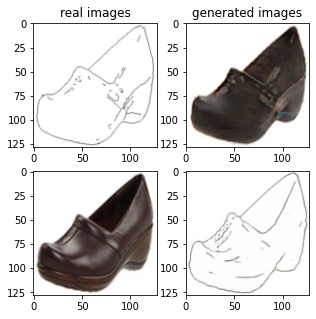

Train Epoch: 2 51% 	Total Loss: 1.255996 	Loss_G_AB: 0.258256	Loss_G_BA: 0.995788	Loss_cycle: 0.350465	Loss_D_A: 0.003343	Loss_D_B: 0.275166
1 75009 T:  1.8399698734283447
Train Epoch: 2 51% 	Total Loss: 1.167501 	Loss_G_AB: 0.317597	Loss_G_BA: 0.993380	Loss_cycle: 0.304250	Loss_D_A: 0.003694	Loss_D_B: 0.204069
1 75019 T:  1.1478173732757568
Train Epoch: 2 51% 	Total Loss: 1.301256 	Loss_G_AB: 0.275366	Loss_G_BA: 0.999850	Loss_cycle: 0.394803	Loss_D_A: 0.001829	Loss_D_B: 0.267016
1 75029 T:  1.1526691913604736
Train Epoch: 2 51% 	Total Loss: 1.177740 	Loss_G_AB: 0.284678	Loss_G_BA: 1.001180	Loss_cycle: 0.291422	Loss_D_A: 0.003337	Loss_D_B: 0.240051
1 75039 T:  1.1535720825195312
Train Epoch: 2 51% 	Total Loss: 1.271975 	Loss_G_AB: 0.290093	Loss_G_BA: 0.998280	Loss_cycle: 0.363079	Loss_D_A: 0.002715	Loss_D_B: 0.261995
1 75049 T:  1.1480140686035156
Train Epoch: 2 51% 	Total Loss: 1.355193 	Loss_G_AB: 0.273648	Loss_G_BA: 1.002946	Loss_cycle: 0.455249	Loss_D_A: 0.002371	Loss_D_B: 0.259276

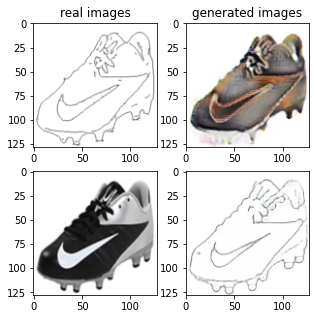

Train Epoch: 2 53% 	Total Loss: 1.274994 	Loss_G_AB: 0.332176	Loss_G_BA: 0.998097	Loss_cycle: 0.381524	Loss_D_A: 0.002708	Loss_D_B: 0.225625
1 76009 T:  1.823451280593872
Train Epoch: 2 53% 	Total Loss: 1.215567 	Loss_G_AB: 0.296314	Loss_G_BA: 0.982471	Loss_cycle: 0.330879	Loss_D_A: 0.004032	Loss_D_B: 0.241264
1 76019 T:  1.1520910263061523
Train Epoch: 2 53% 	Total Loss: 1.338140 	Loss_G_AB: 0.318145	Loss_G_BA: 1.026158	Loss_cycle: 0.425945	Loss_D_A: 0.003817	Loss_D_B: 0.236227
1 76029 T:  1.1475625038146973
Train Epoch: 2 53% 	Total Loss: 1.275489 	Loss_G_AB: 0.271018	Loss_G_BA: 0.999892	Loss_cycle: 0.376467	Loss_D_A: 0.002102	Loss_D_B: 0.261466
1 76039 T:  1.1479623317718506
Train Epoch: 2 53% 	Total Loss: 1.275575 	Loss_G_AB: 0.347968	Loss_G_BA: 1.006778	Loss_cycle: 0.375409	Loss_D_A: 0.002241	Loss_D_B: 0.220552
1 76049 T:  1.1499629020690918
Train Epoch: 2 53% 	Total Loss: 1.284628 	Loss_G_AB: 0.325705	Loss_G_BA: 0.986642	Loss_cycle: 0.396185	Loss_D_A: 0.001766	Loss_D_B: 0.230504


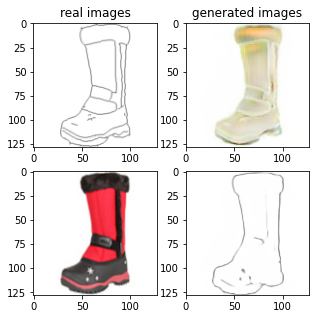

Train Epoch: 2 55% 	Total Loss: 1.280050 	Loss_G_AB: 0.332704	Loss_G_BA: 1.015664	Loss_cycle: 0.355448	Loss_D_A: 0.010929	Loss_D_B: 0.239487
1 77009 T:  1.890284538269043
Train Epoch: 2 55% 	Total Loss: 1.203278 	Loss_G_AB: 0.314131	Loss_G_BA: 0.986868	Loss_cycle: 0.314024	Loss_D_A: 0.004129	Loss_D_B: 0.234626
1 77019 T:  1.1502985954284668
Train Epoch: 2 55% 	Total Loss: 1.286678 	Loss_G_AB: 0.294802	Loss_G_BA: 0.890882	Loss_cycle: 0.371038	Loss_D_A: 0.074493	Loss_D_B: 0.248304
1 77029 T:  1.1477975845336914
Train Epoch: 2 55% 	Total Loss: 1.216601 	Loss_G_AB: 0.356907	Loss_G_BA: 0.829731	Loss_cycle: 0.363309	Loss_D_A: 0.039335	Loss_D_B: 0.220638
1 77039 T:  1.150003433227539
Train Epoch: 2 55% 	Total Loss: 1.270732 	Loss_G_AB: 0.306287	Loss_G_BA: 0.909710	Loss_cycle: 0.359129	Loss_D_A: 0.059242	Loss_D_B: 0.244363
1 77049 T:  1.1451308727264404
Train Epoch: 2 55% 	Total Loss: 1.342170 	Loss_G_AB: 0.299430	Loss_G_BA: 0.948136	Loss_cycle: 0.388839	Loss_D_A: 0.076266	Loss_D_B: 0.253282
1

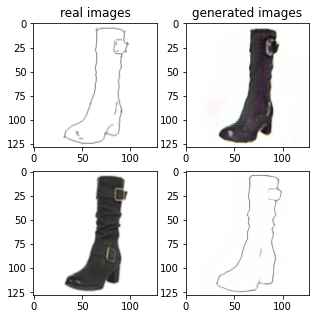

Train Epoch: 2 57% 	Total Loss: 1.274135 	Loss_G_AB: 0.347848	Loss_G_BA: 0.765360	Loss_cycle: 0.385125	Loss_D_A: 0.109951	Loss_D_B: 0.222454
1 78009 T:  1.9422211647033691
Train Epoch: 2 57% 	Total Loss: 1.356489 	Loss_G_AB: 0.380656	Loss_G_BA: 0.886538	Loss_cycle: 0.391245	Loss_D_A: 0.095867	Loss_D_B: 0.235780
1 78019 T:  1.1534693241119385
Train Epoch: 2 57% 	Total Loss: 1.158147 	Loss_G_AB: 0.300785	Loss_G_BA: 0.882549	Loss_cycle: 0.293852	Loss_D_A: 0.022983	Loss_D_B: 0.249646
1 78029 T:  1.1543798446655273
Train Epoch: 2 57% 	Total Loss: 1.293203 	Loss_G_AB: 0.318366	Loss_G_BA: 0.996879	Loss_cycle: 0.397749	Loss_D_A: 0.007054	Loss_D_B: 0.230778
1 78039 T:  1.155561923980713
Train Epoch: 2 57% 	Total Loss: 1.313934 	Loss_G_AB: 0.399125	Loss_G_BA: 0.948613	Loss_cycle: 0.435363	Loss_D_A: 0.008913	Loss_D_B: 0.195790
1 78049 T:  1.1536946296691895
Train Epoch: 2 57% 	Total Loss: 1.205783 	Loss_G_AB: 0.330905	Loss_G_BA: 0.893229	Loss_cycle: 0.317320	Loss_D_A: 0.031805	Loss_D_B: 0.244591


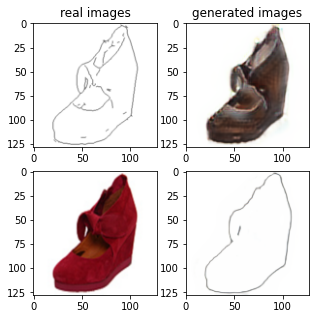

Train Epoch: 2 59% 	Total Loss: 1.333981 	Loss_G_AB: 0.331807	Loss_G_BA: 0.991413	Loss_cycle: 0.408414	Loss_D_A: 0.002133	Loss_D_B: 0.261824
1 79009 T:  1.8516790866851807
Train Epoch: 2 59% 	Total Loss: 1.254876 	Loss_G_AB: 0.392269	Loss_G_BA: 0.947523	Loss_cycle: 0.364699	Loss_D_A: 0.025769	Loss_D_B: 0.194513
1 79019 T:  1.153212070465088
Train Epoch: 2 59% 	Total Loss: 1.196729 	Loss_G_AB: 0.300357	Loss_G_BA: 0.911194	Loss_cycle: 0.285302	Loss_D_A: 0.023950	Loss_D_B: 0.281701
1 79029 T:  1.154069423675537
Train Epoch: 2 59% 	Total Loss: 1.295345 	Loss_G_AB: 0.324145	Loss_G_BA: 1.030380	Loss_cycle: 0.388540	Loss_D_A: 0.012658	Loss_D_B: 0.216884
1 79039 T:  1.148219347000122
Train Epoch: 2 59% 	Total Loss: 1.264339 	Loss_G_AB: 0.316786	Loss_G_BA: 0.985375	Loss_cycle: 0.407685	Loss_D_A: 0.009812	Loss_D_B: 0.195762
1 79049 T:  1.151352882385254
Train Epoch: 2 59% 	Total Loss: 1.191523 	Loss_G_AB: 0.271394	Loss_G_BA: 0.918913	Loss_cycle: 0.306641	Loss_D_A: 0.025253	Loss_D_B: 0.264475
1 7

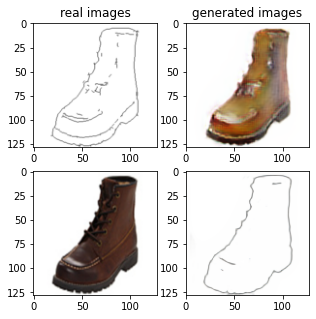

Train Epoch: 2 61% 	Total Loss: 1.264117 	Loss_G_AB: 0.274835	Loss_G_BA: 0.950837	Loss_cycle: 0.405768	Loss_D_A: 0.008577	Loss_D_B: 0.236936
1 80009 T:  1.853349208831787
Train Epoch: 2 61% 	Total Loss: 1.317730 	Loss_G_AB: 0.471606	Loss_G_BA: 0.987533	Loss_cycle: 0.426226	Loss_D_A: 0.007043	Loss_D_B: 0.154891
1 80019 T:  1.15142822265625
Train Epoch: 2 61% 	Total Loss: 1.267317 	Loss_G_AB: 0.289300	Loss_G_BA: 0.997419	Loss_cycle: 0.312776	Loss_D_A: 0.007042	Loss_D_B: 0.304139
1 80029 T:  1.1490044593811035
Train Epoch: 2 61% 	Total Loss: 1.325295 	Loss_G_AB: 0.315826	Loss_G_BA: 1.018404	Loss_cycle: 0.402451	Loss_D_A: 0.002466	Loss_D_B: 0.253263
1 80039 T:  1.1507134437561035
Train Epoch: 2 61% 	Total Loss: 1.227828 	Loss_G_AB: 0.252240	Loss_G_BA: 0.978682	Loss_cycle: 0.336829	Loss_D_A: 0.006073	Loss_D_B: 0.269465
1 80049 T:  1.152829647064209
Train Epoch: 2 61% 	Total Loss: 1.265845 	Loss_G_AB: 0.290661	Loss_G_BA: 1.027022	Loss_cycle: 0.338475	Loss_D_A: 0.003528	Loss_D_B: 0.265001
1 8

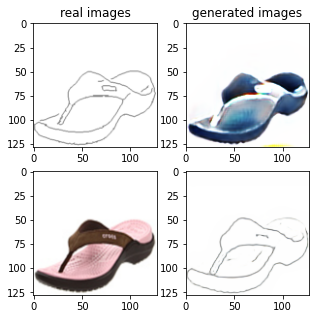

Train Epoch: 2 63% 	Total Loss: 1.264519 	Loss_G_AB: 0.330755	Loss_G_BA: 0.993834	Loss_cycle: 0.365898	Loss_D_A: 0.001674	Loss_D_B: 0.234653
1 81009 T:  1.8419971466064453
Train Epoch: 2 63% 	Total Loss: 1.326253 	Loss_G_AB: 0.313305	Loss_G_BA: 0.999037	Loss_cycle: 0.398917	Loss_D_A: 0.003162	Loss_D_B: 0.268003
1 81019 T:  1.1496434211730957
Train Epoch: 2 63% 	Total Loss: 1.220625 	Loss_G_AB: 0.311231	Loss_G_BA: 1.003278	Loss_cycle: 0.304576	Loss_D_A: 0.001758	Loss_D_B: 0.257037
1 81029 T:  1.149141788482666
Train Epoch: 2 63% 	Total Loss: 1.294947 	Loss_G_AB: 0.366569	Loss_G_BA: 1.005409	Loss_cycle: 0.344480	Loss_D_A: 0.003039	Loss_D_B: 0.261439
1 81039 T:  1.148735523223877
Train Epoch: 2 63% 	Total Loss: 1.217963 	Loss_G_AB: 0.328061	Loss_G_BA: 0.987277	Loss_cycle: 0.326383	Loss_D_A: 0.001771	Loss_D_B: 0.232140
1 81049 T:  1.1531574726104736
Train Epoch: 2 63% 	Total Loss: 1.255624 	Loss_G_AB: 0.309948	Loss_G_BA: 1.012410	Loss_cycle: 0.368699	Loss_D_A: 0.002024	Loss_D_B: 0.223722
1

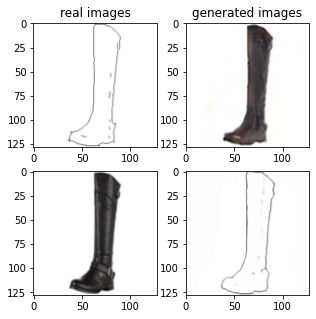

Train Epoch: 2 65% 	Total Loss: 1.236402 	Loss_G_AB: 0.323589	Loss_G_BA: 1.025844	Loss_cycle: 0.325417	Loss_D_A: 0.011979	Loss_D_B: 0.224290
1 82009 T:  1.8300433158874512
Train Epoch: 2 65% 	Total Loss: 1.288297 	Loss_G_AB: 0.305356	Loss_G_BA: 0.982093	Loss_cycle: 0.395836	Loss_D_A: 0.005188	Loss_D_B: 0.243549
1 82019 T:  1.1458461284637451
Train Epoch: 2 65% 	Total Loss: 1.322468 	Loss_G_AB: 0.344487	Loss_G_BA: 0.973930	Loss_cycle: 0.417432	Loss_D_A: 0.005311	Loss_D_B: 0.240517
1 82029 T:  1.154693841934204
Train Epoch: 2 65% 	Total Loss: 1.187308 	Loss_G_AB: 0.295309	Loss_G_BA: 1.020708	Loss_cycle: 0.304247	Loss_D_A: 0.003640	Loss_D_B: 0.221413
1 82039 T:  1.1556549072265625
Train Epoch: 2 65% 	Total Loss: 1.314309 	Loss_G_AB: 0.314306	Loss_G_BA: 1.004794	Loss_cycle: 0.425662	Loss_D_A: 0.003040	Loss_D_B: 0.226058
1 82049 T:  1.1511530876159668
Train Epoch: 2 65% 	Total Loss: 1.156165 	Loss_G_AB: 0.312897	Loss_G_BA: 0.967197	Loss_cycle: 0.255345	Loss_D_A: 0.006904	Loss_D_B: 0.253869


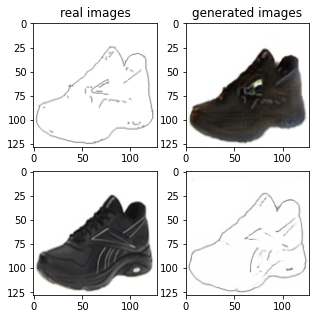

Train Epoch: 2 67% 	Total Loss: 1.141924 	Loss_G_AB: 0.255656	Loss_G_BA: 1.004520	Loss_cycle: 0.258717	Loss_D_A: 0.002415	Loss_D_B: 0.250704
1 83009 T:  1.924210548400879
Train Epoch: 2 67% 	Total Loss: 1.246552 	Loss_G_AB: 0.313848	Loss_G_BA: 0.996044	Loss_cycle: 0.334649	Loss_D_A: 0.001501	Loss_D_B: 0.255457
1 83019 T:  1.1495234966278076
Train Epoch: 2 67% 	Total Loss: 1.275222 	Loss_G_AB: 0.344738	Loss_G_BA: 0.993170	Loss_cycle: 0.400341	Loss_D_A: 0.001401	Loss_D_B: 0.204527
1 83029 T:  1.150514841079712
Train Epoch: 2 67% 	Total Loss: 1.240796 	Loss_G_AB: 0.286470	Loss_G_BA: 0.982622	Loss_cycle: 0.359669	Loss_D_A: 0.001300	Loss_D_B: 0.245281
1 83039 T:  1.148726463317871
Train Epoch: 2 67% 	Total Loss: 1.243275 	Loss_G_AB: 0.285370	Loss_G_BA: 1.016644	Loss_cycle: 0.347323	Loss_D_A: 0.001991	Loss_D_B: 0.242954
1 83049 T:  1.1516246795654297
Train Epoch: 2 67% 	Total Loss: 1.181478 	Loss_G_AB: 0.290509	Loss_G_BA: 0.996353	Loss_cycle: 0.299629	Loss_D_A: 0.001331	Loss_D_B: 0.237086
1 

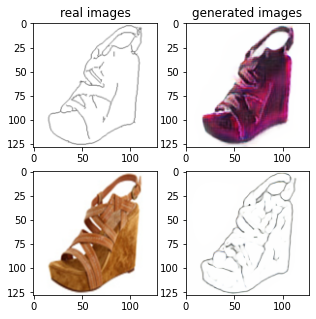

Train Epoch: 2 69% 	Total Loss: 1.366824 	Loss_G_AB: 0.270835	Loss_G_BA: 0.981935	Loss_cycle: 0.328677	Loss_D_A: 0.123638	Loss_D_B: 0.288124
1 84009 T:  1.8424968719482422
Train Epoch: 2 69% 	Total Loss: 1.275258 	Loss_G_AB: 0.386640	Loss_G_BA: 0.960720	Loss_cycle: 0.355955	Loss_D_A: 0.022284	Loss_D_B: 0.223339
1 84019 T:  1.1466395854949951
Train Epoch: 2 69% 	Total Loss: 1.370211 	Loss_G_AB: 0.395927	Loss_G_BA: 0.894561	Loss_cycle: 0.407797	Loss_D_A: 0.055176	Loss_D_B: 0.261994
1 84029 T:  1.1470634937286377
Train Epoch: 2 69% 	Total Loss: 1.242984 	Loss_G_AB: 0.306398	Loss_G_BA: 0.999046	Loss_cycle: 0.333243	Loss_D_A: 0.016872	Loss_D_B: 0.240146
1 84039 T:  1.1498069763183594
Train Epoch: 2 69% 	Total Loss: 1.290784 	Loss_G_AB: 0.312430	Loss_G_BA: 0.962229	Loss_cycle: 0.427344	Loss_D_A: 0.011941	Loss_D_B: 0.214170
1 84049 T:  1.1488447189331055
Train Epoch: 2 69% 	Total Loss: 1.413774 	Loss_G_AB: 0.313113	Loss_G_BA: 1.004714	Loss_cycle: 0.485542	Loss_D_A: 0.003047	Loss_D_B: 0.266272

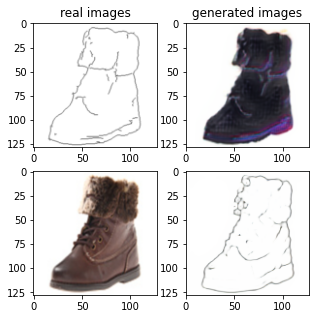

Train Epoch: 2 71% 	Total Loss: 1.297649 	Loss_G_AB: 0.311837	Loss_G_BA: 1.011229	Loss_cycle: 0.384150	Loss_D_A: 0.001790	Loss_D_B: 0.250177
1 85009 T:  1.845268726348877
Train Epoch: 2 71% 	Total Loss: 1.277789 	Loss_G_AB: 0.297095	Loss_G_BA: 0.997944	Loss_cycle: 0.393853	Loss_D_A: 0.001125	Loss_D_B: 0.235291
1 85019 T:  1.1493346691131592
Train Epoch: 2 71% 	Total Loss: 1.107567 	Loss_G_AB: 0.296098	Loss_G_BA: 0.994143	Loss_cycle: 0.241239	Loss_D_A: 0.001906	Loss_D_B: 0.219301
1 85029 T:  1.1461284160614014
Train Epoch: 2 71% 	Total Loss: 1.228103 	Loss_G_AB: 0.267197	Loss_G_BA: 1.004253	Loss_cycle: 0.341472	Loss_D_A: 0.001536	Loss_D_B: 0.249370
1 85039 T:  1.152843713760376
Train Epoch: 2 71% 	Total Loss: 1.197995 	Loss_G_AB: 0.341085	Loss_G_BA: 0.993031	Loss_cycle: 0.317989	Loss_D_A: 0.001908	Loss_D_B: 0.211041
1 85049 T:  1.146765947341919
Train Epoch: 2 71% 	Total Loss: 1.225620 	Loss_G_AB: 0.303757	Loss_G_BA: 0.998422	Loss_cycle: 0.331321	Loss_D_A: 0.001789	Loss_D_B: 0.241420
1 

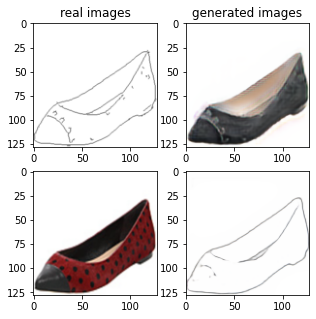

Train Epoch: 2 73% 	Total Loss: 1.157482 	Loss_G_AB: 0.257360	Loss_G_BA: 1.012215	Loss_cycle: 0.246518	Loss_D_A: 0.003957	Loss_D_B: 0.272219
1 86009 T:  1.839045524597168
Train Epoch: 2 73% 	Total Loss: 1.178581 	Loss_G_AB: 0.312205	Loss_G_BA: 0.984300	Loss_cycle: 0.301261	Loss_D_A: 0.007357	Loss_D_B: 0.221711
1 86019 T:  1.1447722911834717
Train Epoch: 2 73% 	Total Loss: 1.229208 	Loss_G_AB: 0.303272	Loss_G_BA: 0.989494	Loss_cycle: 0.329032	Loss_D_A: 0.008995	Loss_D_B: 0.244799
1 86029 T:  1.1541264057159424
Train Epoch: 2 73% 	Total Loss: 1.132157 	Loss_G_AB: 0.354888	Loss_G_BA: 1.006805	Loss_cycle: 0.245019	Loss_D_A: 0.003787	Loss_D_B: 0.202505
1 86039 T:  1.1461668014526367
Train Epoch: 2 73% 	Total Loss: 1.174276 	Loss_G_AB: 0.334099	Loss_G_BA: 1.007919	Loss_cycle: 0.276691	Loss_D_A: 0.005943	Loss_D_B: 0.220633
1 86049 T:  1.1469407081604004
Train Epoch: 2 73% 	Total Loss: 1.269675 	Loss_G_AB: 0.265913	Loss_G_BA: 1.012351	Loss_cycle: 0.362225	Loss_D_A: 0.003220	Loss_D_B: 0.265097


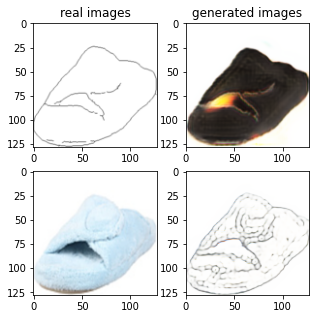

Train Epoch: 2 75% 	Total Loss: 1.169082 	Loss_G_AB: 0.309292	Loss_G_BA: 0.991276	Loss_cycle: 0.253495	Loss_D_A: 0.003044	Loss_D_B: 0.262259
1 87009 T:  1.863940715789795
Train Epoch: 2 75% 	Total Loss: 1.206271 	Loss_G_AB: 0.330999	Loss_G_BA: 0.995334	Loss_cycle: 0.338494	Loss_D_A: 0.002687	Loss_D_B: 0.201923
1 87019 T:  1.1516330242156982
Train Epoch: 2 75% 	Total Loss: 1.234407 	Loss_G_AB: 0.323867	Loss_G_BA: 0.992723	Loss_cycle: 0.330526	Loss_D_A: 0.001905	Loss_D_B: 0.243681
1 87029 T:  1.153874397277832
Train Epoch: 2 75% 	Total Loss: 1.217587 	Loss_G_AB: 0.327166	Loss_G_BA: 0.996935	Loss_cycle: 0.339519	Loss_D_A: 0.001308	Loss_D_B: 0.214710
1 87039 T:  1.1565122604370117
Train Epoch: 2 75% 	Total Loss: 1.241913 	Loss_G_AB: 0.357638	Loss_G_BA: 1.000009	Loss_cycle: 0.336283	Loss_D_A: 0.001970	Loss_D_B: 0.224836
1 87049 T:  1.1538715362548828
Train Epoch: 2 75% 	Total Loss: 1.227066 	Loss_G_AB: 0.350783	Loss_G_BA: 1.016074	Loss_cycle: 0.331455	Loss_D_A: 0.001920	Loss_D_B: 0.210262
1

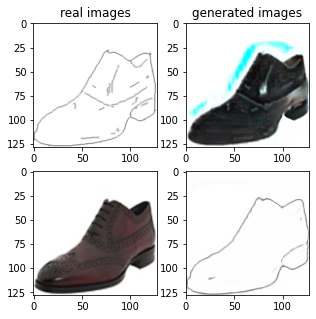

Train Epoch: 2 77% 	Total Loss: 1.167741 	Loss_G_AB: 0.322792	Loss_G_BA: 0.975745	Loss_cycle: 0.279702	Loss_D_A: 0.002914	Loss_D_B: 0.235857
1 88009 T:  1.8734278678894043
Train Epoch: 2 77% 	Total Loss: 1.274118 	Loss_G_AB: 0.313770	Loss_G_BA: 0.989021	Loss_cycle: 0.398940	Loss_D_A: 0.004595	Loss_D_B: 0.219187
1 88019 T:  1.1475176811218262
Train Epoch: 2 77% 	Total Loss: 1.193739 	Loss_G_AB: 0.290296	Loss_G_BA: 1.009496	Loss_cycle: 0.299892	Loss_D_A: 0.001604	Loss_D_B: 0.242347
1 88029 T:  1.1536328792572021
Train Epoch: 2 77% 	Total Loss: 1.211254 	Loss_G_AB: 0.323297	Loss_G_BA: 0.992043	Loss_cycle: 0.312397	Loss_D_A: 0.001151	Loss_D_B: 0.240036
1 88039 T:  1.1519880294799805
Train Epoch: 2 77% 	Total Loss: 1.140391 	Loss_G_AB: 0.283388	Loss_G_BA: 1.012842	Loss_cycle: 0.256675	Loss_D_A: 0.005478	Loss_D_B: 0.230122
1 88049 T:  1.150526523590088
Train Epoch: 2 77% 	Total Loss: 1.372609 	Loss_G_AB: 0.314301	Loss_G_BA: 1.005279	Loss_cycle: 0.441605	Loss_D_A: 0.002142	Loss_D_B: 0.269072


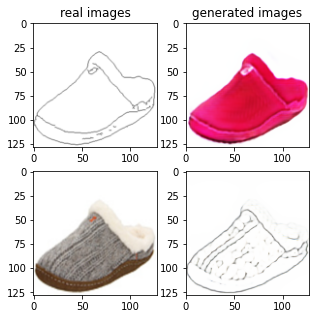

Train Epoch: 2 79% 	Total Loss: 1.314010 	Loss_G_AB: 0.448156	Loss_G_BA: 0.991740	Loss_cycle: 0.413599	Loss_D_A: 0.001615	Loss_D_B: 0.178847
1 89009 T:  1.951263427734375
Train Epoch: 2 79% 	Total Loss: 1.259100 	Loss_G_AB: 0.318812	Loss_G_BA: 1.005464	Loss_cycle: 0.356083	Loss_D_A: 0.002683	Loss_D_B: 0.238196
1 89019 T:  1.1543314456939697
Train Epoch: 2 79% 	Total Loss: 1.347149 	Loss_G_AB: 0.301547	Loss_G_BA: 1.009028	Loss_cycle: 0.407574	Loss_D_A: 0.002274	Loss_D_B: 0.282013
1 89029 T:  1.1530590057373047
Train Epoch: 2 79% 	Total Loss: 1.299616 	Loss_G_AB: 0.316998	Loss_G_BA: 0.996047	Loss_cycle: 0.372253	Loss_D_A: 0.001672	Loss_D_B: 0.269169
1 89039 T:  1.1508424282073975
Train Epoch: 2 79% 	Total Loss: 1.323024 	Loss_G_AB: 0.274490	Loss_G_BA: 1.000026	Loss_cycle: 0.394736	Loss_D_A: 0.002250	Loss_D_B: 0.288780
1 89049 T:  1.1535940170288086
Train Epoch: 2 79% 	Total Loss: 1.168001 	Loss_G_AB: 0.304846	Loss_G_BA: 0.954053	Loss_cycle: 0.272730	Loss_D_A: 0.025243	Loss_D_B: 0.240579


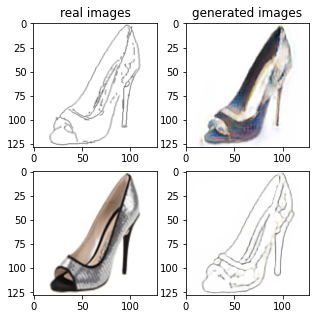

Train Epoch: 2 81% 	Total Loss: 1.183101 	Loss_G_AB: 0.276407	Loss_G_BA: 0.931309	Loss_cycle: 0.292389	Loss_D_A: 0.021781	Loss_D_B: 0.265074
1 90009 T:  1.9257922172546387
Train Epoch: 2 81% 	Total Loss: 1.169312 	Loss_G_AB: 0.284295	Loss_G_BA: 0.990570	Loss_cycle: 0.279515	Loss_D_A: 0.018726	Loss_D_B: 0.233638
1 90019 T:  1.1500608921051025
Train Epoch: 2 81% 	Total Loss: 1.414010 	Loss_G_AB: 0.274316	Loss_G_BA: 0.963996	Loss_cycle: 0.348493	Loss_D_A: 0.180696	Loss_D_B: 0.265664
1 90029 T:  1.1525728702545166
Train Epoch: 2 81% 	Total Loss: 1.298214 	Loss_G_AB: 0.287862	Loss_G_BA: 0.760337	Loss_cycle: 0.300733	Loss_D_A: 0.230975	Loss_D_B: 0.242406
1 90039 T:  1.1544888019561768
Train Epoch: 2 81% 	Total Loss: 1.197231 	Loss_G_AB: 0.314449	Loss_G_BA: 0.804171	Loss_cycle: 0.335815	Loss_D_A: 0.066644	Loss_D_B: 0.235461
1 90049 T:  1.1559054851531982
Train Epoch: 2 81% 	Total Loss: 1.148976 	Loss_G_AB: 0.282419	Loss_G_BA: 0.878786	Loss_cycle: 0.305146	Loss_D_A: 0.013630	Loss_D_B: 0.249597

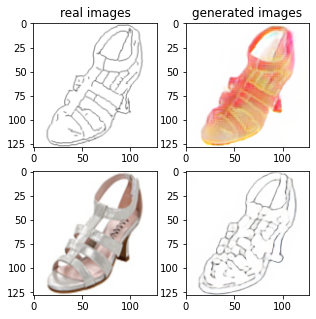

Train Epoch: 2 83% 	Total Loss: 1.251631 	Loss_G_AB: 0.298254	Loss_G_BA: 0.984421	Loss_cycle: 0.373735	Loss_D_A: 0.003400	Loss_D_B: 0.233158
1 91009 T:  1.9083225727081299
Train Epoch: 2 83% 	Total Loss: 1.225991 	Loss_G_AB: 0.286656	Loss_G_BA: 0.986780	Loss_cycle: 0.297063	Loss_D_A: 0.033609	Loss_D_B: 0.258600
1 91019 T:  1.1537561416625977
Train Epoch: 2 83% 	Total Loss: 1.213196 	Loss_G_AB: 0.286051	Loss_G_BA: 0.988765	Loss_cycle: 0.320144	Loss_D_A: 0.004362	Loss_D_B: 0.251283
1 91029 T:  1.1538143157958984
Train Epoch: 2 83% 	Total Loss: 1.137783 	Loss_G_AB: 0.268182	Loss_G_BA: 0.999922	Loss_cycle: 0.255585	Loss_D_A: 0.002933	Loss_D_B: 0.245213
1 91039 T:  1.1491820812225342
Train Epoch: 2 83% 	Total Loss: 1.100680 	Loss_G_AB: 0.279866	Loss_G_BA: 0.993917	Loss_cycle: 0.217065	Loss_D_A: 0.001932	Loss_D_B: 0.244791
1 91049 T:  1.1485564708709717
Train Epoch: 2 83% 	Total Loss: 1.185114 	Loss_G_AB: 0.321785	Loss_G_BA: 0.984120	Loss_cycle: 0.285925	Loss_D_A: 0.014534	Loss_D_B: 0.231702

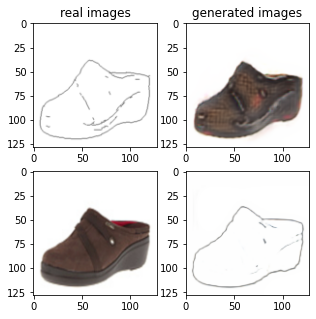

Train Epoch: 2 85% 	Total Loss: 1.174456 	Loss_G_AB: 0.288307	Loss_G_BA: 0.997521	Loss_cycle: 0.287123	Loss_D_A: 0.005315	Loss_D_B: 0.239104
1 92009 T:  1.8583979606628418
Train Epoch: 2 85% 	Total Loss: 1.210896 	Loss_G_AB: 0.269217	Loss_G_BA: 1.007742	Loss_cycle: 0.328459	Loss_D_A: 0.001535	Loss_D_B: 0.242423
1 92019 T:  1.1487805843353271
Train Epoch: 2 85% 	Total Loss: 1.265122 	Loss_G_AB: 0.290644	Loss_G_BA: 1.001851	Loss_cycle: 0.373243	Loss_D_A: 0.000929	Loss_D_B: 0.244703
1 92029 T:  1.147212266921997
Train Epoch: 2 85% 	Total Loss: 1.216406 	Loss_G_AB: 0.305132	Loss_G_BA: 0.994839	Loss_cycle: 0.332029	Loss_D_A: 0.001375	Loss_D_B: 0.233017
1 92039 T:  1.1552233695983887
Train Epoch: 2 85% 	Total Loss: 1.276961 	Loss_G_AB: 0.322507	Loss_G_BA: 1.001128	Loss_cycle: 0.399725	Loss_D_A: 0.001044	Loss_D_B: 0.214375
1 92049 T:  1.1528401374816895
Train Epoch: 2 85% 	Total Loss: 1.337410 	Loss_G_AB: 0.342227	Loss_G_BA: 0.993038	Loss_cycle: 0.447562	Loss_D_A: 0.001459	Loss_D_B: 0.220757


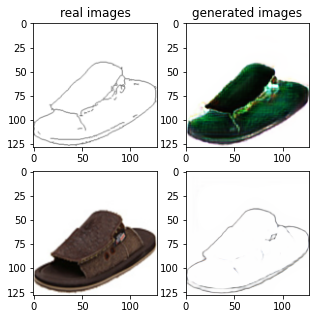

Train Epoch: 2 87% 	Total Loss: 1.174375 	Loss_G_AB: 0.312537	Loss_G_BA: 0.781049	Loss_cycle: 0.342707	Loss_D_A: 0.063996	Loss_D_B: 0.220880
1 93009 T:  1.8563225269317627
Train Epoch: 2 87% 	Total Loss: 1.220819 	Loss_G_AB: 0.318449	Loss_G_BA: 0.938272	Loss_cycle: 0.271204	Loss_D_A: 0.061798	Loss_D_B: 0.259457
1 93019 T:  1.1465215682983398
Train Epoch: 2 87% 	Total Loss: 1.374334 	Loss_G_AB: 0.326873	Loss_G_BA: 1.039522	Loss_cycle: 0.453701	Loss_D_A: 0.014823	Loss_D_B: 0.222613
1 93029 T:  1.1504623889923096
Train Epoch: 2 87% 	Total Loss: 1.286047 	Loss_G_AB: 0.287658	Loss_G_BA: 0.997693	Loss_cycle: 0.396348	Loss_D_A: 0.002600	Loss_D_B: 0.244423
1 93039 T:  1.146299123764038
Train Epoch: 2 87% 	Total Loss: 1.262862 	Loss_G_AB: 0.336041	Loss_G_BA: 1.003939	Loss_cycle: 0.370182	Loss_D_A: 0.001844	Loss_D_B: 0.220846
1 93049 T:  1.1493136882781982
Train Epoch: 2 87% 	Total Loss: 1.180813 	Loss_G_AB: 0.351269	Loss_G_BA: 0.999572	Loss_cycle: 0.294141	Loss_D_A: 0.002706	Loss_D_B: 0.208545


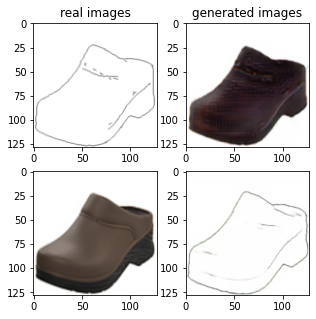

Train Epoch: 2 89% 	Total Loss: 1.198637 	Loss_G_AB: 0.308958	Loss_G_BA: 1.010129	Loss_cycle: 0.293468	Loss_D_A: 0.004649	Loss_D_B: 0.240976
1 94009 T:  1.8612148761749268
Train Epoch: 2 89% 	Total Loss: 1.220493 	Loss_G_AB: 0.280674	Loss_G_BA: 0.987984	Loss_cycle: 0.334401	Loss_D_A: 0.001845	Loss_D_B: 0.249918
1 94019 T:  1.152846097946167
Train Epoch: 2 89% 	Total Loss: 1.194132 	Loss_G_AB: 0.350047	Loss_G_BA: 0.999011	Loss_cycle: 0.286882	Loss_D_A: 0.002927	Loss_D_B: 0.229794
1 94029 T:  1.1531591415405273
Train Epoch: 2 89% 	Total Loss: 1.248701 	Loss_G_AB: 0.289290	Loss_G_BA: 0.990407	Loss_cycle: 0.352038	Loss_D_A: 0.005783	Loss_D_B: 0.251031
1 94039 T:  1.1518709659576416
Train Epoch: 2 89% 	Total Loss: 1.263396 	Loss_G_AB: 0.306814	Loss_G_BA: 1.018930	Loss_cycle: 0.341184	Loss_D_A: 0.009393	Loss_D_B: 0.249947
1 94049 T:  1.151773452758789
Train Epoch: 2 89% 	Total Loss: 1.204025 	Loss_G_AB: 0.305958	Loss_G_BA: 1.010110	Loss_cycle: 0.293032	Loss_D_A: 0.004845	Loss_D_B: 0.248113
1

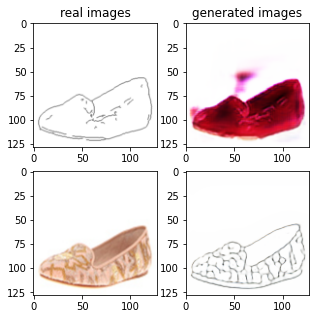

Train Epoch: 2 91% 	Total Loss: 1.311209 	Loss_G_AB: 0.280114	Loss_G_BA: 0.988635	Loss_cycle: 0.386986	Loss_D_A: 0.006130	Loss_D_B: 0.283719
1 95009 T:  1.9582281112670898
Train Epoch: 2 91% 	Total Loss: 1.226844 	Loss_G_AB: 0.339654	Loss_G_BA: 0.980037	Loss_cycle: 0.311835	Loss_D_A: 0.008256	Loss_D_B: 0.246907
1 95019 T:  1.1463027000427246
Train Epoch: 2 91% 	Total Loss: 1.231239 	Loss_G_AB: 0.282797	Loss_G_BA: 1.026851	Loss_cycle: 0.311606	Loss_D_A: 0.005831	Loss_D_B: 0.258977
1 95029 T:  1.1523644924163818
Train Epoch: 2 91% 	Total Loss: 1.305760 	Loss_G_AB: 0.290891	Loss_G_BA: 0.998407	Loss_cycle: 0.398221	Loss_D_A: 0.002296	Loss_D_B: 0.260594
1 95039 T:  1.1525163650512695
Train Epoch: 2 91% 	Total Loss: 1.161338 	Loss_G_AB: 0.284580	Loss_G_BA: 0.973667	Loss_cycle: 0.290279	Loss_D_A: 0.006299	Loss_D_B: 0.235636
1 95049 T:  1.1556217670440674
Train Epoch: 2 91% 	Total Loss: 1.224398 	Loss_G_AB: 0.302811	Loss_G_BA: 1.003876	Loss_cycle: 0.298938	Loss_D_A: 0.002418	Loss_D_B: 0.269698

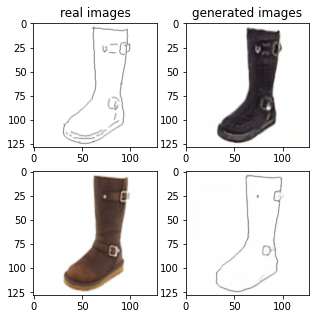

Train Epoch: 2 93% 	Total Loss: 1.312065 	Loss_G_AB: 0.299150	Loss_G_BA: 1.005314	Loss_cycle: 0.437444	Loss_D_A: 0.001474	Loss_D_B: 0.220915
1 96009 T:  1.8680086135864258
Train Epoch: 2 93% 	Total Loss: 1.242959 	Loss_G_AB: 0.270631	Loss_G_BA: 0.995343	Loss_cycle: 0.331970	Loss_D_A: 0.002118	Loss_D_B: 0.275884
1 96019 T:  1.153639554977417
Train Epoch: 2 93% 	Total Loss: 1.299227 	Loss_G_AB: 0.303582	Loss_G_BA: 1.005180	Loss_cycle: 0.390242	Loss_D_A: 0.001401	Loss_D_B: 0.253203
1 96029 T:  1.1562457084655762
Train Epoch: 2 93% 	Total Loss: 1.278659 	Loss_G_AB: 0.280394	Loss_G_BA: 0.997469	Loss_cycle: 0.386352	Loss_D_A: 0.000896	Loss_D_B: 0.252478
1 96039 T:  1.1586623191833496
Train Epoch: 2 93% 	Total Loss: 1.190101 	Loss_G_AB: 0.280747	Loss_G_BA: 1.003210	Loss_cycle: 0.289426	Loss_D_A: 0.001191	Loss_D_B: 0.257504
1 96049 T:  1.1550822257995605
Train Epoch: 2 93% 	Total Loss: 1.185564 	Loss_G_AB: 0.295859	Loss_G_BA: 0.994147	Loss_cycle: 0.320533	Loss_D_A: 0.000990	Loss_D_B: 0.219038


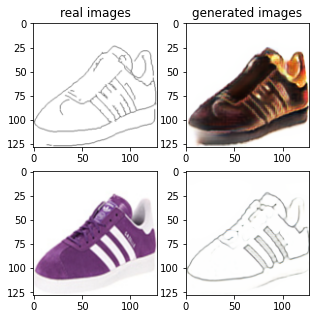

Train Epoch: 2 95% 	Total Loss: 1.262613 	Loss_G_AB: 0.336143	Loss_G_BA: 1.007471	Loss_cycle: 0.359567	Loss_D_A: 0.002695	Loss_D_B: 0.228545
1 97009 T:  1.9012250900268555
Train Epoch: 2 95% 	Total Loss: 1.218130 	Loss_G_AB: 0.303292	Loss_G_BA: 1.000995	Loss_cycle: 0.324925	Loss_D_A: 0.001368	Loss_D_B: 0.239693
1 97019 T:  1.1546285152435303
Train Epoch: 2 95% 	Total Loss: 1.217464 	Loss_G_AB: 0.300165	Loss_G_BA: 0.979047	Loss_cycle: 0.323165	Loss_D_A: 0.002037	Loss_D_B: 0.252656
1 97029 T:  1.1517064571380615
Train Epoch: 2 95% 	Total Loss: 1.222983 	Loss_G_AB: 0.300039	Loss_G_BA: 1.024733	Loss_cycle: 0.286397	Loss_D_A: 0.009345	Loss_D_B: 0.264854
1 97039 T:  1.1538524627685547
Train Epoch: 2 95% 	Total Loss: 1.248779 	Loss_G_AB: 0.246134	Loss_G_BA: 1.000135	Loss_cycle: 0.343976	Loss_D_A: 0.001800	Loss_D_B: 0.279868
1 97049 T:  1.1537935733795166
Train Epoch: 2 95% 	Total Loss: 1.292524 	Loss_G_AB: 0.325021	Loss_G_BA: 0.993257	Loss_cycle: 0.403303	Loss_D_A: 0.001436	Loss_D_B: 0.228646

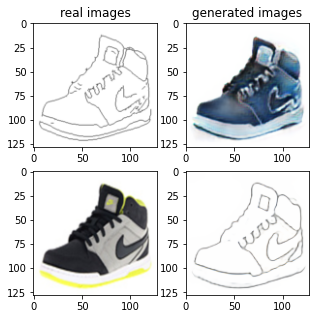

Train Epoch: 2 97% 	Total Loss: 1.256744 	Loss_G_AB: 0.276599	Loss_G_BA: 0.997330	Loss_cycle: 0.347123	Loss_D_A: 0.001296	Loss_D_B: 0.271360
1 98009 T:  1.9397413730621338
Train Epoch: 2 97% 	Total Loss: 1.269850 	Loss_G_AB: 0.308883	Loss_G_BA: 0.996230	Loss_cycle: 0.382010	Loss_D_A: 0.002172	Loss_D_B: 0.233111
1 98019 T:  1.1494472026824951
Train Epoch: 2 97% 	Total Loss: 1.198921 	Loss_G_AB: 0.324320	Loss_G_BA: 0.995202	Loss_cycle: 0.299723	Loss_D_A: 0.001061	Loss_D_B: 0.238376
1 98029 T:  1.1475317478179932
Train Epoch: 2 97% 	Total Loss: 1.235968 	Loss_G_AB: 0.343540	Loss_G_BA: 0.996356	Loss_cycle: 0.337189	Loss_D_A: 0.001123	Loss_D_B: 0.227708
1 98039 T:  1.1523890495300293
Train Epoch: 2 97% 	Total Loss: 1.197918 	Loss_G_AB: 0.259127	Loss_G_BA: 1.015248	Loss_cycle: 0.284039	Loss_D_A: 0.001081	Loss_D_B: 0.275611
1 98049 T:  1.145376205444336
Train Epoch: 2 97% 	Total Loss: 1.146028 	Loss_G_AB: 0.316175	Loss_G_BA: 0.994915	Loss_cycle: 0.234767	Loss_D_A: 0.001492	Loss_D_B: 0.254224


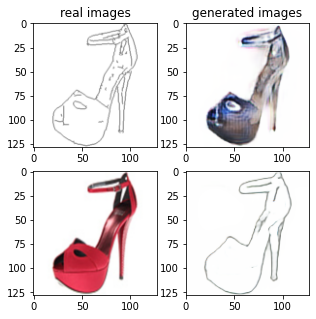

Train Epoch: 2 99% 	Total Loss: 1.188946 	Loss_G_AB: 0.312908	Loss_G_BA: 1.016383	Loss_cycle: 0.303455	Loss_D_A: 0.004460	Loss_D_B: 0.216386
1 99009 T:  1.899181604385376
Train Epoch: 2 99% 	Total Loss: 1.192960 	Loss_G_AB: 0.292893	Loss_G_BA: 0.977649	Loss_cycle: 0.291289	Loss_D_A: 0.003858	Loss_D_B: 0.262542
1 99019 T:  1.1478474140167236
Train Epoch: 2 99% 	Total Loss: 1.226305 	Loss_G_AB: 0.300055	Loss_G_BA: 0.918708	Loss_cycle: 0.357712	Loss_D_A: 0.009218	Loss_D_B: 0.249994
1 99029 T:  1.1509547233581543
Train Epoch: 2 99% 	Total Loss: 1.234183 	Loss_G_AB: 0.302835	Loss_G_BA: 1.055329	Loss_cycle: 0.293915	Loss_D_A: 0.015927	Loss_D_B: 0.245259
1 99039 T:  1.1575329303741455
Train Epoch: 2 99% 	Total Loss: 1.237776 	Loss_G_AB: 0.475523	Loss_G_BA: 1.008185	Loss_cycle: 0.334382	Loss_D_A: 0.011599	Loss_D_B: 0.149941
1 99049 T:  1.148169755935669
Train Epoch: 2 99% 	Total Loss: 1.314630 	Loss_G_AB: 0.298325	Loss_G_BA: 0.711253	Loss_cycle: 0.390128	Loss_D_A: 0.130981	Loss_D_B: 0.288732
1

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
DRIVE_MOUNT='/content/drive'
cis6800=os.path.join(DRIVE_MOUNT, 'My Drive', 'CIS6800')
HOMEWORK_FOLDER=os.path.join(cis6800, 'CycleGAN')
os.makedirs(HOMEWORK_FOLDER, exist_ok=True)

train_img_dir = './edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A_list = []
loss_D_B_list = []
loss_GAN_AB_list = []
loss_GAN_BA_list = []
loss_cycle_list = []
total_loss_list = []
# Training
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A.detach(), D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B.detach(), D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()


        



        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq, 
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq, 
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq, 
                    running_loss_D_B/report_feq))
            loss_D_A_list.append(running_loss_D_A/report_feq)
            loss_D_B_list.append(running_loss_D_B/report_feq)
            loss_GAN_AB_list.append(running_loss_GAN_AB/report_feq)
            loss_GAN_BA_list.append(running_loss_GAN_BA/report_feq)
            loss_cycle_list.append(running_loss_cycle/report_feq)
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))	
            
            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, HOMEWORK_FOLDER + '/G_AB.pt') #'/content/models/G_AB.pt'
            torch.save(G_BA, HOMEWORK_FOLDER + '/G_BA.pt')
            loss_list = [loss_D_A_list,loss_D_B_list,loss_GAN_AB_list,loss_GAN_BA_list,loss_cycle_list]
            torch.save({'loss_list':loss_list},HOMEWORK_FOLDER+'/loss.pt')

            # feel free to save checkpoint if you need retrain the model...

        step += 1

# CycleGAN testing

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load( HOMEWORK_FOLDER + '/G_AB.pt')
G_BA = torch.load( HOMEWORK_FOLDER + '/G_BA.pt')
if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

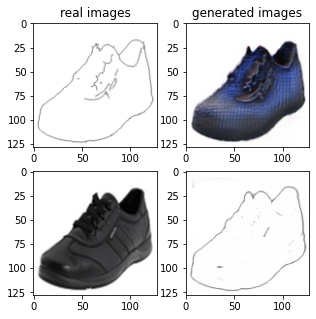

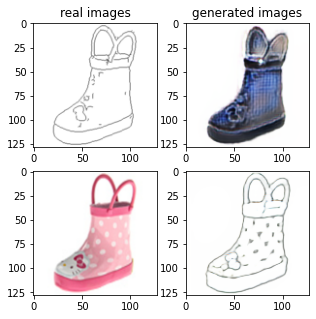

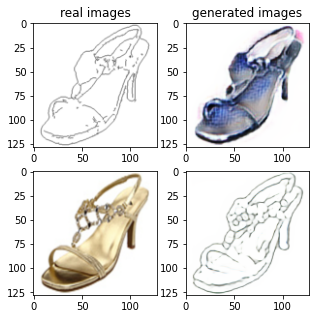

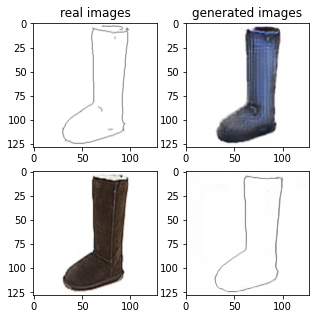

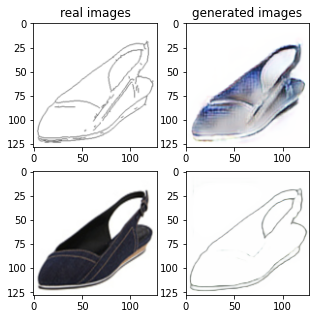

In [ ]:
G_AB.eval()
G_BA.eval()

################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:

################################        
with torch.no_grad():
  for idx, data in enumerate(train_loader):
    edge_tensor, rgb_tensor = data
    edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
    real_A = edge_tensor; real_B = rgb_tensor;
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    vis_fake_A = denorm(fake_A[0]).cpu().data.numpy().astype(np.uint8)
    vis_fake_B = denorm(fake_B[0]).cpu().data.numpy().astype(np.uint8)
    vis_real_B = denorm(real_B[0]).cpu().data.numpy().astype(np.uint8)
    vis_real_A = denorm(real_A[0]).cpu().data.numpy().astype(np.uint8)

    fig, axs = plt.subplots(2,2, figsize = (5,5))	
    axs[0,0].imshow(vis_real_A.transpose(1,2,0))
    axs[0,0].set_title('real images')
    axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
    axs[0,1].set_title('generated images')
    axs[1,0].imshow(vis_real_B.transpose(1,2,0))
    axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
    plt.savefig(HOMEWORK_FOLDER+'cycleGan_vis'+str(idx)+'.png')
    plt.show()
    if idx == 4:
      break


In [7]:
import torch
import numpy as np
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
loss_list = torch.load('loss.pt')
print(loss_list)
# loss_list = loss_list.to(device)
x = loss_list.keys()

{'loss_list': [[1.373503363132477, 0.946859872341156, 0.6951037108898163, 0.5380471885204315, 0.582827416062355, 0.32378646433353425, 0.3973216414451599, 0.35658830404281616, 0.2538209557533264, 0.2850199341773987, 0.2787051245570183, 0.21780240088701247, 0.25611051470041274, 0.22863395810127257, 0.19941629320383072, 0.21503280699253083, 0.19663694649934768, 0.2215755969285965, 0.21000143587589265, 0.20345488041639329, 0.17855599150061607, 0.17444886714220048, 0.15833013877272606, 0.2034343257546425, 0.21724696904420854, 0.20862749069929123, 0.19543189108371734, 0.1846593976020813, 0.277318163216114, 0.16575847417116166, 0.15199170112609864, 0.24512453377246857, 0.1342942789196968, 0.14297555834054948, 0.21468113511800765, 0.16933098956942558, 0.2542465329170227, 0.17434616535902023, 0.14201232343912124, 0.1572381377220154, 0.11452363431453705, 0.09742082953453064, 0.1683121595531702, 0.14689458757638932, 0.1460156925022602, 0.1765536315739155, 0.11984553150832652, 0.17497292309999465,

In [13]:
loss_ = np.array(loss_list['loss_list'])
loss_D_A_list = loss_[0,:]
loss_D_B_list = loss_[1,:]
loss_GAN_AB_list = loss_[2,:]
loss_GAN_BA_list = loss_[3,:]
loss_cycle_list = loss_[4,:]

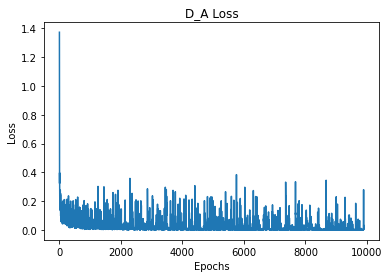

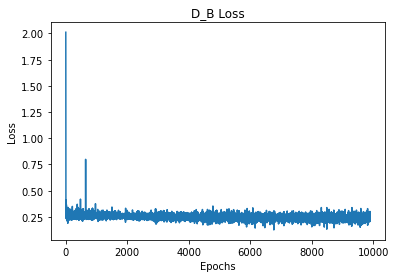

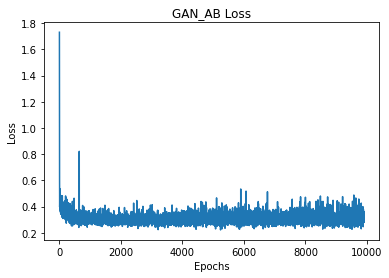

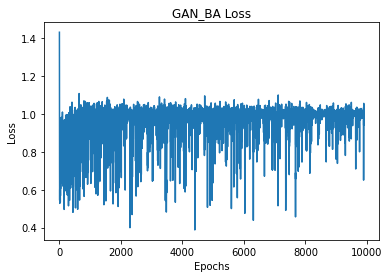

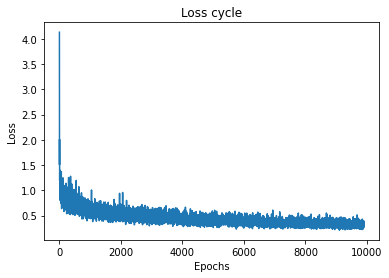

In [17]:
import matplotlib.pyplot as plt


plt.plot(loss_D_A_list)
plt.title("D_A Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.legend()
plt.show()

plt.plot(loss_D_B_list)
plt.title("D_B Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.legend()
plt.show()

plt.plot(loss_GAN_AB_list)
plt.title("GAN_AB Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.legend()
plt.show()

plt.plot(loss_GAN_BA_list)
plt.title("GAN_BA Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.legend()
plt.show()

plt.plot(loss_cycle_list)
plt.title("Loss cycle")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.legend()
plt.show()

# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [ ]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [ ]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load( HOMEWORK_FOLDER + '/G_AB.pt').to(device)
G_BA = torch.load( HOMEWORK_FOLDER + '/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)
    
    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))
        
        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)
    
    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))

## Compute FID score

In [ ]:
! pip install pytorch-fid

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pytorch-fid: filename=pytorch_fid-0.2.1-py3-none-any.whl size=14834 sha256=aecae25874fe8f695db49e4875333ad7eb7693d3067e40a5bf11cb1107b0d6e2
  Stored in directory: /root/.cache/pip/wheels/df/c8/a0/cce2ed7671ae52be132ae836e429bba6148544f83b7962b4bc
Successfully built pytorch-fid


In [ ]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2'

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' 

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' 

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' 

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:01<00:00, 73.6MB/s]
100% 2/2 [00:00<00:00,  2.72it/s]
100% 2/2 [00:00<00:00,  3.37it/s]
FID:  50.2919784957609
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  2.24it/s]
100% 2/2 [00:00<00:00,  2.08it/s]
FID:  82.94201375647529
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  2.78it/s]
100% 2/2 [00:00<00:00,  3.26it/s]
FID:  59.27425177734091
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  2.85it/s]
100% 2/2 [00:00<00:00,  3.26it/s]
FID:  118.00862866169714


## Compute IS score

In [ ]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

(1.0032778922209455, 0.0)
IS score for gen_edge data set:
(1.0062021941467845, 0.0)
IS score for real_shoe_1:
(3.9394650154748225, 0.0)
IS score for gen_shoe data set:
(3.1682516069854167, 0.0)


In [18]:
!sudo apt-get update &> /dev/null
!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-generic-recommended &> /dev/null
!jupyter nbconvert --to pdf CIS680_Fall2020_HW5_CycleGAN_AH_RB.ipynb